In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
from scipy.optimize import curve_fit

import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('poster')

1)      Relative FL

2)      Breakdown by diversity, plot each # of strains together (color by # of strains)

3)      Box plots: growth rate, decline rate, FL @ 40 and 60 days – by diversity, by strain

4)      PCA 3 dimension

5)      What combinations are clustered non-randomly (e.g. PCA, tSNE)

In [2]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_log_error

In [3]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


In [4]:
sns.set_style('white')
sns.set_context('poster')

In [5]:
ppallete = 'RdYlGn'#'YlGn_d' #"BuGn_d"
porder = ['MIT0604', 'MIT9312', 'MED4', 'Natl2A', 'MIT9313']
ppallete = ['#f79934', '#face6e', '#62A586', '#7A9BC8', '#F47681', ]
# #ffd7a1
    
pedge = 'green'
apallete = "spring"
aorder = ['DE', 'DE1', '1A3', 'ATCC', 'BS11']
aedge='orange'
epallete = ['#6cf0ba', '#d13f75', '#eeb7cb', '#b9d2d8', '#407f90']
#sns.diverging_palette(355, 217, s=74, l=50, n=4) #'Paired' # 'BrBG'# "coolwarm"
eorder = ['e1','e3', 'e4', 'e5', 'e6']
#aedge='orange'

espallete = ['#6cf0ba', '#D55282', '#538B9B']
#  604 #FCC479
#     #ffd7a1
#     #fcb14c
#     MED4 = #62A586
#     9313 #F47681
#     natl #7A9BC8

In [6]:
MIT0604_color = '#f79934'
MIT9312_color = '#face6e'
MED4_color = '#62A586'
Natl2A_color = '#7A9BC8'
MIT9313_color = '#F47681'
SYN_color = '#6cf0ba'
syn_0606_color = '#d13f75'
syn_natl_color = '#eeb7cb'
syn_natl_0604_color = '#b9d2d8'
other_color = 'lightgrey'
syn_natl_color = '#4ec4cf' #'#54a4ba' # '#6cf0e1'
syn_0606_color = '#dffc03' #'#8df06c'
natl_0604_color = '#70d156' #'#2e6e54'
syn_natl_0604_color = '#2e6e54'
SYN_color = '#6cf0ba'
ppallete = ['#f79934', '#face6e', '#62A586', '#7A9BC8', '#F47681', SYN_color]


color_dict = {
'MIT0604' : '#f79934',
'MIT9312' : '#face6e',
'MED4' : '#62A586',
'NATL2A' :  '#7A9BC8',
'MIT9313' : '#F47681',
'Syn WH8102' : '#6cf0ba',
}

In [7]:
species = ['MIT0604', 'MIT9312', 'MED4', 'NATL2A', 'MIT9313', 'Syn WH8102']

In [8]:
os.listdir('6x6')

['6x6_setup.csv', 'fl_exp1.csv', 'fl_exp2.csv', 'fl_exp3.csv']

In [9]:
setup_columns = ['Sample', 'MED4', '9313', '9312', 'NATL2A', 'MIT0604', 'Syn WH8102',
       'Total tubes', 'how many in 1 tube ?']
use_setup_columns = ['Sample', 'MED4', '9313', '9312', 'NATL2A', 'MIT0604', 'Syn WH8102']

setup_df = pd.read_csv(os.path.join('6x6', '6x6_setup.csv'), names=setup_columns, usecols=use_setup_columns)

In [10]:
setup_df.dropna(axis=0, subset=['Sample'], inplace=True)

In [11]:
for c in setup_df.columns:
    setup_df[c] = pd.to_numeric(setup_df[c], downcast='integer')

In [12]:
setup_df.rename(columns={'9313' : 'MIT9313', '9312':'MIT9312'}, inplace=True)

In [13]:
setup_df.head()

,Sample,MED4,MIT9313,MIT9312,NATL2A,MIT0604,Syn WH8102
2,1,1.0,NaN,NaN,NaN,NaN,NaN
3,2,NaN,2.0,NaN,NaN,NaN,NaN
4,3,NaN,NaN,3.0,NaN,NaN,NaN
5,4,NaN,NaN,NaN,4.0,NaN,NaN
6,5,NaN,NaN,NaN,NaN,5.0,NaN


In [14]:
exp1_df = pd.read_csv(os.path.join('6x6', 'fl_exp1.csv'))
exp2_df = pd.read_csv(os.path.join('6x6', 'fl_exp2.csv'))

In [15]:
exp1_df = pd.melt(exp1_df, id_vars=['Date', 'Day'], value_name='FL', var_name='Sample')
exp2_df = pd.melt(exp2_df, id_vars=['Date', 'Day'], value_name='FL', var_name='Sample')

In [16]:
exp1_df.head()

,Date,Day,Sample,FL
0,6/20/2019 12:19,0.000000,1A,0.172
1,6/21/2019 16:03,1.155556,1A,0.250
2,6/23/2019 13:56,3.067361,1A,0.482
3,6/24/2019 12:22,4.002083,1A,0.703
4,6/25/2019 9:00,4.861806,1A,0.781


In [17]:
exp2_df.head()

,Date,Day,Sample,FL
0,7/29/2019 14:54,0.000000,1A,0.009
1,7/31/2019 14:54,2.000000,1A,0.019
2,8/1/2019 12:28,2.898611,1A,-0.019
3,8/4/2019 16:32,6.068056,1A,0.028
4,8/6/2019 13:10,7.927778,1A,0.009


In [18]:
exp1_df['sample_prefix'] = pd.to_numeric(exp1_df.Sample.str.rstrip('[ABCDEFGH]'))
exp2_df['sample_prefix'] = pd.to_numeric(exp2_df.Sample.str.rstrip('[ABCDEFGH]'))

In [19]:
exp1_df['experiment'] = 'e1'
exp2_df['experiment'] = 'e2'

In [20]:
setup_df.index = setup_df.Sample

In [21]:
tmp_df = setup_df.drop(columns=['Sample']).notna()

In [22]:
tmp_df['num_of_species'] = tmp_df.sum(axis=1)

In [23]:
tmp_df['ssp'] = pd.melt(setup_df, id_vars=['Sample']).dropna().groupby('Sample')['variable'].unique().str.join(',')

In [24]:
exp1_df = pd.merge(exp1_df, tmp_df, how='left', left_on='sample_prefix', right_index=True)
exp2_df = pd.merge(exp2_df, tmp_df, how='left', left_on='sample_prefix', right_index=True)

In [25]:
exp1_df.loc[exp1_df['FL']< 0.05,'FL'] = 0.05
exp2_df.loc[exp2_df['FL']< 0.05,'FL'] = 0.05

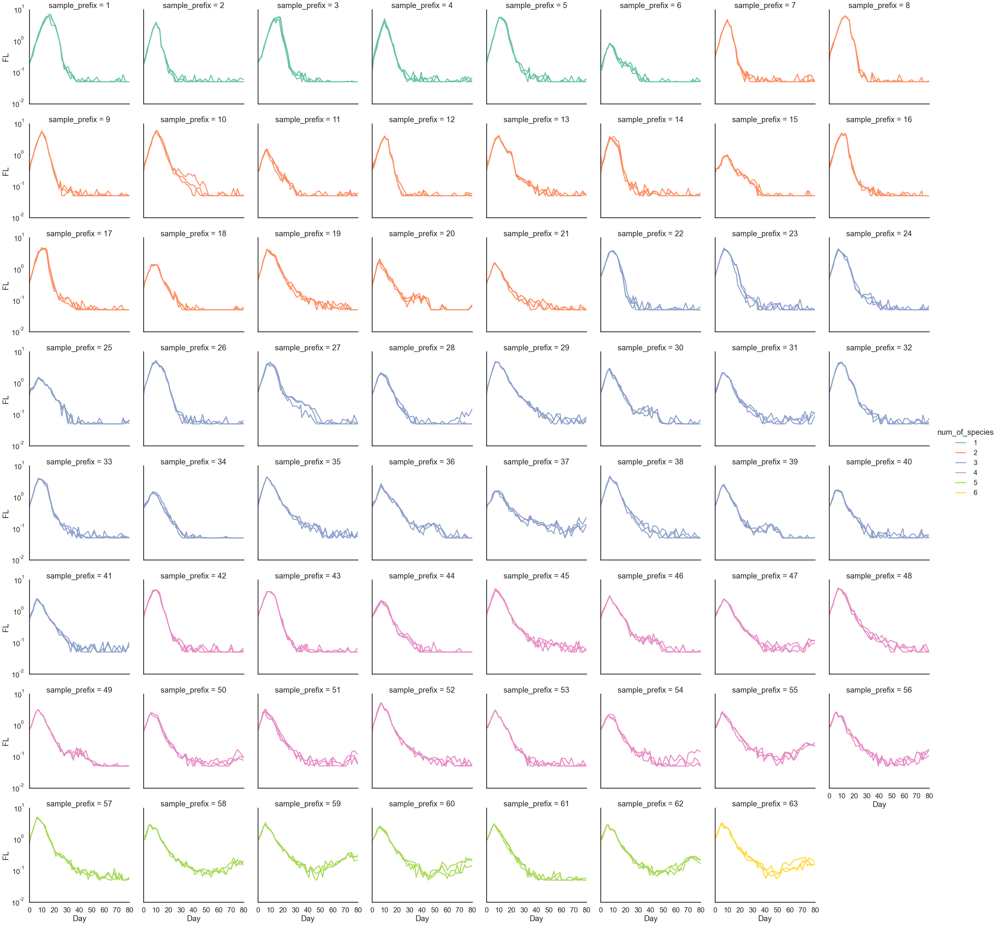

In [26]:
g = sns.relplot(data=exp1_df, x='Day', y='FL', col='sample_prefix', col_wrap=8, kind='line', #ci='sd',
                            estimator=None, units='Sample',

                hue='num_of_species', palette='Set2', legend='full')
g.set(yscale='log')

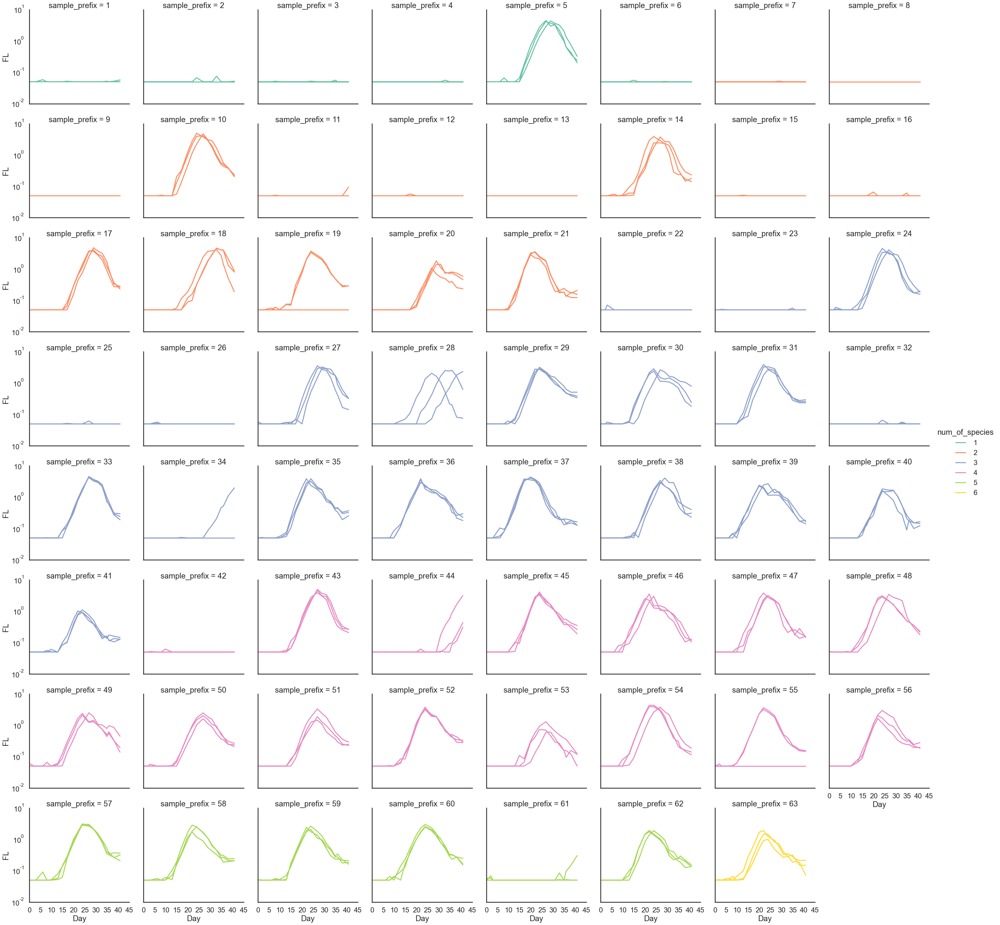

In [27]:
g = sns.relplot(data=exp2_df, x='Day', y='FL', col='sample_prefix', col_wrap=8, kind='line', #ci='sd', 
                            estimator=None, units='Sample',

                hue='num_of_species', palette='Set2', legend='full')
g.set(yscale='log')

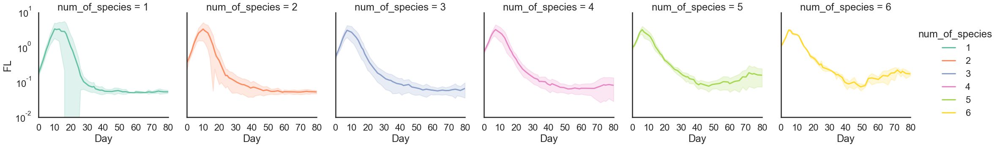

In [28]:
g = sns.relplot(data=exp1_df, x='Day', y='FL', col='num_of_species', kind='line', ci='sd',
                hue='num_of_species', palette='Set2', legend='full')
               
g.set(yscale='log')

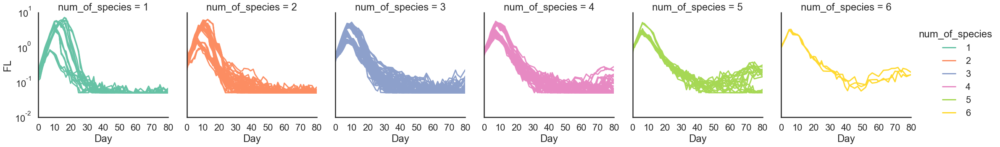

In [29]:
g = sns.relplot(data=exp1_df, x='Day', y='FL', col='num_of_species', kind='line', #ci='sd',
                            estimator=None, units='Sample',
                hue='num_of_species', palette='Set2', legend='full')
               
g.set(yscale='log')

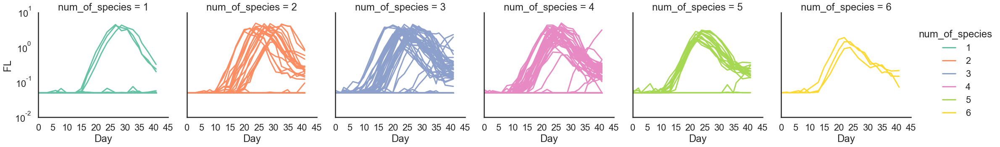

In [30]:
g = sns.relplot(data=exp2_df, x='Day', y='FL', col='num_of_species', kind='line', 
               # ci='sd'
            estimator=None, units='Sample',
                hue='num_of_species', palette='Set2', legend='full')
g.set(yscale='log')

In [31]:
exp1_df.columns

Index(['Date', 'Day', 'Sample', 'FL', 'sample_prefix', 'experiment', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102',
       'num_of_species', 'ssp'],
      dtype='object')

In [32]:
exp1_dfm = pd.melt(exp1_df, id_vars=['Date', 'Day', 'Sample', 'FL', 'sample_prefix', 'experiment', 'num_of_species'],
       var_name='sp', value_vars=species)
exp2_dfm = pd.melt(exp2_df, id_vars=['Date', 'Day', 'Sample', 'FL', 'sample_prefix', 'experiment', 'num_of_species'],
       var_name='sp', value_vars=species)

In [33]:
exp1_dfm.sp.value_counts()

MIT0604       8505
MED4          8505
NATL2A        8505
Syn WH8102    8505
MIT9313       8505
MIT9312       8505
Name: sp, dtype: int64

In [34]:
exp1_dfm['value'].value_counts()

True     25920
False    25110
Name: value, dtype: int64

In [35]:
exp1_dfm = exp1_dfm.loc[exp1_dfm['value']]
exp2_dfm = exp2_dfm.loc[exp2_dfm['value']]
exp1_dfm.drop(columns=['value'], inplace=True)
exp2_dfm.drop(columns=['value'], inplace=True)

In [36]:
exp1_dfm.sp.value_counts()

Syn WH8102    4320
MIT0604       4320
MED4          4320
NATL2A        4320
MIT9313       4320
MIT9312       4320
Name: sp, dtype: int64

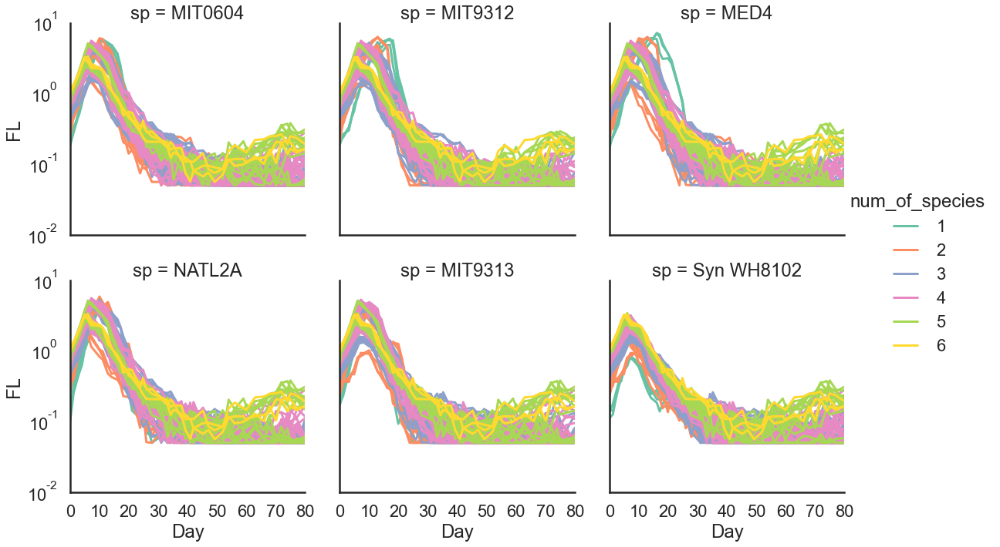

In [37]:
g = sns.relplot(data=exp1_dfm, x='Day', y='FL', kind='line', #ci='sd',
            estimator=None, units='Sample',
            col='sp', col_wrap=3, #aspect=2,
                hue='num_of_species', palette='Set2', legend='full'
               )
g.set(yscale='log')

Text(0.5, 0.98, 'exp1')

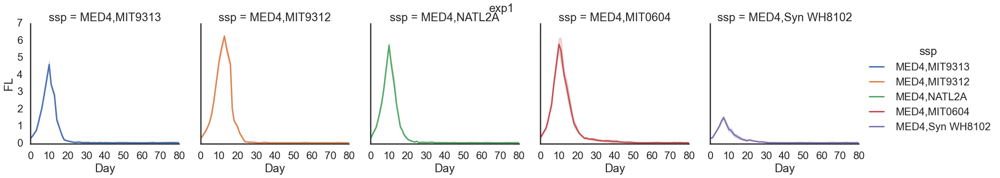

In [198]:
sns.set_context('poster')
sns.relplot(data=exp1_df.loc[exp1_df.MED4 & exp1_df.num_of_species.isin([2])],
            x='Day', y='FL', hue='ssp', col='ssp', kind='line', ci='sd')
plt.suptitle('exp1')

Text(0.5, 0.98, 'exp2')

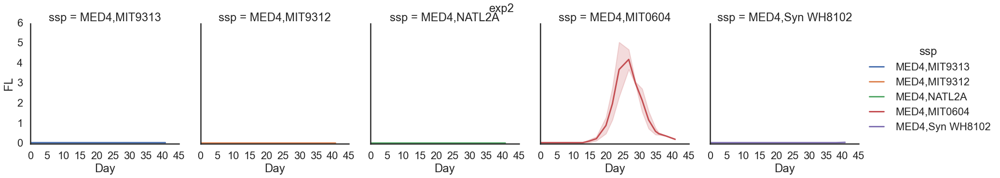

In [199]:
sns.set_context('poster')
sns.relplot(data=exp2_df.loc[exp2_df.MED4 & exp2_df.num_of_species.isin([2])],
            x='Day', y='FL', hue='ssp', col='ssp', kind='line', ci='sd')
plt.suptitle('exp2')

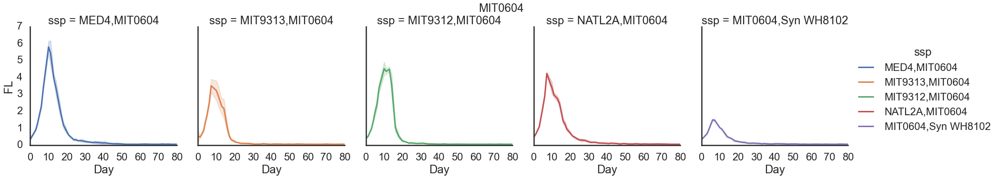

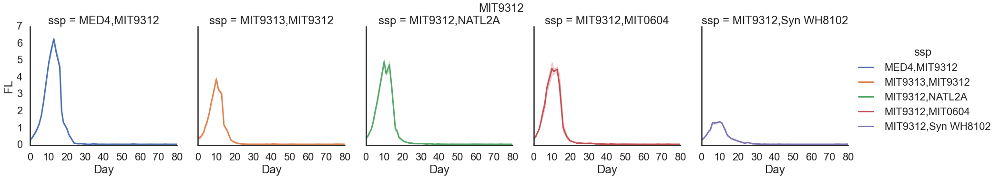

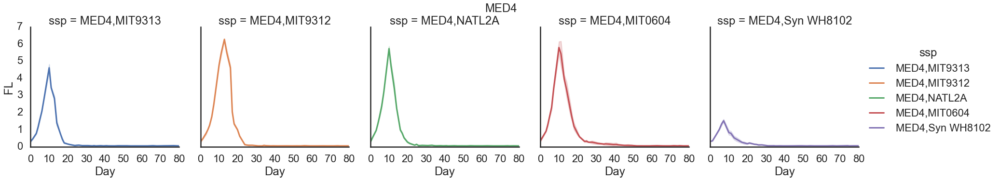

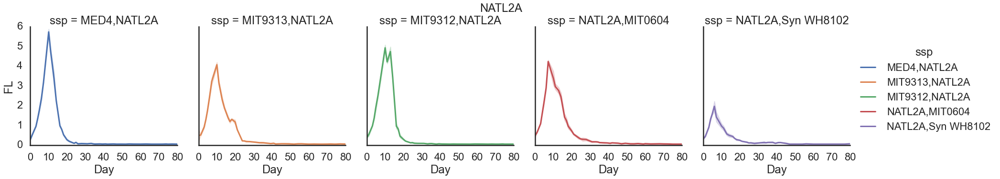

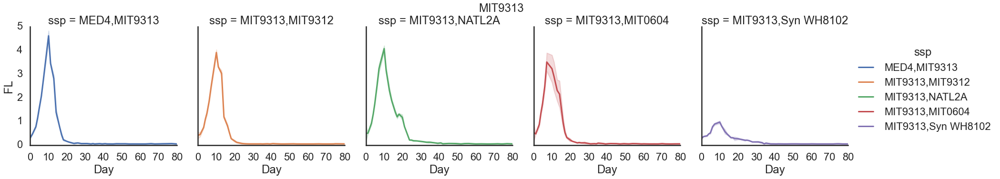

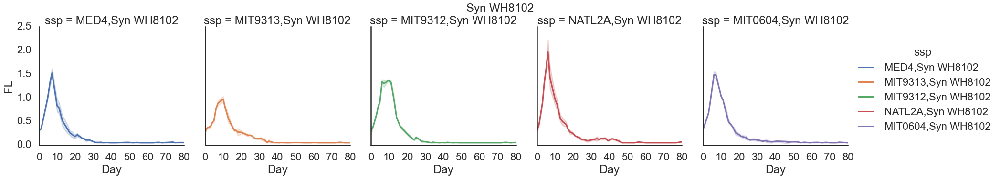

In [205]:
sns.set_context('poster')
for s in species:
    sns.relplot(data=exp1_df.loc[exp1_df[s] & exp1_df.num_of_species.isin([2])],
                x='Day', y='FL', hue='ssp', col='ssp', kind='line', ci='sd')
    plt.suptitle(s, y=1)

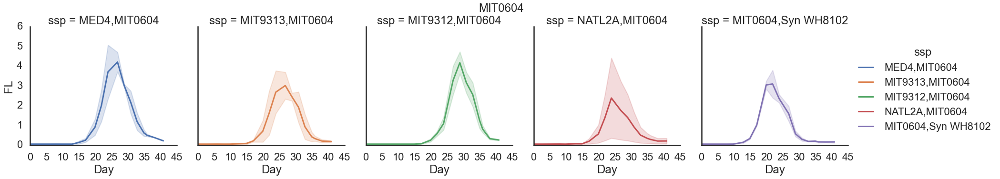

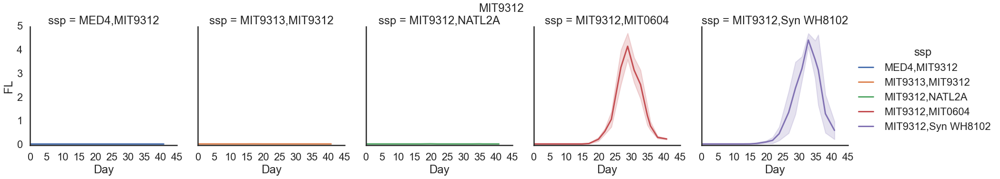

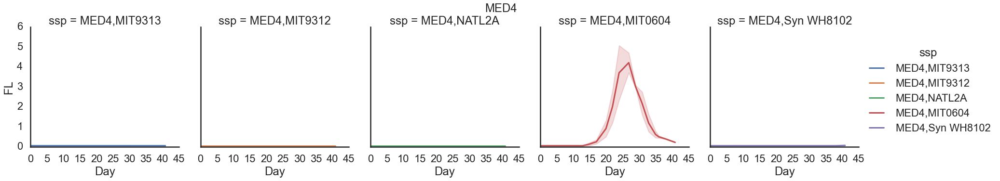

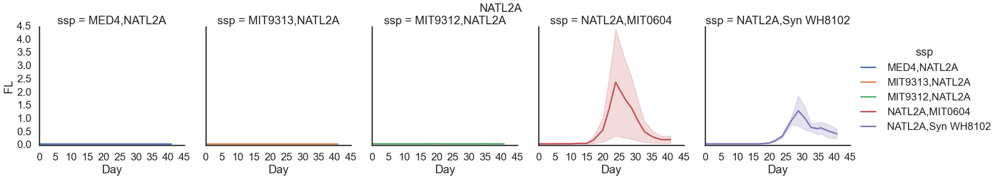

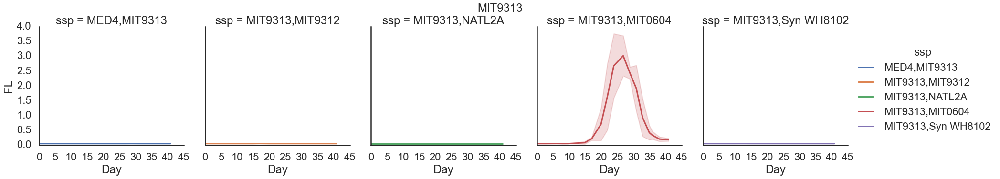

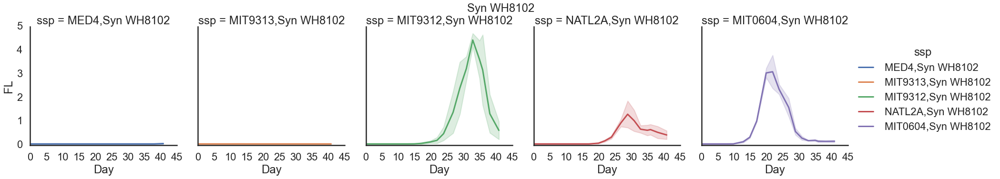

In [204]:
sns.set_context('poster')
for s in species:
    sns.relplot(data=exp2_df.loc[exp2_df[s] & exp2_df.num_of_species.isin([2])],
                x='Day', y='FL', hue='ssp', col='ssp', kind='line', ci='sd')
    plt.suptitle(s, y=1)

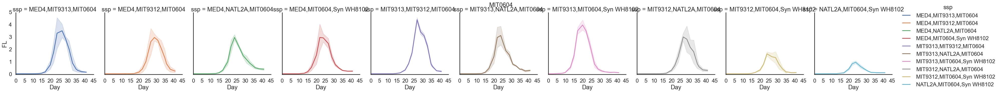

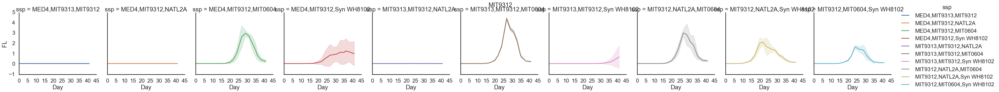

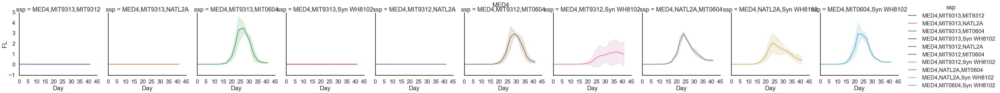

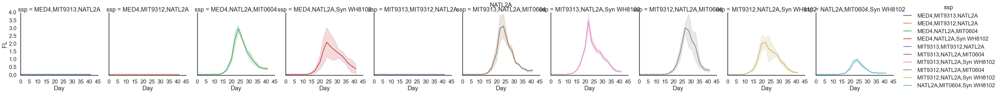

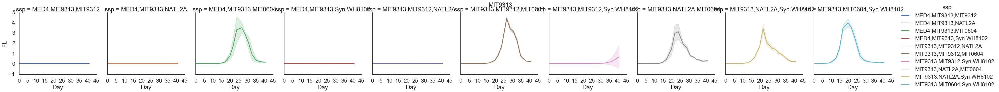

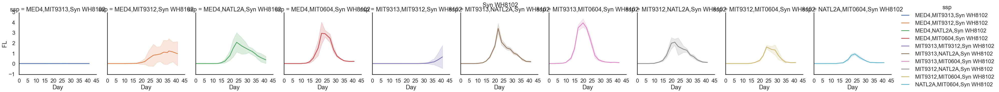

In [201]:
sns.set_context('poster')
for s in species:
    sns.relplot(data=exp2_df.loc[exp2_df[s] & exp2_df.num_of_species.isin([3])],
                x='Day', y='FL', hue='ssp', col='ssp', kind='line', ci='sd')
    plt.suptitle(s)

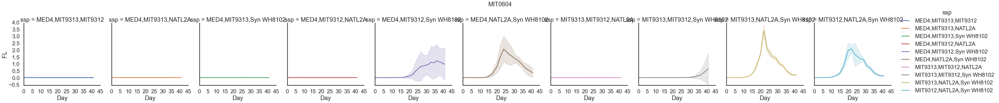

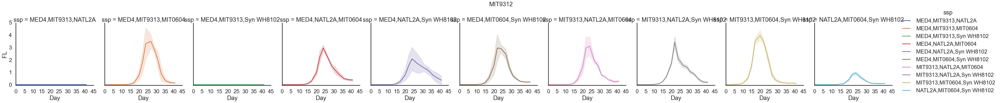

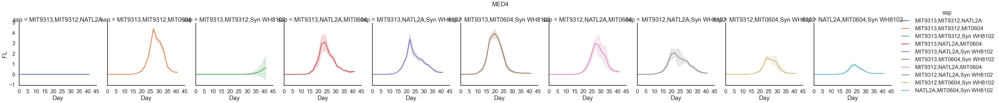

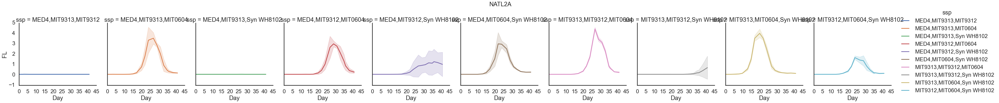

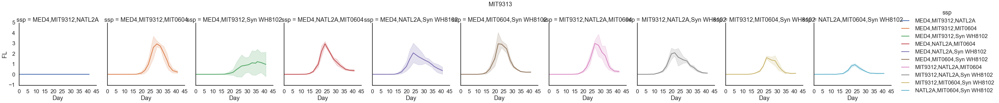

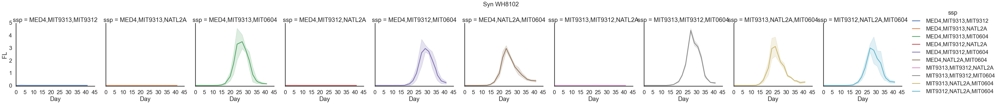

In [203]:
sns.set_context('poster')
for s in species:
    sns.relplot(data=exp2_df.loc[~exp2_df[s] & exp2_df.num_of_species.isin([3])],
                x='Day', y='FL', hue='ssp', col='ssp', kind='line', ci='sd')
    plt.suptitle(s, y=1.1)

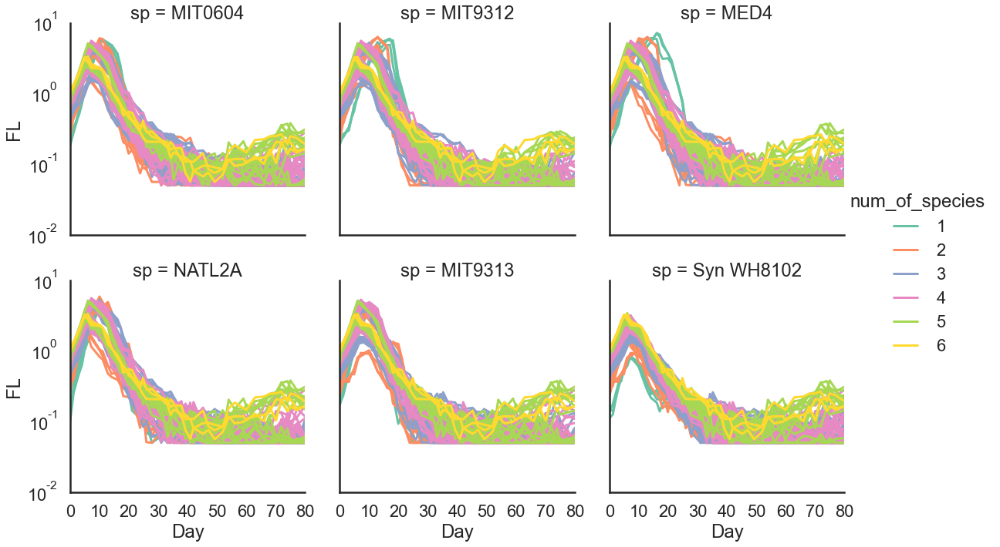

In [37]:
g = sns.relplot(data=exp1_dfm, x='Day', y='FL', kind='line', #ci='sd',
            estimator=None, units='Sample',
            col='sp', col_wrap=3, #aspect=2,
                hue='num_of_species', palette='Set2', legend='full'
               )
g.set(yscale='log')

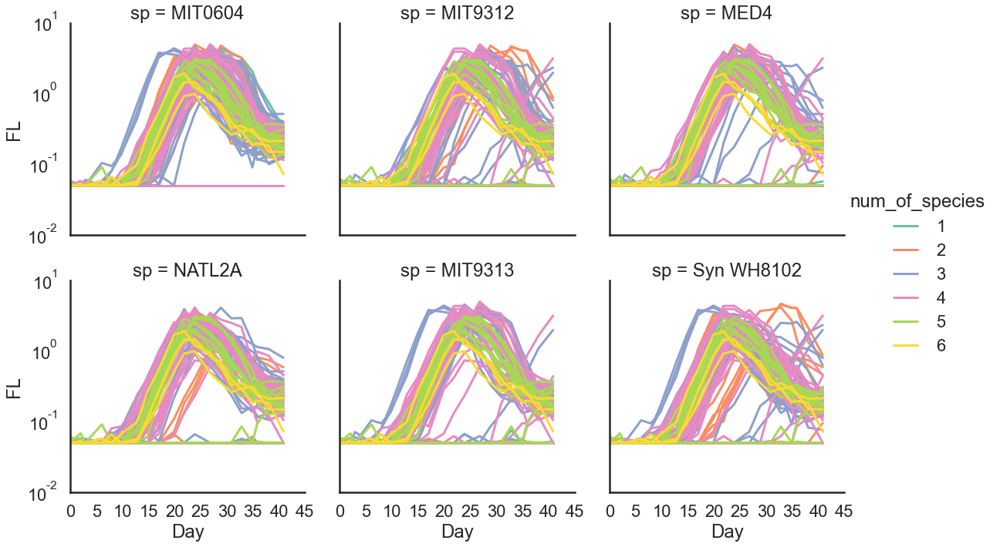

In [38]:
g = sns.relplot(data=exp2_dfm, x='Day', y='FL', kind='line', #ci='sd',
            estimator=None, units='Sample',
            col='sp', col_wrap=3,
                hue='num_of_species', palette='Set2', legend='full'
               )
g.set(yscale='log')

In [39]:
df = pd.concat([exp1_df, exp2_df])

In [40]:
df.columns

Index(['Date', 'Day', 'Sample', 'FL', 'sample_prefix', 'experiment', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102',
       'num_of_species', 'ssp'],
      dtype='object')

# Features Analysis

3)      Box plots: growth rate, decline rate, FL @ 40 and 60 days – by diversity, by strain

In [41]:
day40 = 40.88819444
day60 = 60.025000

In [42]:
day40 = exp1_df.loc[(exp1_df.Day <41) & (exp1_df.Day >40)].Day.max()

In [43]:
def find_growth_rate(df, min_day, max_day):
    fit = cp.apply_fit(
        df.loc[(df.Day <= max_day) & (df.Day >= min_day)], 
        model=cp.model_exponential, x_col='Day', print_popt=False
    )
    return fit.popt_0.min()

In [44]:
def find_decline_rate(df, min_day, max_day):
    fit = cp.apply_fit(
        df.loc[(df.Day <= max_day) & (df.Day >= min_day)], 
        model=cp.model_exponential_decline, x_col='Day', print_popt=False
    )
    return fit.popt_0.min()

In [45]:
exp1_df.columns

Index(['Date', 'Day', 'Sample', 'FL', 'sample_prefix', 'experiment', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102',
       'num_of_species', 'ssp'],
      dtype='object')

In [46]:
from sklearn.metrics import auc
def _analyze_curve(df, day40=day40, day60=day60, day_col='Day', fl_col='FL', nogrow_threshold=0.2):
    fl_max = df[fl_col].max()
    day_max = df.loc[df[fl_col] == fl_max, day_col].min()
    if fl_max < nogrow_threshold:
        day_max = 0
    fl_40 = df.loc[df[day_col] == day40, fl_col].min()
    fl_60 = df.loc[df[day_col] == day60, fl_col].min()
    auc_val = auc(x=df[day_col], y=df[fl_col])
    growth_rate = find_growth_rate(df, 0, day_max)
    decline_rate = find_decline_rate(df, day_max, 10000)

    return pd.Series({
        'max FL': fl_max, 
        'max Day': day_max, 
        'FL @40 days' : fl_40,
        'FL @60 days' : fl_60,
        'auc': auc_val,
        'growth rate': growth_rate,
        'decline rate' : decline_rate,
    })
    
    

In [47]:
exp1_dfg = exp1_df.groupby(['Sample', 'sample_prefix', 'experiment', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102',
       'num_of_species', 'ssp']).apply(_analyze_curve)

In [48]:
exp1_dfg.reset_index(inplace=True)

In [49]:
from sklearn.metrics import auc
def _analyze_curve_exp2(df, day40=day40, day60=day60, day_col='Day', fl_col='FL', nogrow_threshold=0.2):
    fl_max = df[fl_col].max()
    day_max = df.loc[df[fl_col] == fl_max, day_col].min()
    if fl_max < nogrow_threshold:
        day_max = 0

    #fl_40 = df.loc[df[day_col] == day40, fl_col].min()
    #fl_60 = df.loc[df[day_col] == day60, fl_col].min()
    auc_val = auc(x=df[day_col], y=df[fl_col])
    #growth_rate = find_growth_rate(df, 0, day_max)
    #decline_rate = find_decline_rate(df, day_max, 10000)

    return pd.Series({
        'max FL': fl_max, 
        'max Day': day_max, 
        #'FL @40 days' : fl_40,
        #'FL @60 days' : fl_60,
        'auc': auc_val,
        #'growth rate': growth_rate,
        #'decline rate' : decline_rate,
    })
    
    

In [50]:
exp2_dfg = exp2_df.groupby(['Sample', 'sample_prefix', 'experiment', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102',
       'num_of_species', 'ssp']).apply(_analyze_curve_exp2)

In [51]:
exp2_dfg.reset_index(inplace=True)

In [52]:
dfg = pd.concat([exp1_dfg, exp2_dfg], sort=False)

In [53]:
dfg.columns

Index(['Sample', 'sample_prefix', 'experiment', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'max FL',
       'max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate',
       'decline rate'],
      dtype='object')

In [54]:
dfg.reset_index(inplace=True, drop=True)

In [55]:
pp = dfg.pivot_table(columns=['experiment'], values=['max FL',
       'max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate',
       'decline rate'], index=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
pp.columns = [' '.join(col).strip() for col in pp.columns.values]
pp.reset_index(inplace=True)
pp['diff max FL'] = pp['max FL e2'] - pp['max FL e1']
pp.loc[pp['max FL e2'] < 0.2, 'max Day e2'] = 0
pp['diff max Day'] = pp['max Day e2'] - pp['max Day e1']

pp.head()


,Sample,sample_prefix,MED4,MIT9313,MIT9312,NATL2A,MIT0604,Syn WH8102,num_of_species,ssp,...,auc e1,auc e2,decline rate e1,growth rate e1,max Day e1,max Day e2,max FL e1,max FL e2,diff max FL,diff max Day
0,10A,10,True,False,False,False,True,False,2,"MED4,MIT0604",...,61.452594,46.016459,0.044605,-0.239759,9.990972,23.858333,5.914,4.921,-0.993,13.867361
1,10B,10,True,False,False,False,True,False,2,"MED4,MIT0604",...,62.023444,42.987777,0.041571,-0.264069,9.990972,26.784722,6.056,4.063,-1.993,16.793750
2,10C,10,True,False,False,False,True,False,2,"MED4,MIT0604",...,57.634315,40.561068,0.036188,-0.235319,9.990972,26.784722,5.394,4.752,-0.642,16.793750
3,11A,11,True,False,False,False,False,True,2,"MED4,Syn WH8102",...,16.438752,2.108250,0.085656,-0.253885,6.057639,0.000000,1.429,0.095,-1.334,-6.057639
4,11B,11,True,False,False,False,False,True,2,"MED4,Syn WH8102",...,17.918334,2.041979,0.073484,-0.217389,7.172917,0.000000,1.540,0.050,-1.490,-7.172917


In [56]:
pp.columns

Index(['Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312', 'NATL2A',
       'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL @40 days e1',
       'FL @60 days e1', 'auc e1', 'auc e2', 'decline rate e1',
       'growth rate e1', 'max Day e1', 'max Day e2', 'max FL e1', 'max FL e2',
       'diff max FL', 'diff max Day'],
      dtype='object')

In [57]:
pp.sort_values(by='diff max FL').head()

,Sample,sample_prefix,MED4,MIT9313,MIT9312,NATL2A,MIT0604,Syn WH8102,num_of_species,ssp,...,auc e1,auc e2,decline rate e1,growth rate e1,max Day e1,max Day e2,max FL e1,max FL e2,diff max FL,diff max Day
32,1C,1,True,False,False,False,False,False,1,MED4,...,75.923395,2.067133,0.042021,-0.182472,16.106250,0.0,7.180,0.058,-7.122,-16.106250
31,1B,1,True,False,False,False,False,False,1,MED4,...,73.877717,2.045031,0.044367,-0.194763,16.106250,0.0,7.088,0.052,-7.036,-16.106250
185,8C,8,True,False,True,False,False,False,2,"MED4,MIT9312",...,63.194426,2.041979,0.054348,-0.218989,12.854167,0.0,6.317,0.050,-6.267,-12.854167
183,8A,8,True,False,True,False,False,False,2,"MED4,MIT9312",...,63.083685,2.041979,0.055902,-0.212332,12.854167,0.0,6.256,0.050,-6.206,-12.854167
184,8B,8,True,False,True,False,False,False,2,"MED4,MIT9312",...,64.250757,2.041979,0.054464,-0.218880,12.854167,0.0,6.222,0.050,-6.172,-12.854167


In [58]:
df.columns

Index(['Date', 'Day', 'Sample', 'FL', 'sample_prefix', 'experiment', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102',
       'num_of_species', 'ssp'],
      dtype='object')

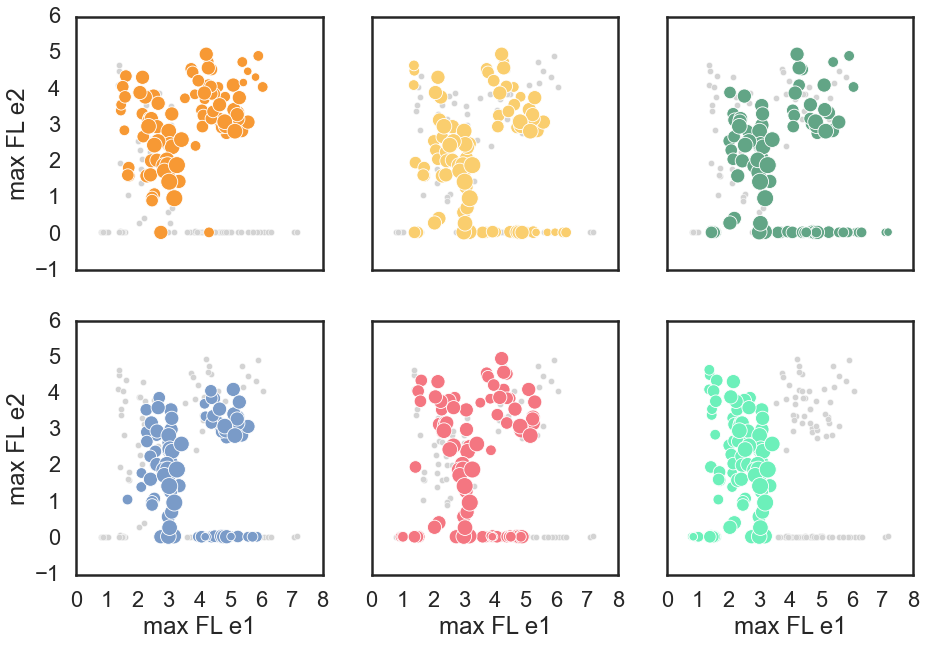

In [59]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(15,10))
    
for idx,i in enumerate(species):
    sns.scatterplot(data=pp, x='max FL e1', y='max FL e2', s=40, #size='num_of_species', 
                     color=other_color, 
                    ax=axs[idx//3, idx%3])
    sns.scatterplot(data=pp.loc[pp[i]], s=50, 
                x='max FL e1', y='max FL e2', size='num_of_species',  
                    #label=i,
                    color=color_dict[i]
                   , ax=axs[idx//3, idx%3],
                   legend=False
                   )

#plt.legend(loc='best')
#leg = g.get_legend()

In [60]:
species

['MIT0604', 'MIT9312', 'MED4', 'NATL2A', 'MIT9313', 'Syn WH8102']

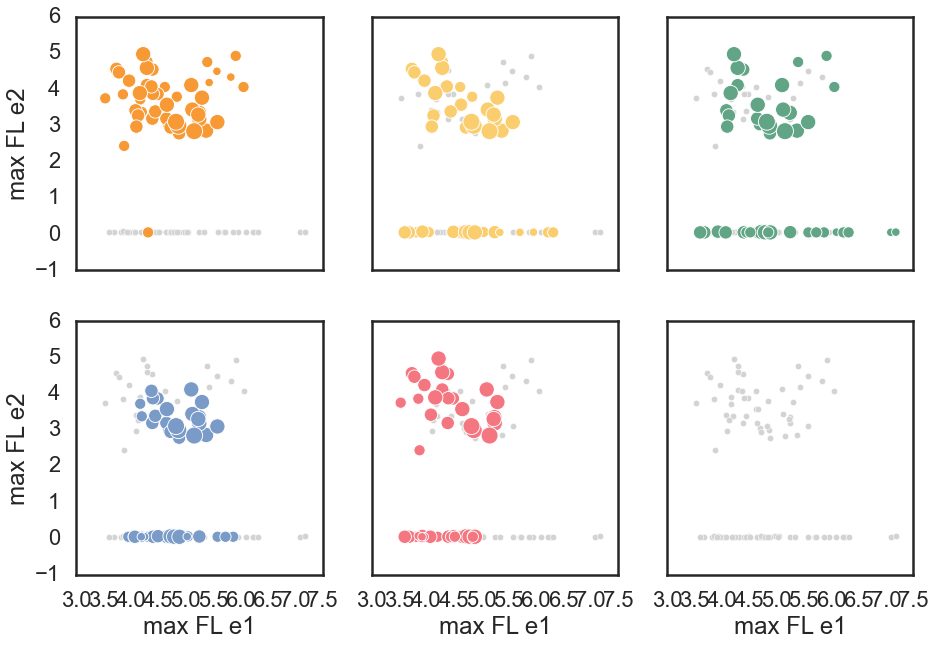

In [61]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(15,10))
    
for idx,i in enumerate(species):
    sns.scatterplot(data=pp.loc[~pp['Syn WH8102']], 
                    x='max FL e1', y='max FL e2', s=40, #size='num_of_species', 
                     color=other_color, 
                    ax=axs[idx//3, idx%3])
    sns.scatterplot(data=pp.loc[(~pp['Syn WH8102']) & pp[i]], s=50, 
                x='max FL e1', y='max FL e2', size='num_of_species',  
                    #label=i,
                    color=color_dict[i]
                   , ax=axs[idx//3, idx%3],
                   legend=False
                   )

#plt.legend(loc='best')
#leg = g.get_legend()

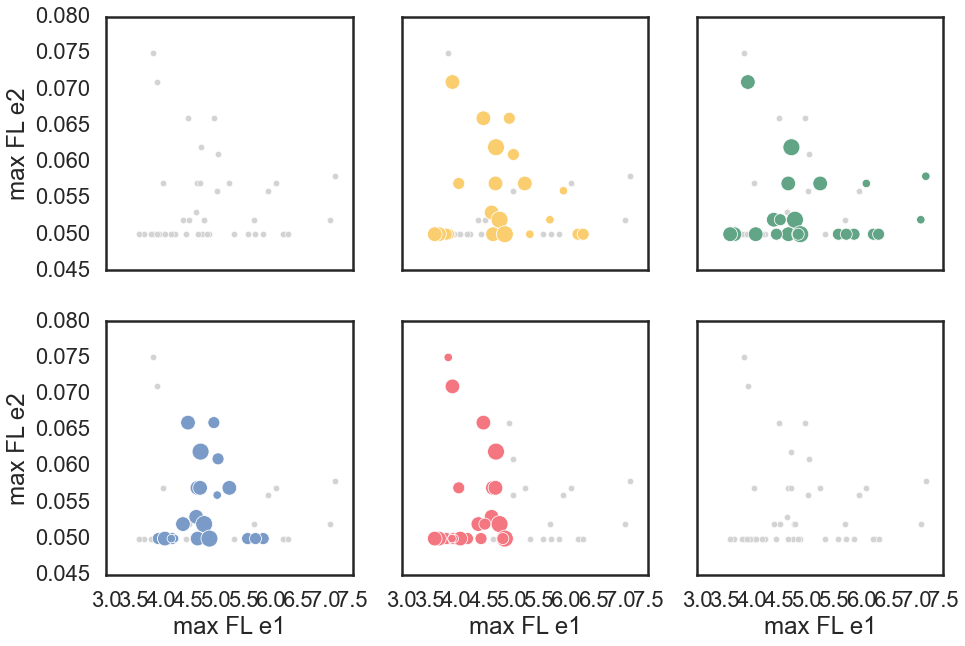

In [62]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(15,10))
    
for idx,i in enumerate(species):
    sns.scatterplot(data=pp.loc[(~pp['Syn WH8102']) & (~pp['MIT0604'])], 
                    x='max FL e1', y='max FL e2', s=40, #size='num_of_species', 
                     color=other_color, 
                    ax=axs[idx//3, idx%3])
    sns.scatterplot(data=pp.loc[(~pp['Syn WH8102']) & (~pp['MIT0604']) & pp[i]], s=50, 
                x='max FL e1', y='max FL e2', size='num_of_species',  
                    #label=i,
                    color=color_dict[i]
                   , ax=axs[idx//3, idx%3],
                   legend=False
                   )

#plt.legend(loc='best')
#leg = g.get_legend()

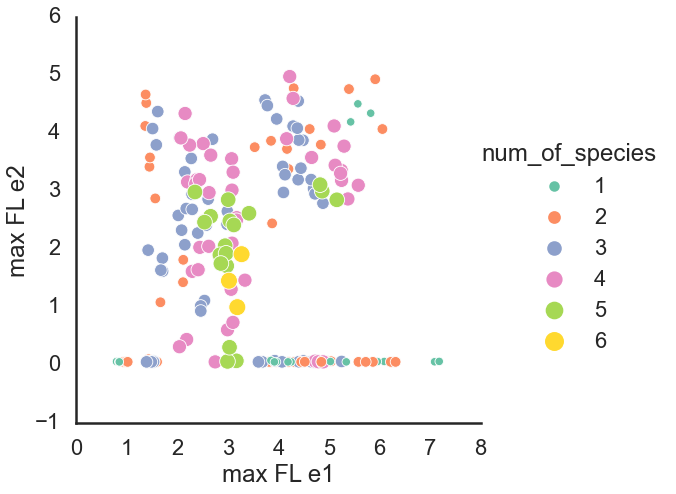

In [63]:
sns.relplot(data=pp, x='max FL e1', y='max FL e2', #s=40, 
            size='num_of_species', legend='full',
                     hue='num_of_species', palette='Set2',
           height=7)
    
#plt.legend(loc='best')
#leg = g.get_legend()

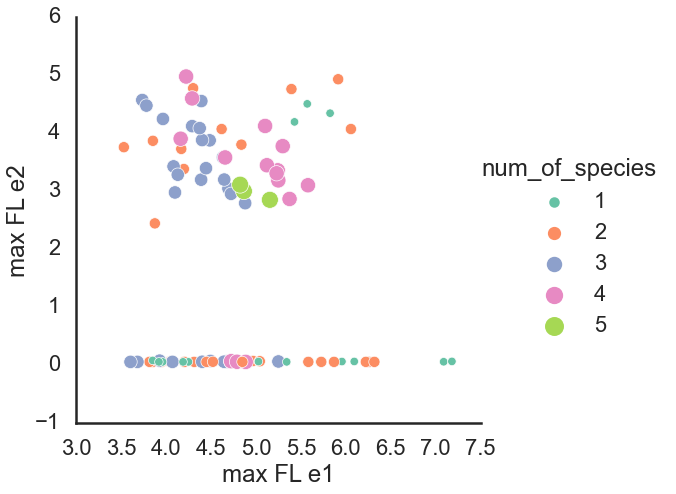

In [64]:
sns.relplot(data=pp.loc[~pp['Syn WH8102']], x='max FL e1', y='max FL e2', #s=40, 
            size='num_of_species', legend='full',
                     hue='num_of_species', palette='Set2',
           height=7)
    
#plt.legend(loc='best')
#leg = g.get_legend()

In [65]:
pp.loc[(pp['max FL e2']<3.5) & (pp['max FL e1']<3.5)]['Syn WH8102'].value_counts()

True    80
Name: Syn WH8102, dtype: int64

In [66]:
pp.loc[pp['max FL e2']> 0.2].groupby( ['MIT0604', 'Syn WH8102'])[['max FL e1', 'max FL e2',]].agg(['min', 'max'])# .reset_index()

max FL e1        max FL e2       
                         min    max       min    max
MIT0604 Syn WH8102                                  
False   True           1.364  3.174     0.302  4.658
True    False          3.529  6.056     2.437  4.968
        True           1.447  3.416     0.927  4.364

<AxesSubplot:xlabel='None-None', ylabel='MIT0604-Syn WH8102'>

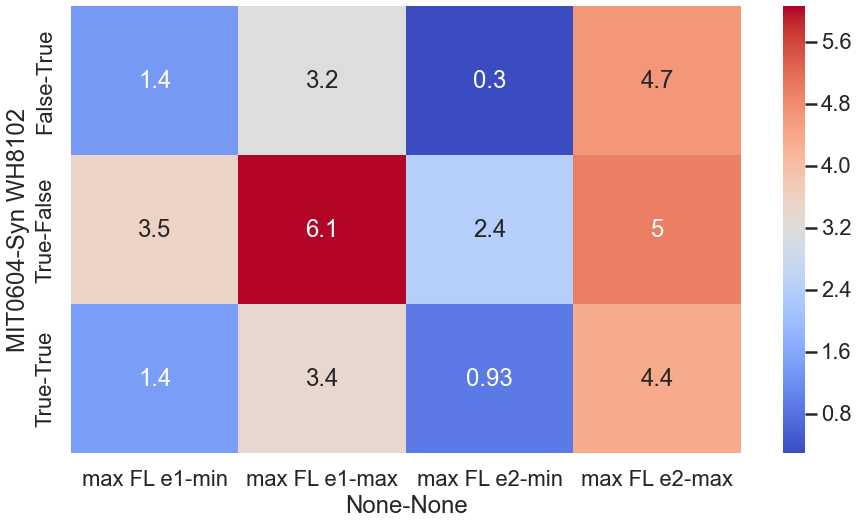

In [67]:
sns.heatmap(pp.loc[pp['max FL e2']> 0.2].groupby( ['MIT0604', 'Syn WH8102'])[['max FL e1', 'max FL e2',]].agg(['min', 'max']),
           annot=True, cmap='coolwarm')# .reset_index()

In [68]:
pp.loc[(~pp['MIT0604']) & (~pp['Syn WH8102']), '604/syn'] = 'None'
pp.loc[(pp['MIT0604']) & (~pp['Syn WH8102']), '604/syn'] = '604'
pp.loc[(~pp['MIT0604']) & (pp['Syn WH8102']) & (pp['NATL2A']), '604/syn'] = 'Syn&Natl'
pp.loc[(~pp['MIT0604']) & (pp['Syn WH8102']) & (~pp['NATL2A']), '604/syn'] = 'Syn&~Natl'
pp.loc[(pp['MIT0604']) & (pp['Syn WH8102']), '604/syn'] = '604&Syn'

C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 57.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 57.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 57.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 57.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 57.8% of the points

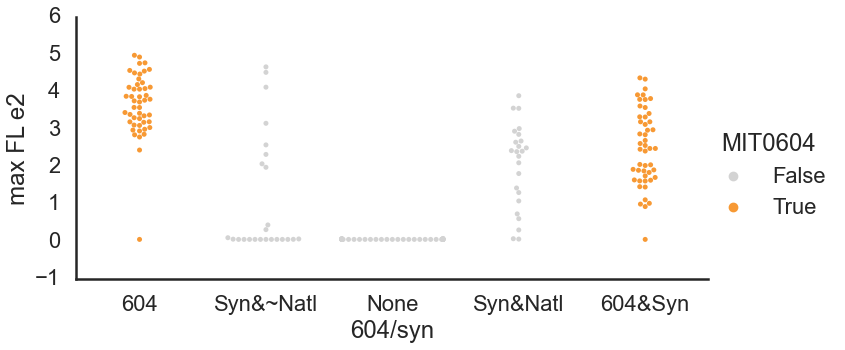

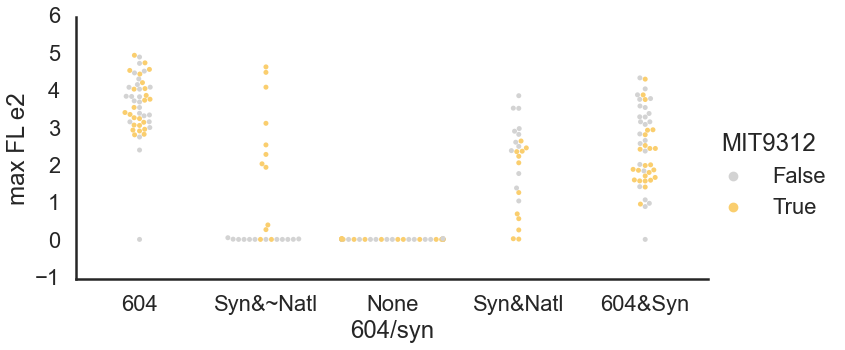

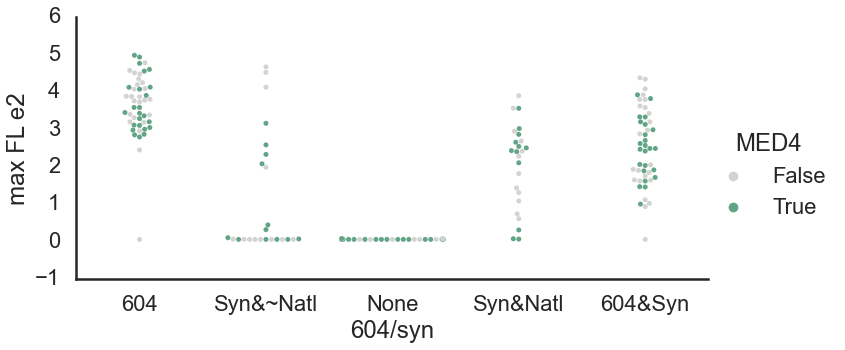

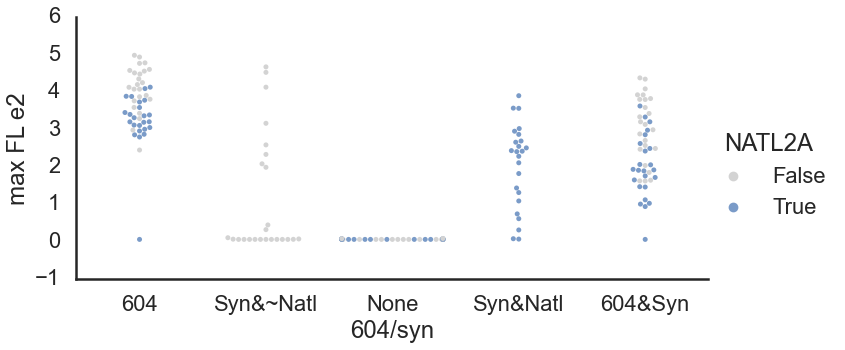

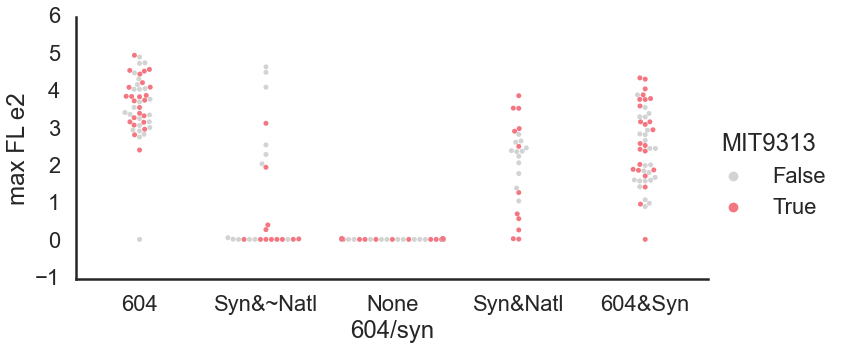

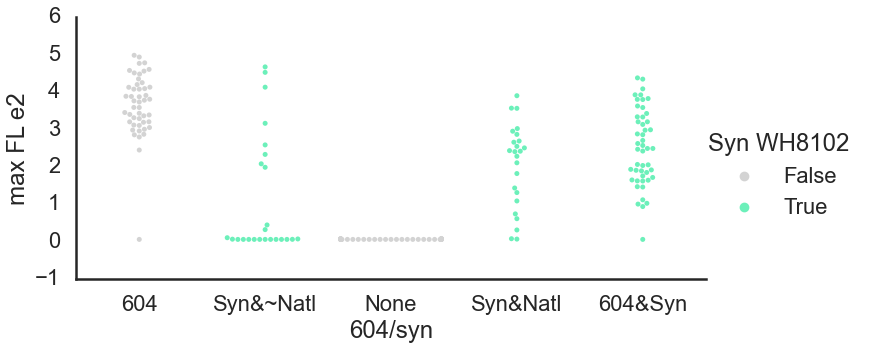

In [69]:
for i in species:
    sns.catplot(data=pp, x='604/syn', y='max FL e2', kind='swarm', 
                aspect=2, hue=i, palette=[other_color, color_dict[i]],)
               #legend=False)
#sns.catplot(data=pp, x='604/syn', y='max FL e1', kind='swarm', aspect=1.5)

C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 57.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


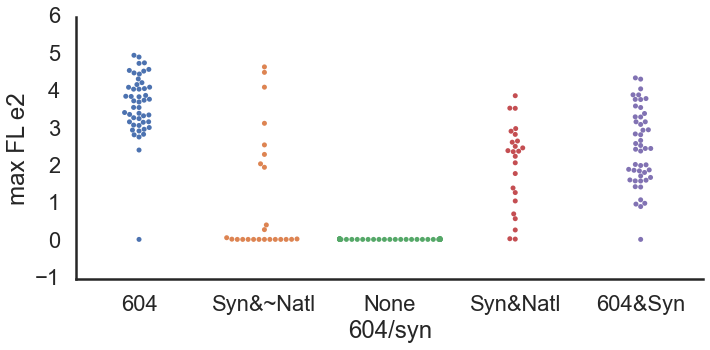

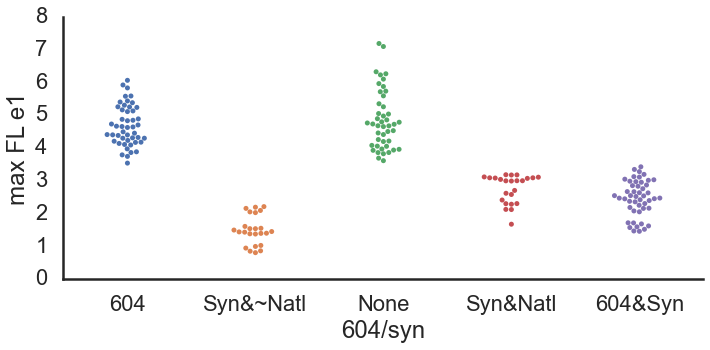

In [70]:
sns.catplot(data=pp, x='604/syn', y='max FL e2', kind='swarm', aspect=2)#, hue='NATL2A')
sns.catplot(data=pp, x='604/syn', y='max FL e1', kind='swarm', aspect=2)

In [71]:
pp['growing'] = pp['max FL e2'] > 0.2

In [72]:
species_hm = pd.Series(['MIT0604', 'Syn WH8102', 'NATL2A','MIT9312', 'MED4',  'MIT9313', ])
df_lst = [pp.groupby([i])['growing'].mean() for i in species_hm]

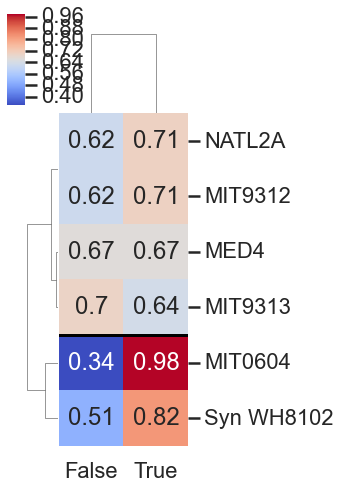

In [73]:
g = sns.clustermap(pd.concat(df_lst, keys=species_hm, axis=1).T,
            cmap='coolwarm', annot=True, method='ward', figsize=(5,7)
           )
g.ax_heatmap.axhline(4, c='black')


In [74]:
df_lst = [pp.groupby([i, 'num_of_species'])['growing'].mean() for i in species_hm]

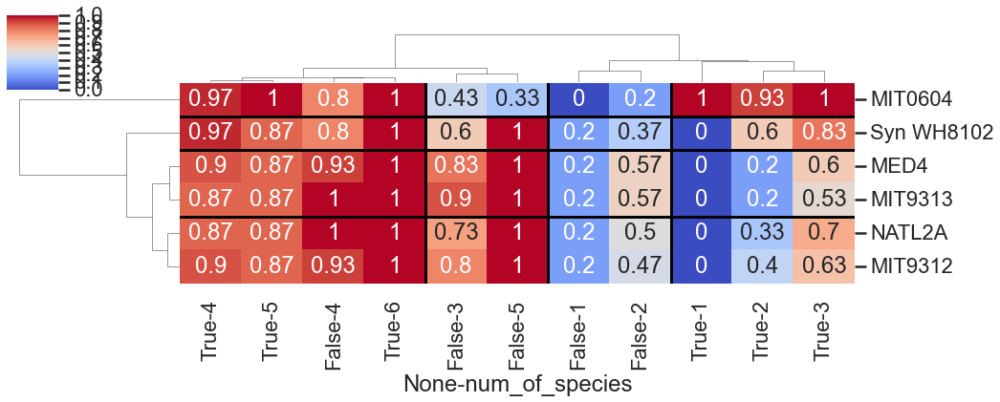

In [75]:
g = sns.clustermap(pd.concat(df_lst, keys= species_hm, axis=1).T,
            cmap='coolwarm', annot=True, method='ward', figsize=(15,6))
g.ax_heatmap.axhline(1, c='black')
g.ax_heatmap.axhline(2, c='black')
g.ax_heatmap.axhline(4, c='black')
g.ax_heatmap.axvline(4, c='black')
g.ax_heatmap.axvline(6, c='black')
g.ax_heatmap.axvline(8, c='black')


In [76]:
from itertools import combinations

In [77]:
keys = list(combinations(species_hm, 2))
df_lst = [pp.groupby(list(i))['growing'].mean() for i in keys]

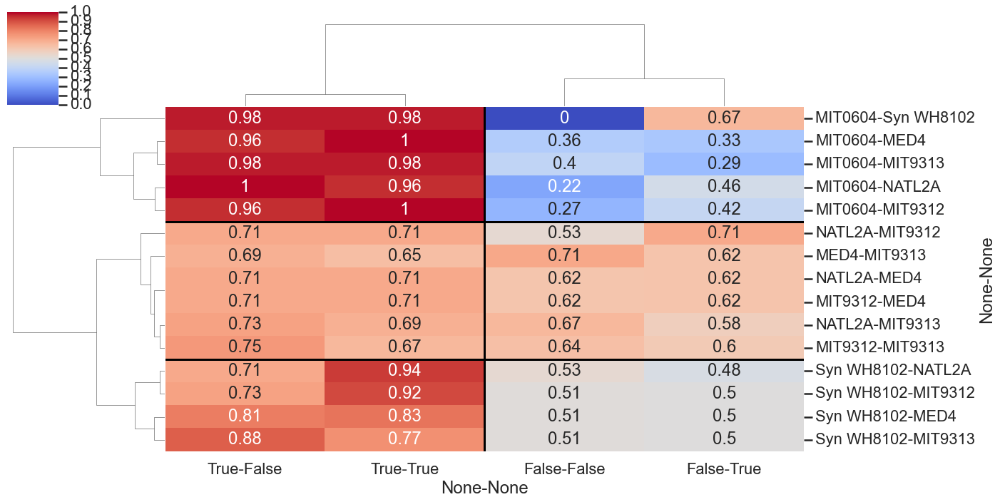

In [78]:


g = sns.clustermap(pd.concat(df_lst, keys=keys, axis=1, levels=['first', 'second']).T,
            cmap='coolwarm', annot=True, method='ward', figsize=(20,10),
            #ax=axs
           )
g.ax_heatmap.axvline(2, c='black')
g.ax_heatmap.axhline(5, c='black')
g.ax_heatmap.axhline(11, c='black')


In [79]:
keys = pd.Series(combinations(species_hm, 3))
df_lst = [pp.groupby(list(i))['growing'].mean() for i in keys]

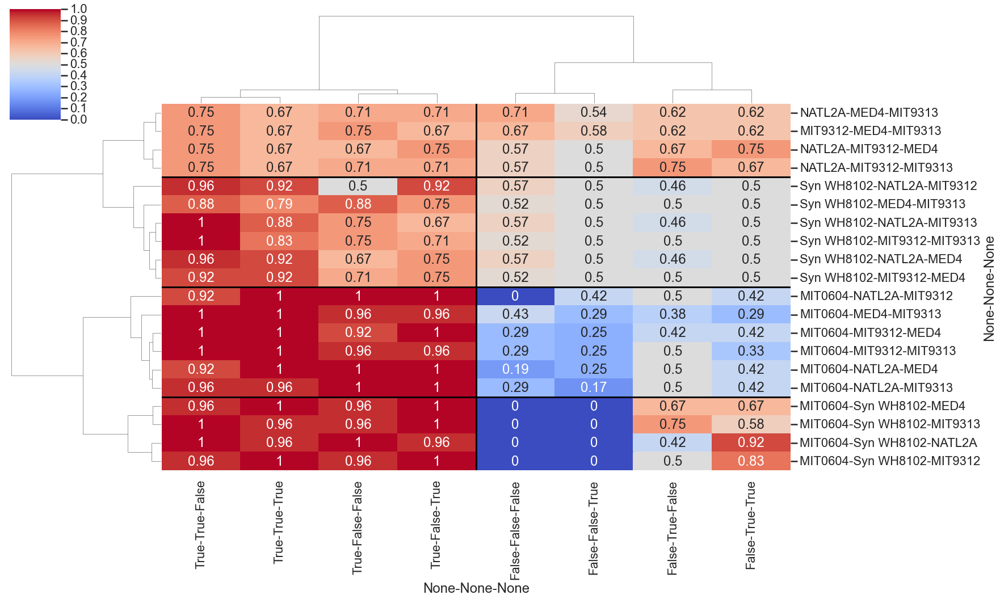

In [80]:
g = sns.clustermap(pd.concat(df_lst, keys=keys, axis=1).T,
            cmap='coolwarm', annot=True,method='ward',
            figsize=(25,15),
           )
g.ax_heatmap.axhline(4, c='black')
g.ax_heatmap.axhline(10, c='black')
g.ax_heatmap.axhline(16, c='black')
g.ax_heatmap.axvline(4, c='black')


In [81]:
with pd.option_context("display.max_rows", 200):
    display(pp.loc[pp['max FL e2']> 0.2].ssp.unique())

array(['MED4,MIT0604', 'MIT9313,MIT0604', 'MIT9312,MIT0604',
       'MIT9312,Syn WH8102', 'NATL2A,MIT0604', 'NATL2A,Syn WH8102',
       'MIT0604,Syn WH8102', 'MED4,MIT9313,MIT0604',
       'MED4,MIT9312,MIT0604', 'MED4,MIT9312,Syn WH8102',
       'MED4,NATL2A,MIT0604', 'MED4,NATL2A,Syn WH8102',
       'MED4,MIT0604,Syn WH8102', 'MIT9313,MIT9312,MIT0604',
       'MIT9313,MIT9312,Syn WH8102', 'MIT9313,NATL2A,MIT0604',
       'MIT9313,NATL2A,Syn WH8102', 'MIT9313,MIT0604,Syn WH8102',
       'MIT9312,NATL2A,MIT0604', 'MIT9312,NATL2A,Syn WH8102',
       'MIT9312,MIT0604,Syn WH8102', 'NATL2A,MIT0604,Syn WH8102',
       'MED4,MIT9313,MIT9312,MIT0604', 'MED4,MIT9313,MIT9312,Syn WH8102',
       'MED4,MIT9313,NATL2A,MIT0604', 'MED4,MIT9313,NATL2A,Syn WH8102',
       'MED4,MIT9313,MIT0604,Syn WH8102', 'MED4,MIT9312,NATL2A,MIT0604',
       'MED4,MIT9312,NATL2A,Syn WH8102',
       'MED4,MIT9312,MIT0604,Syn WH8102',
       'MED4,NATL2A,MIT0604,Syn WH8102', 'MIT9313,MIT9312,NATL2A,MIT0604',
       'M

In [82]:
pp.loc[(~pp['MIT0604']) & (~pp['Syn WH8102'])]['max FL e2'].describe()

count    45.000000
mean      0.053800
std       0.006044
min       0.050000
25%       0.050000
50%       0.050000
75%       0.057000
max       0.075000
Name: max FL e2, dtype: float64

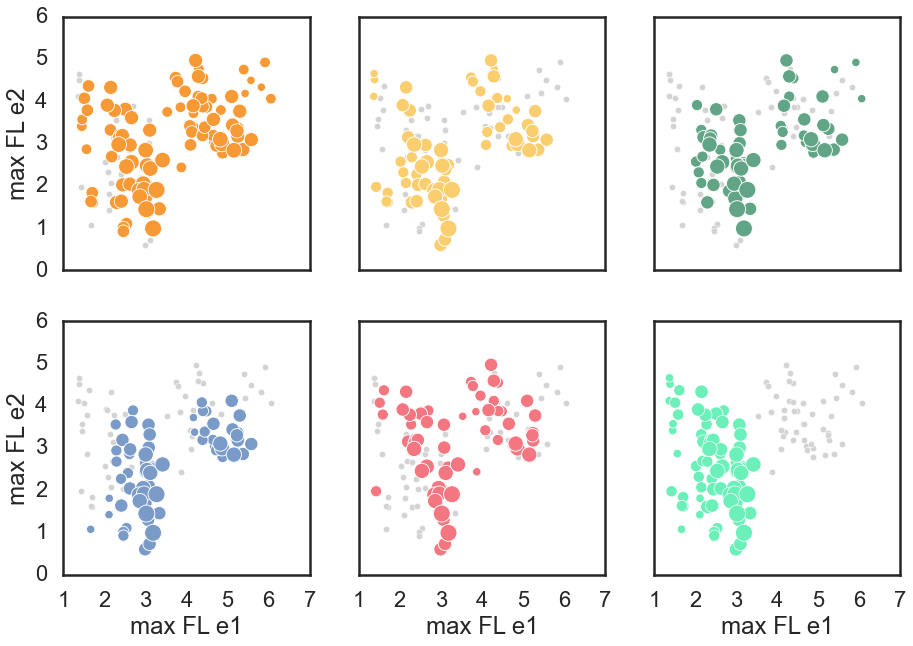

In [83]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(15,10))
    
for idx,i in enumerate(species):
    sns.scatterplot(data=pp.loc[pp['max FL e2']> 0.5], x='max FL e1', y='max FL e2', s=40, #size='num_of_species', 
                     color=other_color, 
                    ax=axs[idx//3, idx%3])
    sns.scatterplot(data=pp.loc[pp[i] & (pp['max FL e2']> 0.5)], s=50, 
                x='max FL e1', y='max FL e2', size='num_of_species',  
                    #label=i,
                    color=color_dict[i]
                   , ax=axs[idx//3, idx%3],
                   legend=False
                   )

#plt.legend(loc='best')
#leg = g.get_legend()

In [84]:
pp.columns

Index(['Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312', 'NATL2A',
       'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL @40 days e1',
       'FL @60 days e1', 'auc e1', 'auc e2', 'decline rate e1',
       'growth rate e1', 'max Day e1', 'max Day e2', 'max FL e1', 'max FL e2',
       'diff max FL', 'diff max Day', '604/syn', 'growing'],
      dtype='object')

C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


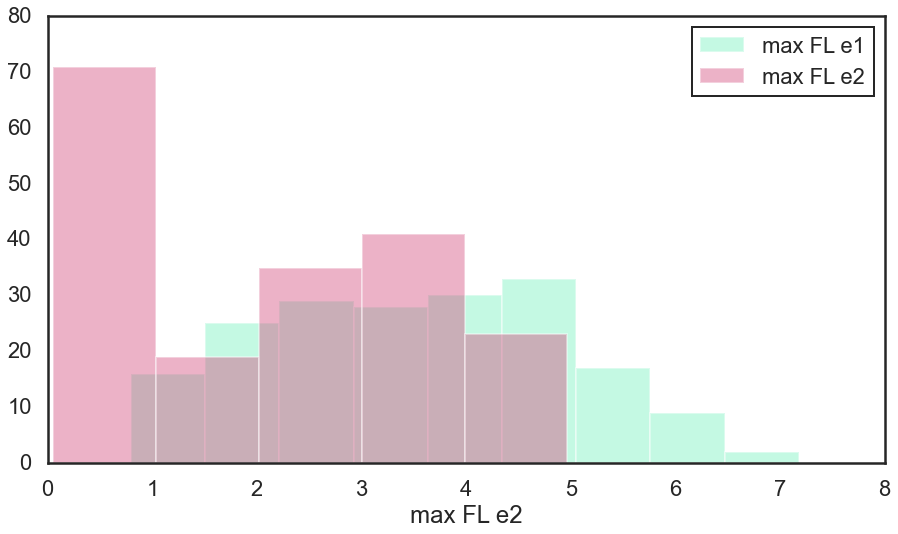

In [85]:
sns.distplot(pp['max FL e1'], label='max FL e1', kde=False, color=epallete[0])
sns.distplot(pp['max FL e2'], label='max FL e2', kde=False, color=epallete[1])
plt.legend()

In [86]:
pp.columns

Index(['Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312', 'NATL2A',
       'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL @40 days e1',
       'FL @60 days e1', 'auc e1', 'auc e2', 'decline rate e1',
       'growth rate e1', 'max Day e1', 'max Day e2', 'max FL e1', 'max FL e2',
       'diff max FL', 'diff max Day', '604/syn', 'growing'],
      dtype='object')

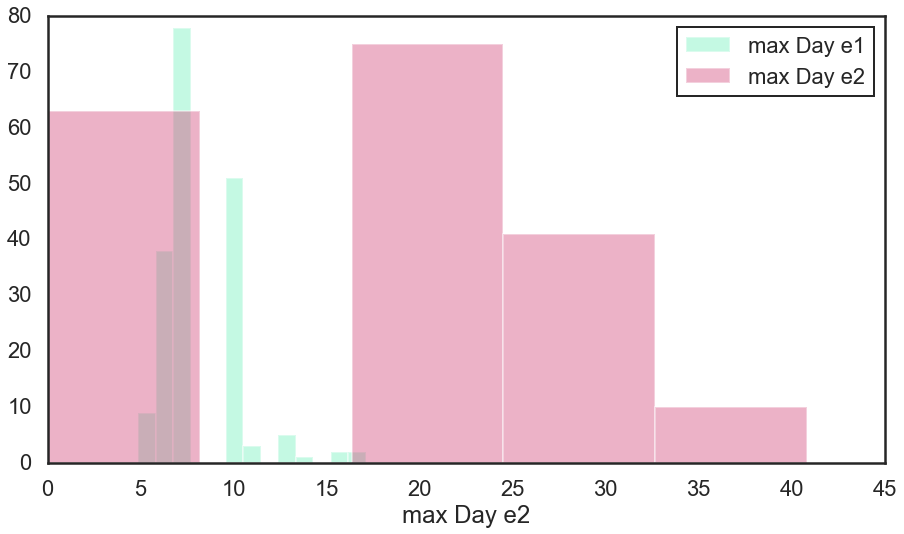

In [87]:
sns.distplot(pp['max Day e1'], label='max Day e1', kde=False, color=epallete[0])
sns.distplot(pp['max Day e2'], label='max Day e2', kde=False, color=epallete[1])
plt.legend()

C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


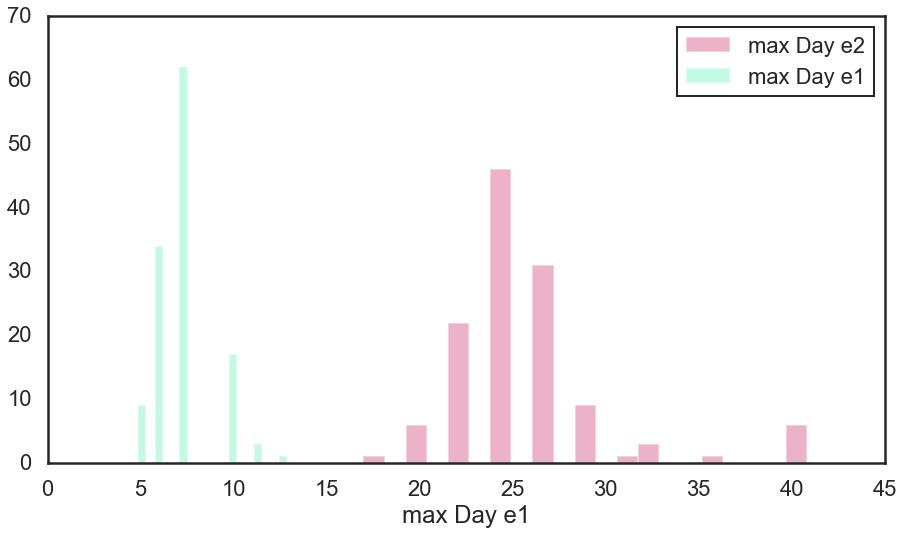

In [88]:
sns.distplot(pp.loc[pp['max Day e2']>0, 'max Day e2'], label='max Day e2', kde=False, color=epallete[1])
sns.distplot(pp.loc[pp['max Day e2']>0, 'max Day e1'], label='max Day e1', kde=False, color=epallete[0])
plt.legend()

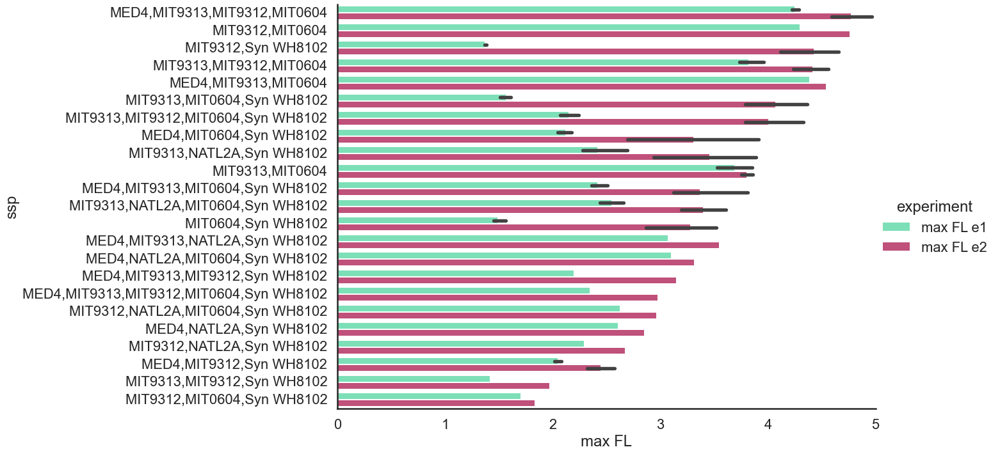

In [89]:
nl_df = pp.loc[pp['diff max FL']>0]
nl_df.head()
nl_df = nl_df.sort_values(by='max FL e2', axis=0, ascending=False)[['ssp', 'max FL e1', 'max FL e2']]
nl_df =pd.melt(nl_df, id_vars='ssp', value_vars=['max FL e1','max FL e2'], var_name='experiment', value_name='max FL')
sns.catplot(data=nl_df, y='ssp', hue='experiment', x='max FL', kind='bar',palette=epallete, aspect=2, height=10)


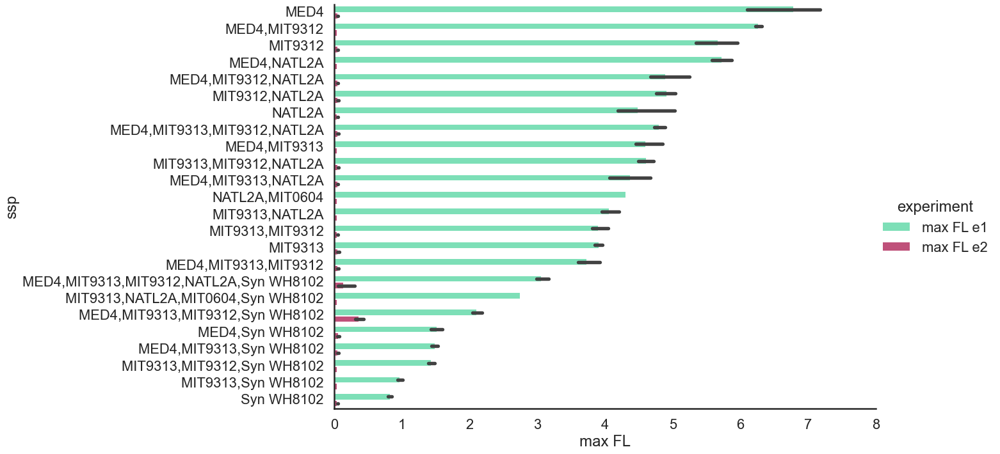

In [90]:
nl_df = pp.loc[pp['max FL e2']<0.5]
nl_df.head()
nl_df = nl_df.sort_values(by='max FL e1', axis=0, ascending=False)[['ssp', 'max FL e1', 'max FL e2']]
nl_df =pd.melt(nl_df, id_vars='ssp', value_vars=['max FL e1','max FL e2'], var_name='experiment', value_name='max FL')
sns.catplot(data=nl_df, y='ssp', hue='experiment', x='max FL', kind='bar',palette=epallete, aspect=2, height=10)


In [91]:
pp.columns

Index(['Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312', 'NATL2A',
       'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL @40 days e1',
       'FL @60 days e1', 'auc e1', 'auc e2', 'decline rate e1',
       'growth rate e1', 'max Day e1', 'max Day e2', 'max FL e1', 'max FL e2',
       'diff max FL', 'diff max Day', '604/syn', 'growing'],
      dtype='object')

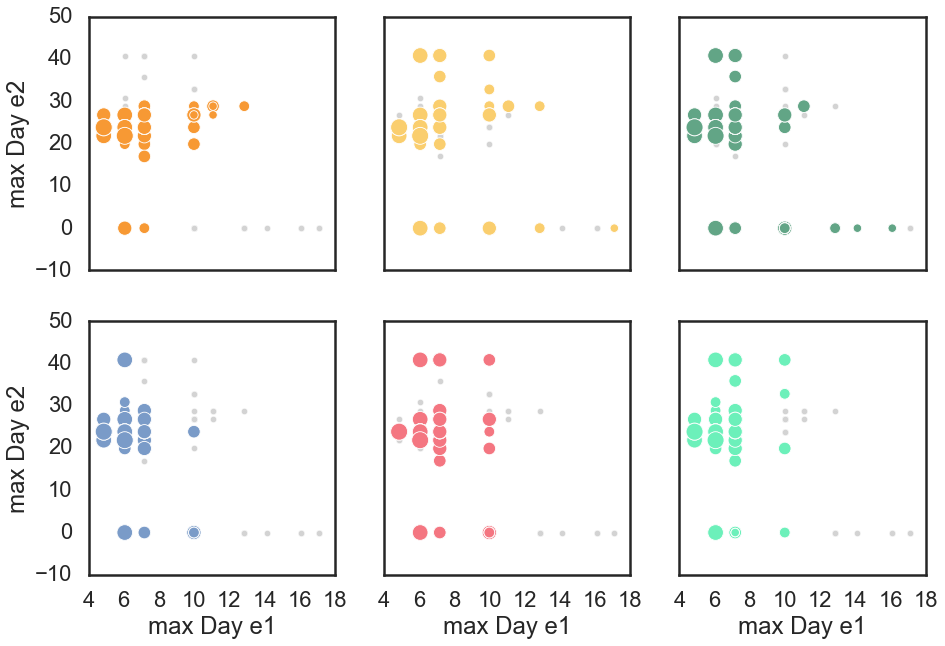

In [92]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(15,10))
    
for idx,i in enumerate(species):
    sns.scatterplot(data=pp, x='max Day e1', y='max Day e2', s=40, #size='num_of_species', 
                     color=other_color, 
                    ax=axs[idx//3, idx%3])
    sns.scatterplot(data=pp.loc[pp[i]], s=50, 
                x='max Day e1', y='max Day e2', size='num_of_species',  
                    #label=i,
                    color=color_dict[i]
                   , ax=axs[idx//3, idx%3],
                   legend=False
                   )

#plt.legend(loc='best')
#leg = g.get_legend()

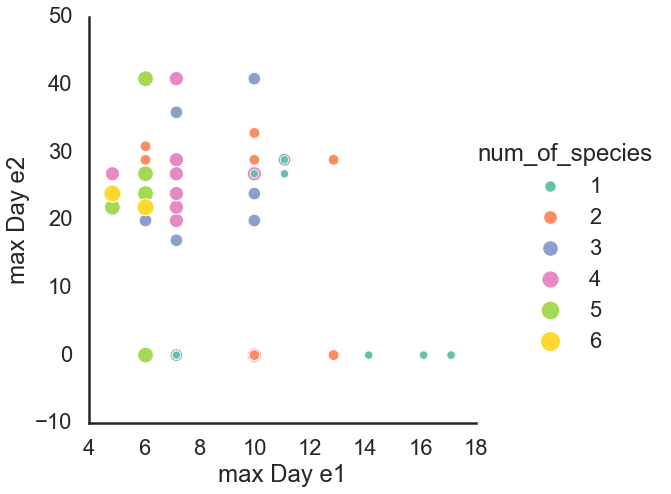

In [93]:
sns.relplot(data=pp, x='max Day e1', y='max Day e2', #s=40, 
            size='num_of_species', legend='full',
                     hue='num_of_species', palette='Set2',
           height=7)
    
#plt.legend(loc='best')
#leg = g.get_legend()

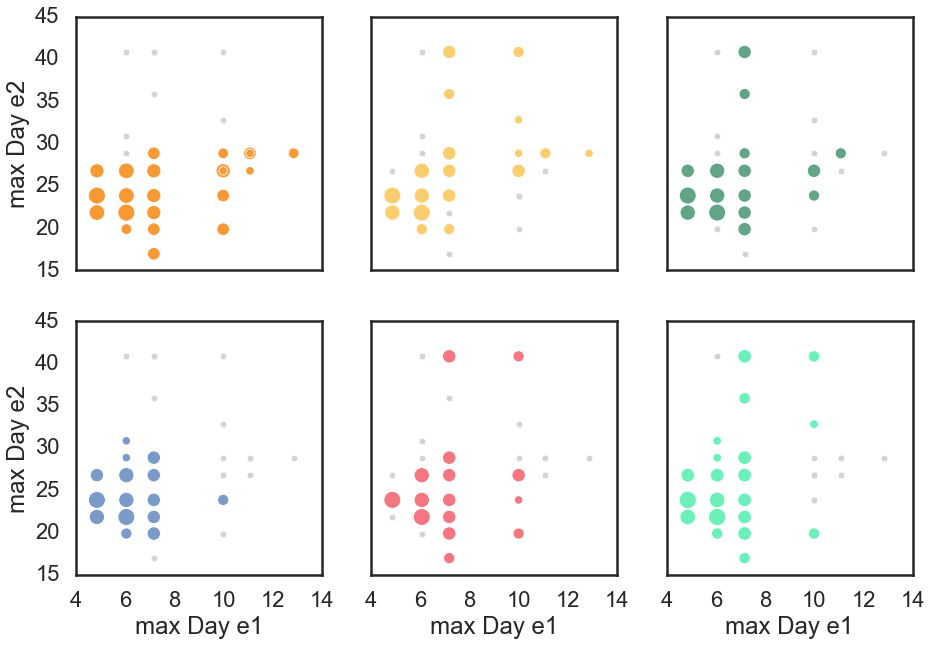

In [94]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(15,10))
    
for idx,i in enumerate(species):
    sns.scatterplot(data=pp.loc[pp['max Day e2']> 0], x='max Day e1', y='max Day e2', s=40, #size='num_of_species', 
                     color=other_color, 
                    ax=axs[idx//3, idx%3])
    sns.scatterplot(data=pp.loc[pp[i] & (pp['max FL e2']> 0.5)], s=50, 
                x='max Day e1', y='max Day e2', size='num_of_species',  
                    #label=i,
                    color=color_dict[i]
                   , ax=axs[idx//3, idx%3],
                   legend=False
                   )

#plt.legend(loc='best')
#leg = g.get_legend()

In [95]:
pp.columns

Index(['Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312', 'NATL2A',
       'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL @40 days e1',
       'FL @60 days e1', 'auc e1', 'auc e2', 'decline rate e1',
       'growth rate e1', 'max Day e1', 'max Day e2', 'max FL e1', 'max FL e2',
       'diff max FL', 'diff max Day', '604/syn', 'growing'],
      dtype='object')

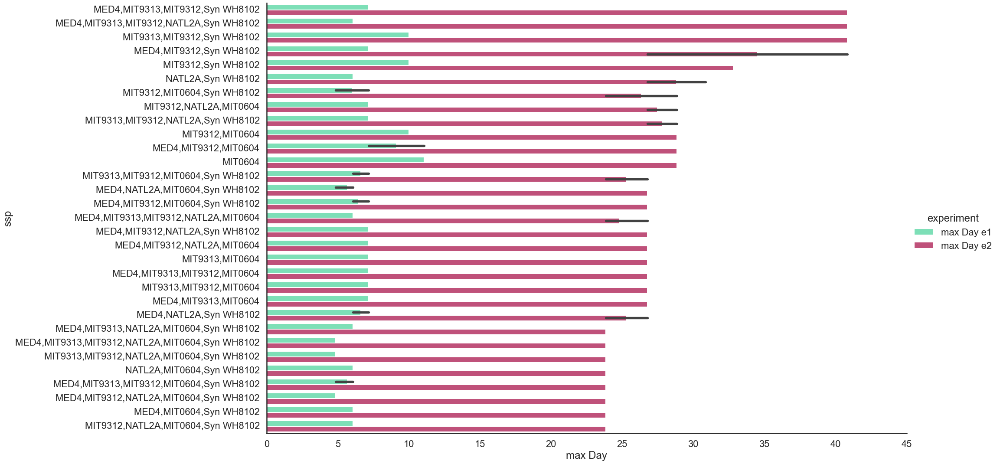

In [96]:
nl_df = pp.loc[pp['diff max Day']>17]
nl_df.head()
nl_df = nl_df.sort_values(by='max Day e2', axis=0, ascending=False)[['ssp', 'max Day e1', 'max Day e2']]
nl_df =pd.melt(nl_df, id_vars='ssp', value_vars=['max Day e1','max Day e2'], var_name='experiment', value_name='max Day')
sns.catplot(data=nl_df, y='ssp', hue='experiment', x='max Day', kind='bar',palette=epallete, aspect=2, height=15)


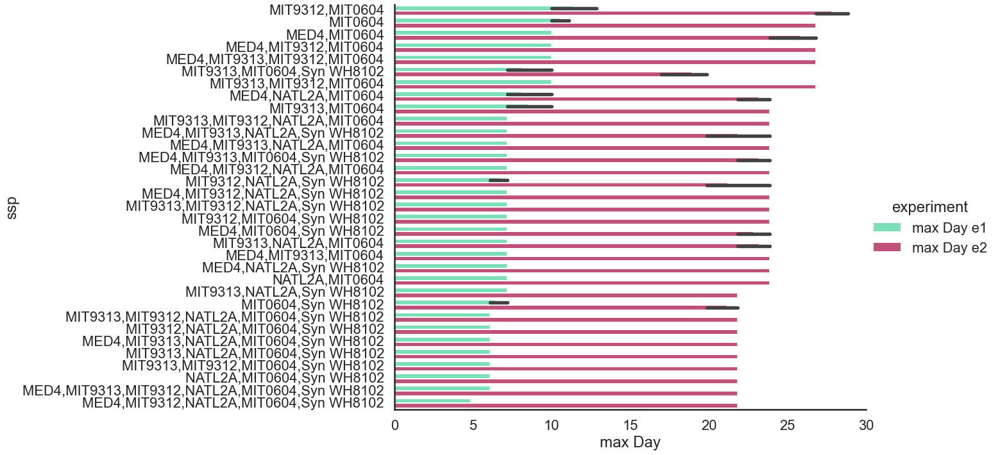

In [97]:
nl_df = pp.loc[(pp['max Day e2']>0) & (pp['diff max Day']<=17)]
nl_df.head()
nl_df = nl_df.sort_values(by='max Day e1', axis=0, ascending=False)[['ssp', 'max Day e1', 'max Day e2']]
nl_df =pd.melt(nl_df, id_vars='ssp', value_vars=['max Day e1','max Day e2'], var_name='experiment', value_name='max Day')
sns.catplot(data=nl_df, y='ssp', hue='experiment', x='max Day', kind='bar',palette=epallete, aspect=2, height=10)


In [98]:
pp.loc[(pp['max Day e2']>0), 'diff max Day'].min()

9.798611113

In [99]:
dfg.columns

Index(['Sample', 'sample_prefix', 'experiment', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'max FL',
       'max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate',
       'decline rate'],
      dtype='object')

In [100]:
ppmm = pd.melt(dfg, 
    id_vars=['Sample', 'sample_prefix', 'experiment', 'num_of_species', 'ssp', 'max FL',
       'max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate',
       'decline rate'],
        var_name='sp', value_vars=species )
ppmm = ppmm.loc[ppmm['value']]              

In [101]:
growing_samples = exp2_dfg.loc[exp2_dfg['max FL'] > 0.2, 'Sample']

In [102]:
ppmm2 = ppmm.loc[ppmm['Sample'].isin(growing_samples)]

In [103]:
pp2 = pp.loc[pp['Sample'].isin(growing_samples)]

In [104]:
dfg2 = dfg.loc[dfg['Sample'].isin(growing_samples)]

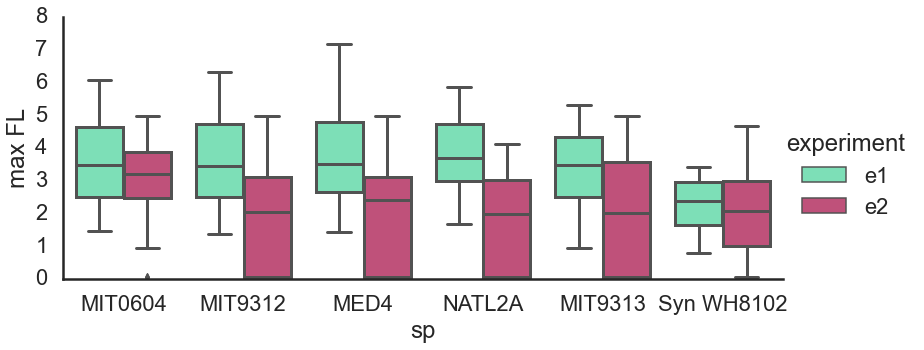

In [105]:
sns.catplot(data=ppmm, x='sp', y='max FL', kind='box', hue='experiment', aspect=2.2, palette=epallete)

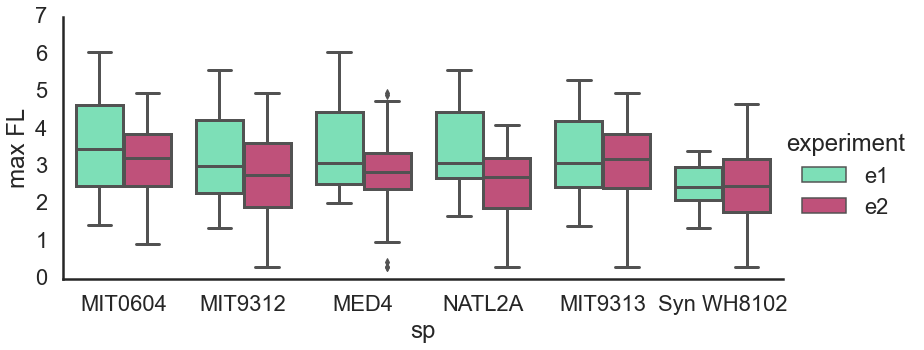

In [106]:
sns.catplot(data=ppmm2, x='sp', y='max FL', kind='box', hue='experiment', aspect=2.2, palette=epallete)

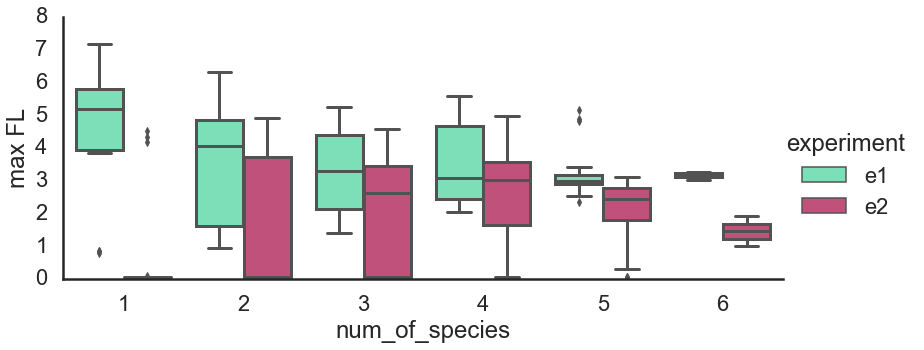

In [107]:
sns.catplot(data=dfg, x='num_of_species', y='max FL', kind='box', hue='experiment', aspect=2.2, palette=epallete)

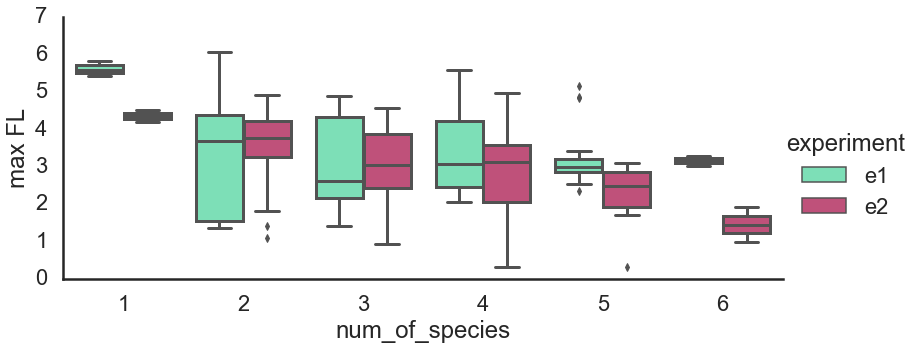

In [108]:
sns.catplot(data=dfg2, x='num_of_species', y='max FL', kind='box', hue='experiment', aspect=2.2, palette=epallete)

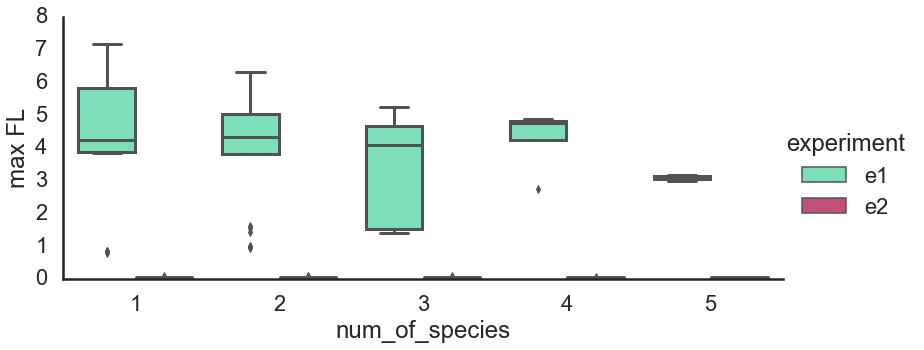

In [109]:
sns.catplot(data=dfg.loc[~dfg.Sample.isin(growing_samples)], x='num_of_species', y='max FL', kind='box', 
            hue='experiment', aspect=2.2, palette=epallete)

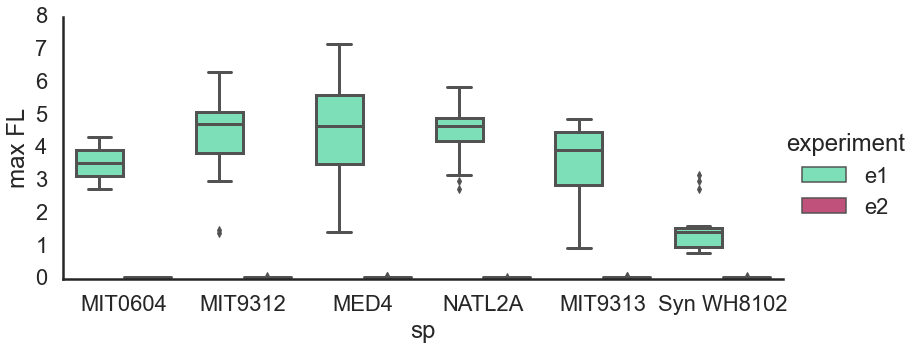

In [110]:
sns.catplot(data=ppmm.loc[~ppmm.Sample.isin(growing_samples)], x='sp', y='max FL', kind='box', 
            hue='experiment', aspect=2.2, palette=epallete)

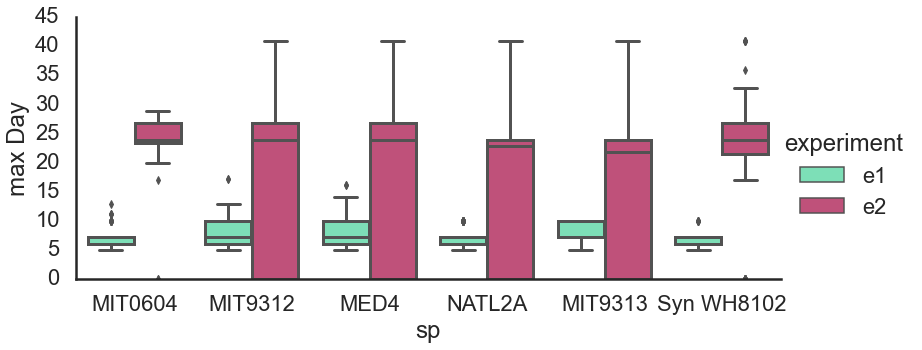

In [111]:
sns.catplot(data=ppmm, x='sp', y='max Day', kind='box', hue='experiment', aspect=2.2, palette=epallete)

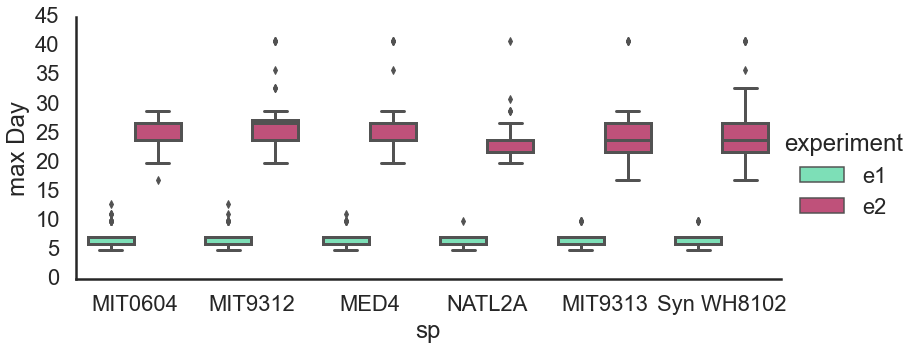

In [112]:
sns.catplot(data=ppmm2, x='sp', y='max Day', kind='box', hue='experiment', aspect=2.2, palette=epallete)

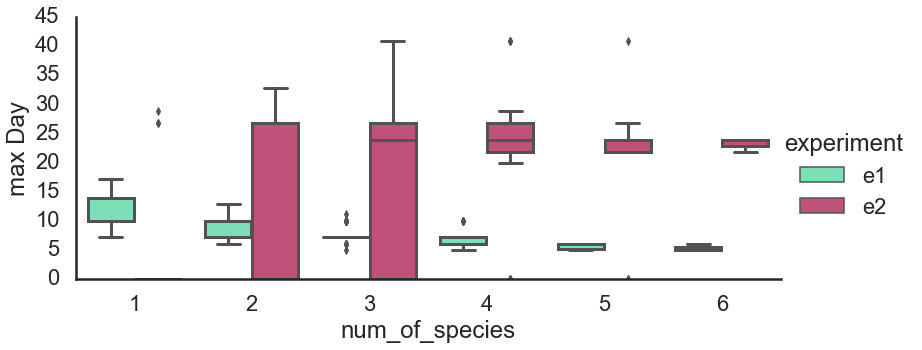

In [113]:
sns.catplot(data=dfg, x='num_of_species', y='max Day', kind='box', hue='experiment', aspect=2.2, palette=epallete)

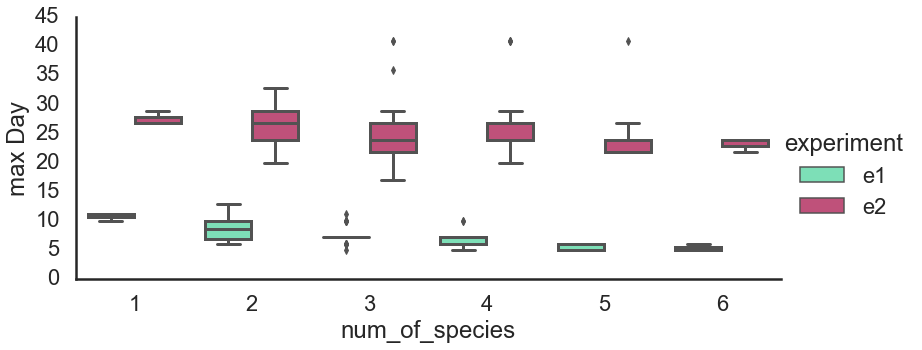

In [114]:
sns.catplot(data=dfg2, x='num_of_species', y='max Day', kind='box', hue='experiment', aspect=2.2, palette=epallete)

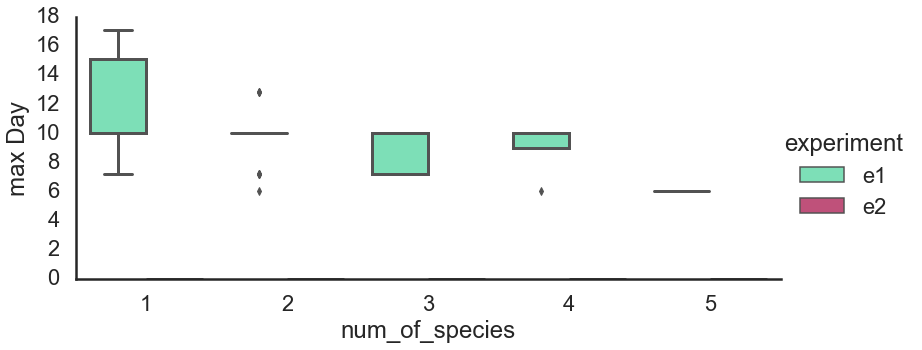

In [115]:
sns.catplot(data=dfg.loc[~dfg.Sample.isin(growing_samples)], x='num_of_species', y='max Day', kind='box', 
            hue='experiment', aspect=2.2, palette=epallete)

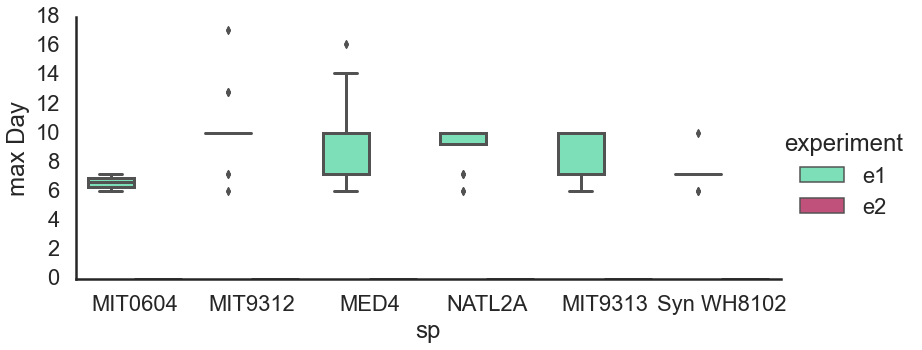

In [116]:
sns.catplot(data=ppmm.loc[~ppmm.Sample.isin(growing_samples)], x='sp', y='max Day', kind='box', 
            hue='experiment', aspect=2.2, palette=epallete)

In [117]:
exp1_dfg.columns

Index(['Sample', 'sample_prefix', 'experiment', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'max FL',
       'max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate',
       'decline rate'],
      dtype='object')

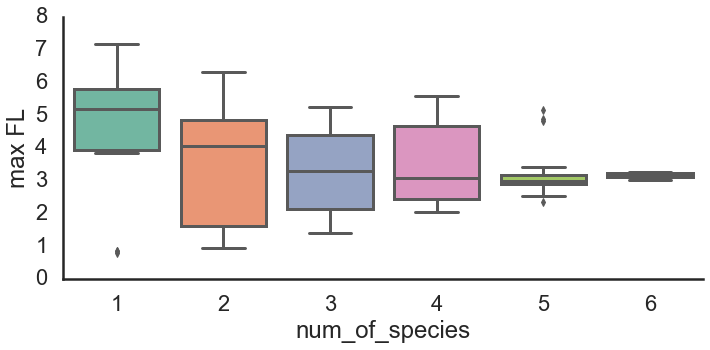

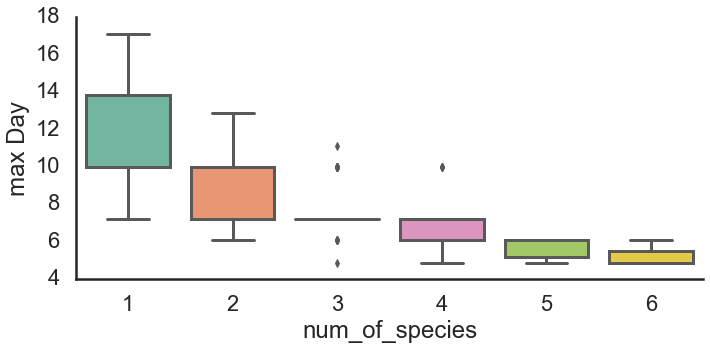

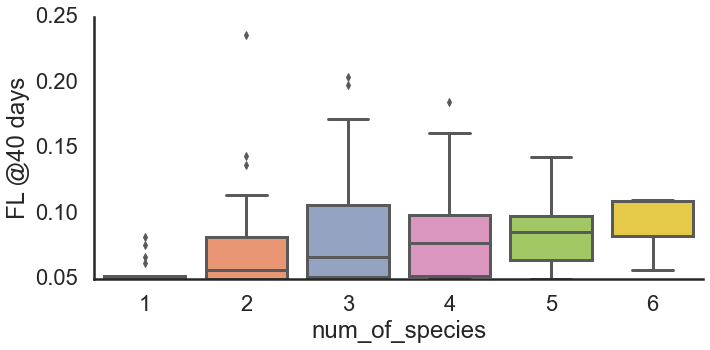

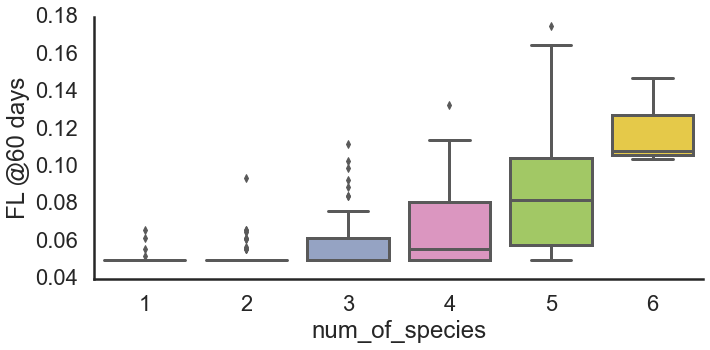

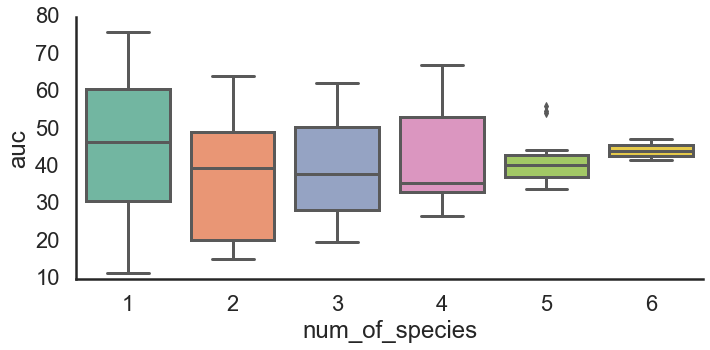

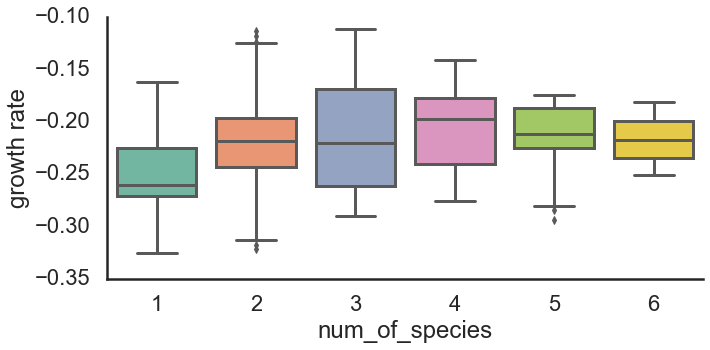

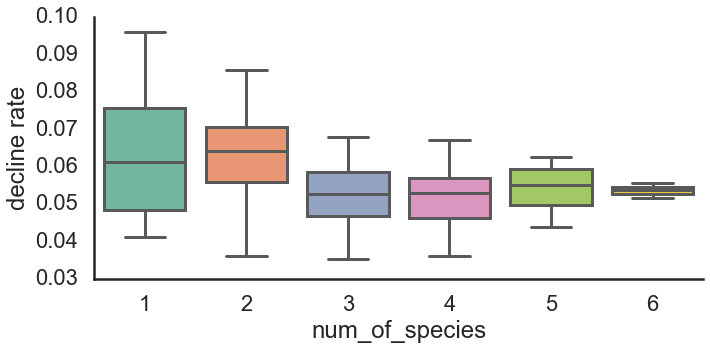

In [118]:
for i in ['max FL','max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate','decline rate']:
    sns.catplot(data=exp1_dfg, x='num_of_species', y=i, kind='box', palette='Set2',# hue='num_of_species',
                aspect=2)

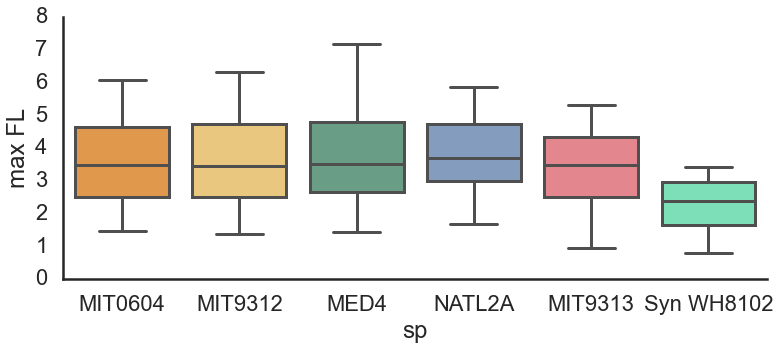

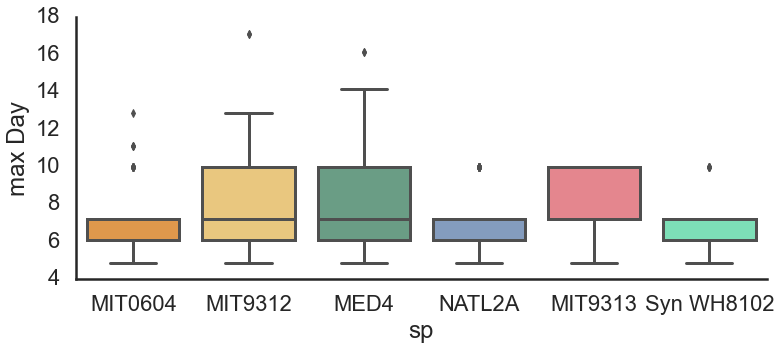

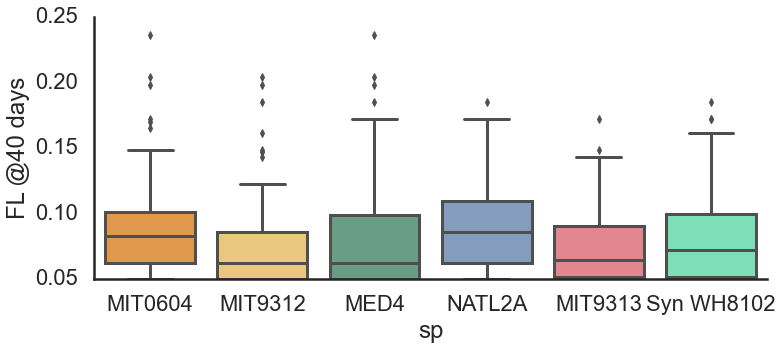

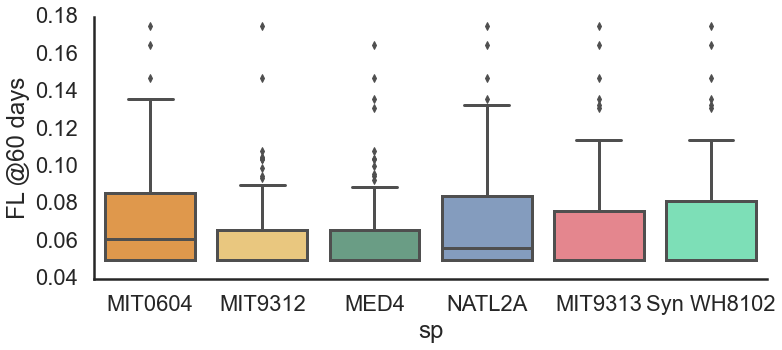

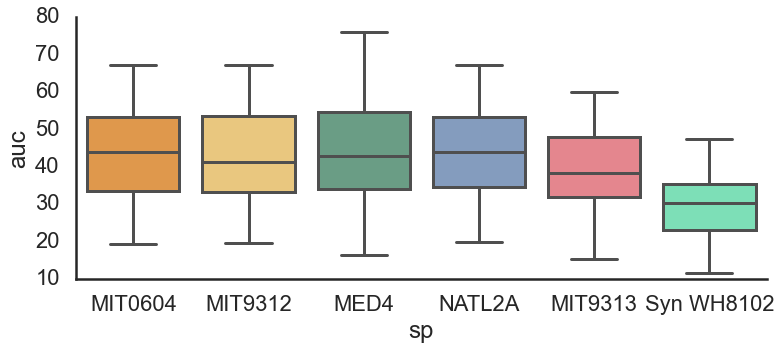

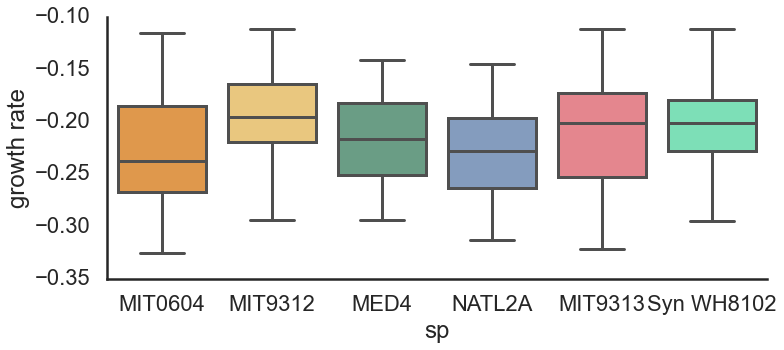

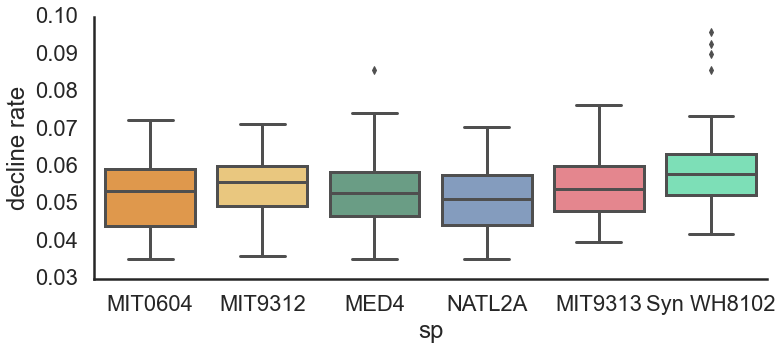

In [119]:
for i in ['max FL','max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate','decline rate']:
    sns.catplot(data=ppmm.loc[ppmm.experiment=='e1'], 
                x='sp', y=i, kind='box', palette=ppallete, order=species, # hue='num_of_species',
                aspect=2.2)

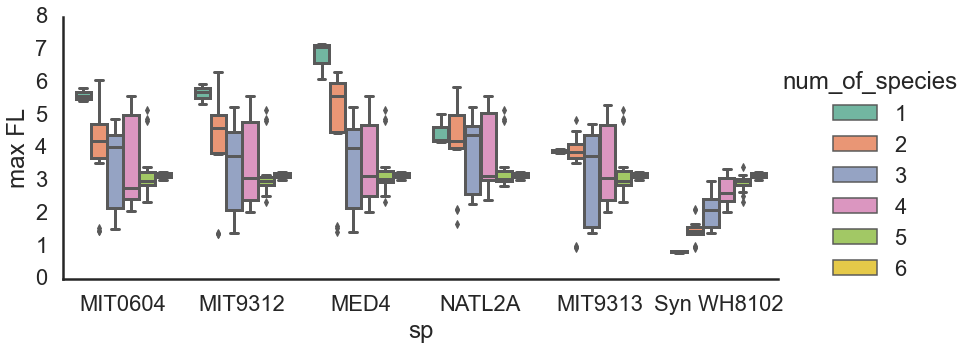

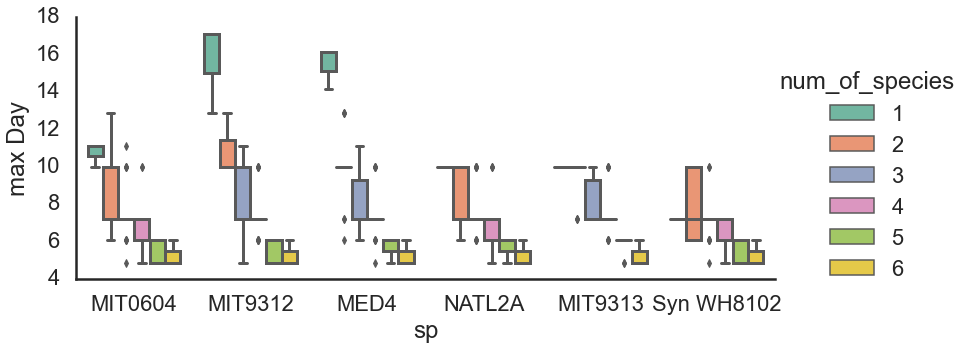

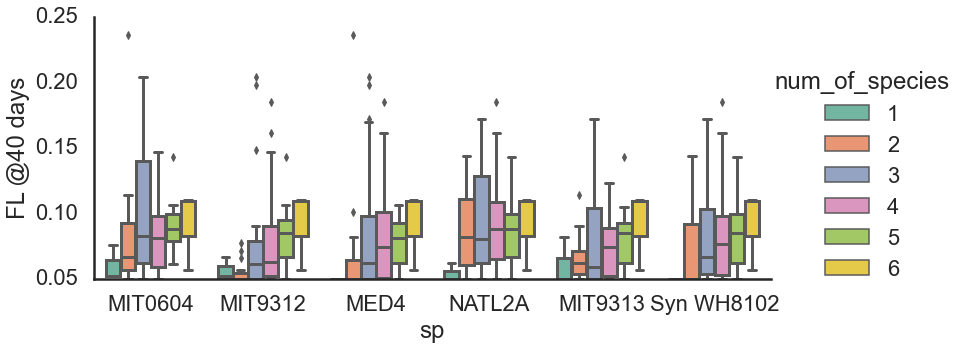

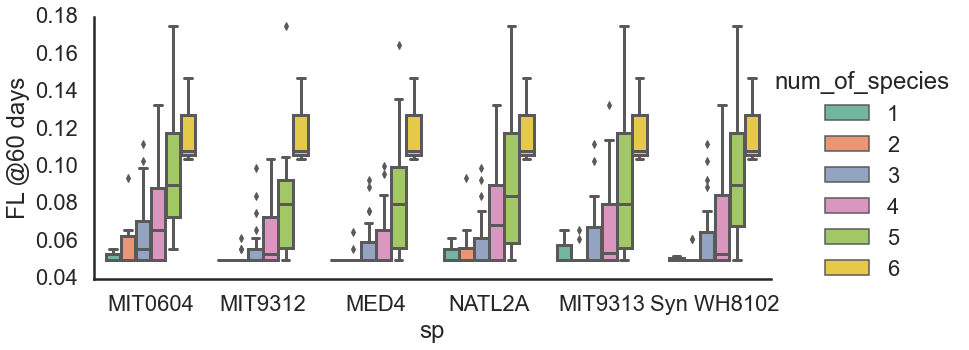

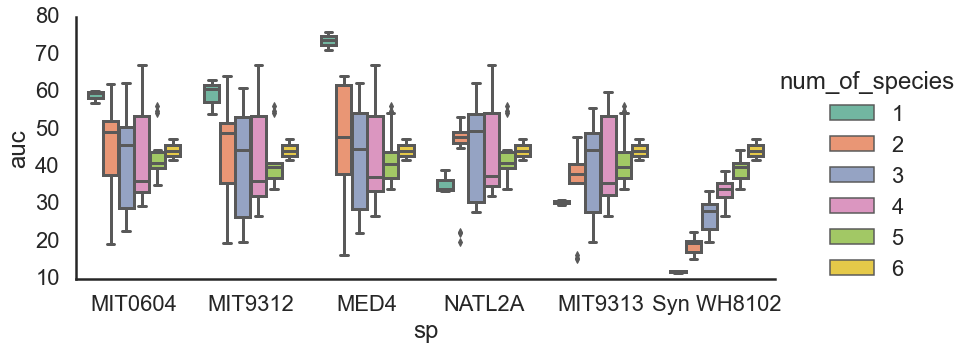

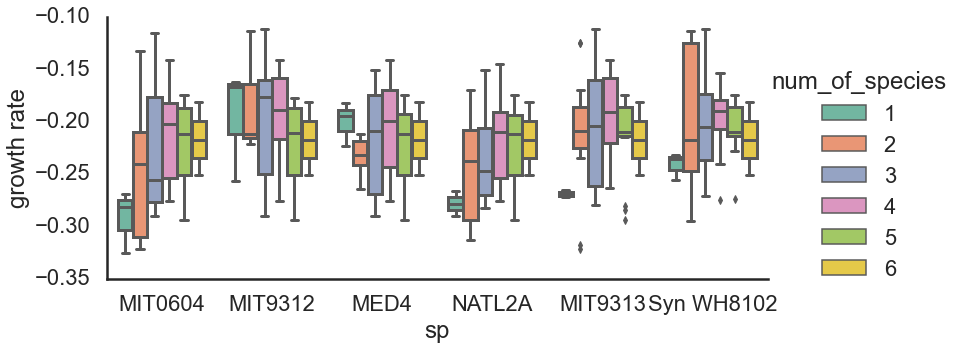

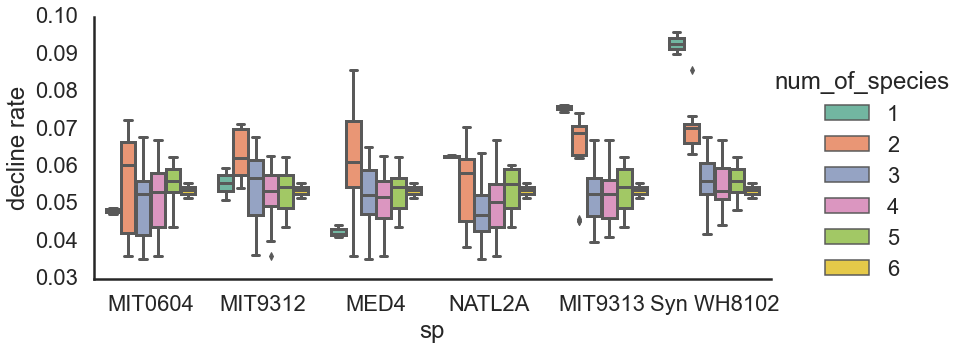

In [120]:
for i in ['max FL','max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate','decline rate']:
    sns.catplot(data=ppmm.loc[ppmm.experiment=='e1'], 
                x='sp', y=i, kind='box', palette='Set2', 
                order=species, hue='num_of_species',
                aspect=2.2)

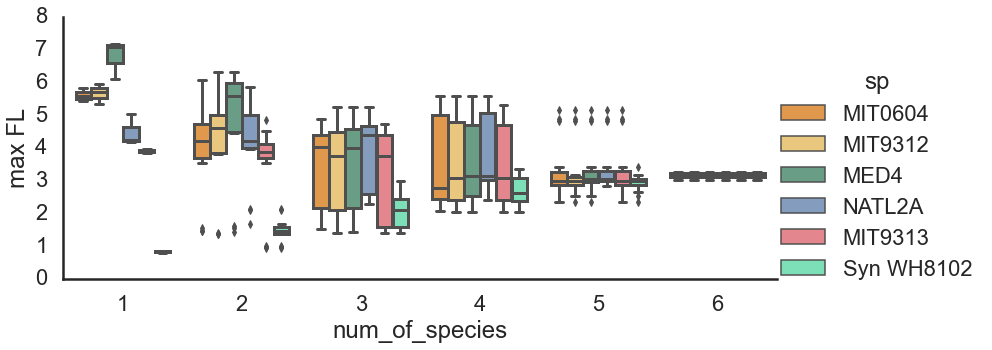

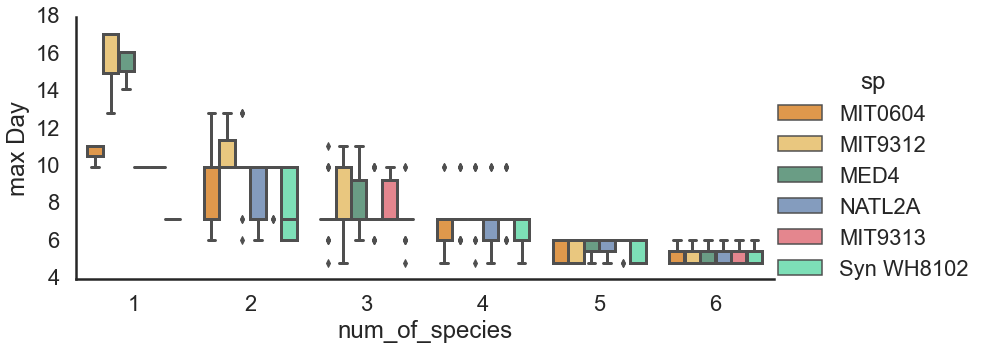

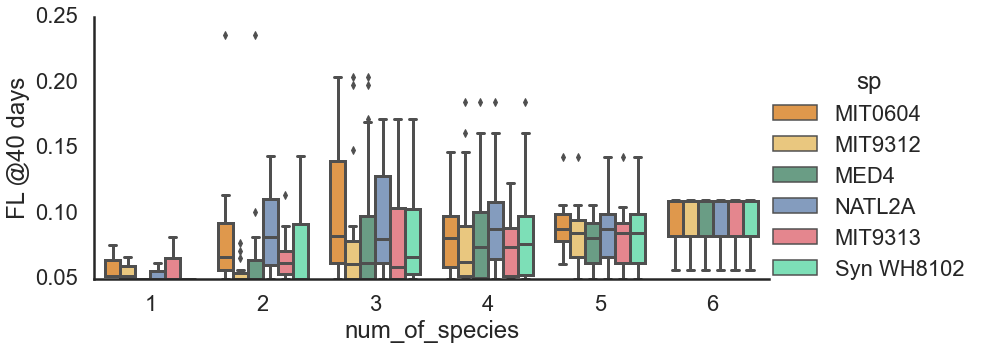

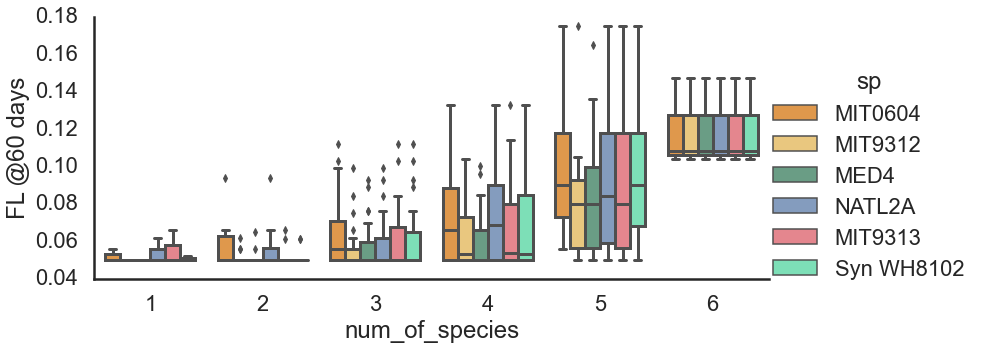

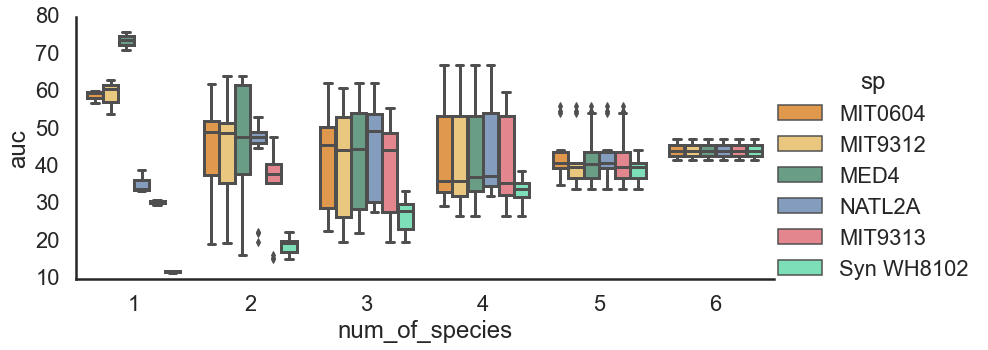

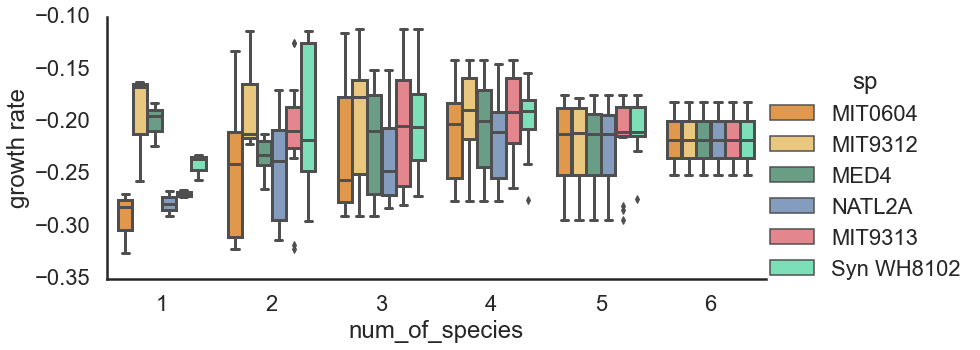

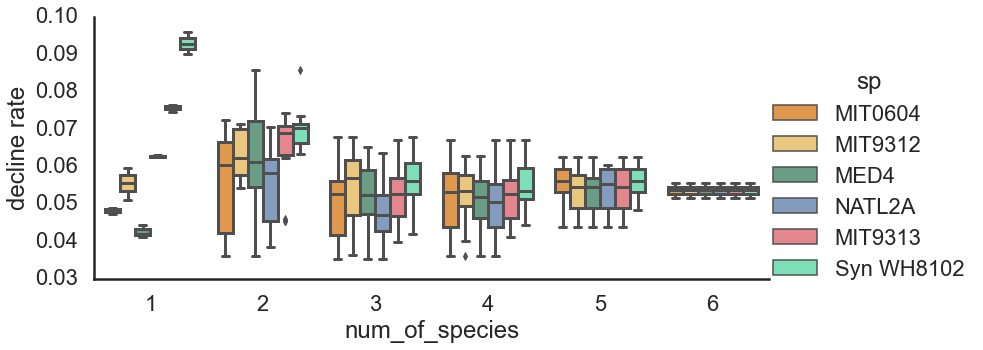

In [121]:
for i in ['max FL','max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate','decline rate']:
    sns.catplot(data=ppmm.loc[ppmm.experiment=='e1'], 
                hue='sp', y=i, kind='box', palette=ppallete, 
                hue_order=species, x='num_of_species',
                aspect=2.2)

# experiment 2

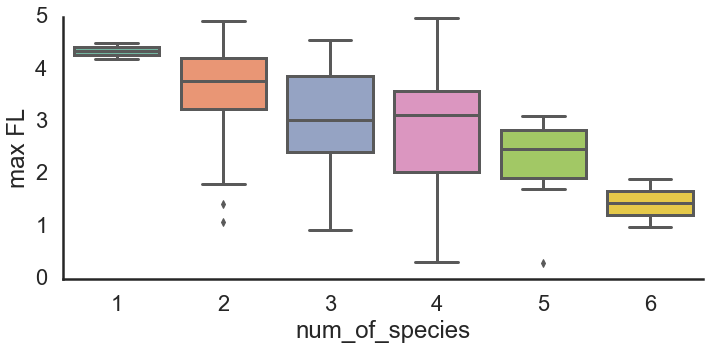

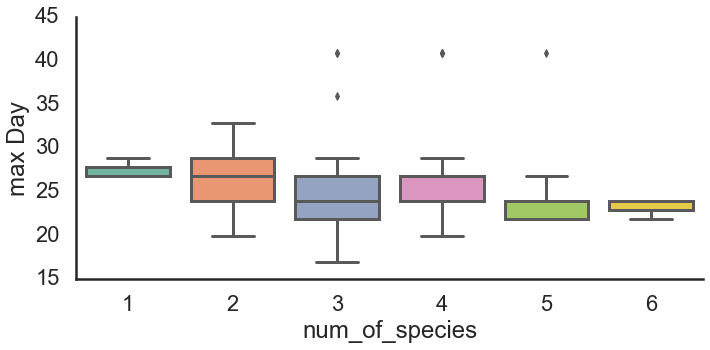

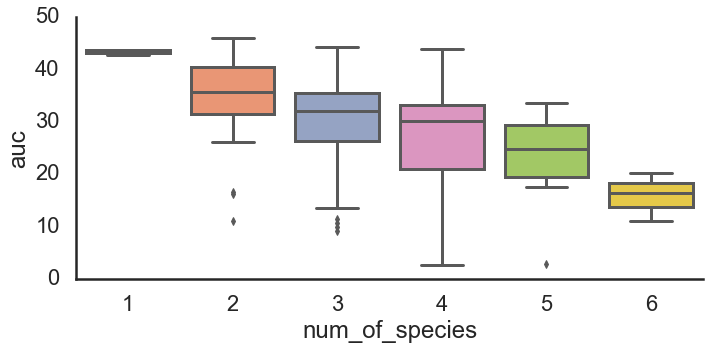

In [122]:
for i in ['max FL','max Day', 'auc']:
    sns.catplot(data=exp2_dfg.loc[exp2_dfg['max Day']>0], x='num_of_species', y=i, kind='box', palette='Set2',# hue='num_of_species',
                aspect=2)

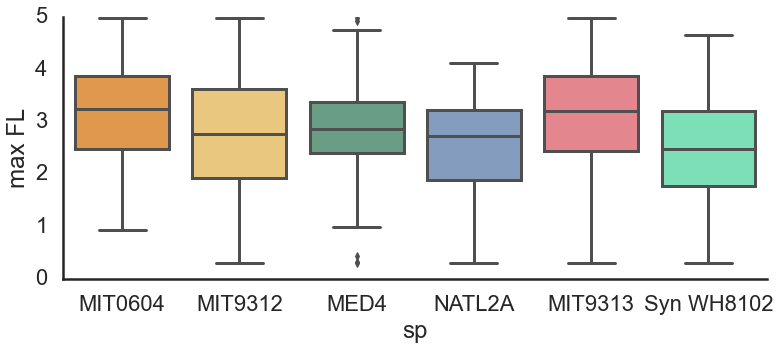

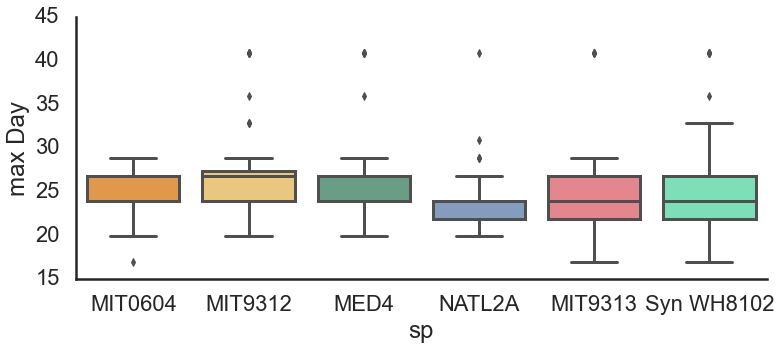

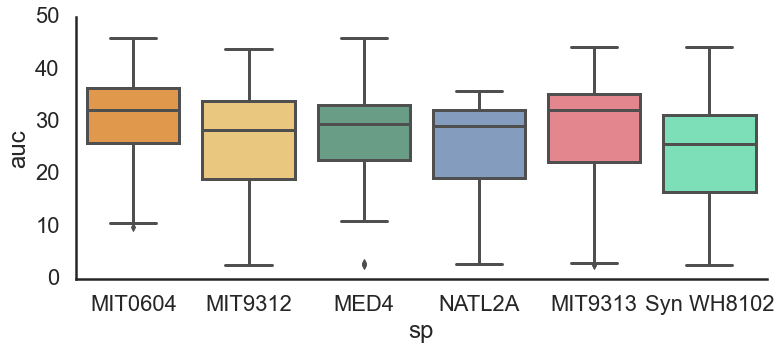

In [123]:
for i in ['max FL','max Day', 'auc',]:
    sns.catplot(data=ppmm2.loc[ppmm2.experiment=='e2'], 
                x='sp', y=i, kind='box', palette=ppallete, order=species, # hue='num_of_species',
                aspect=2.2)

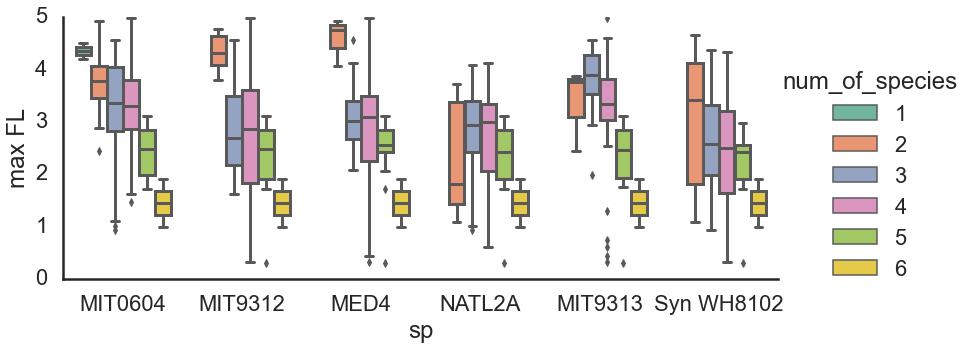

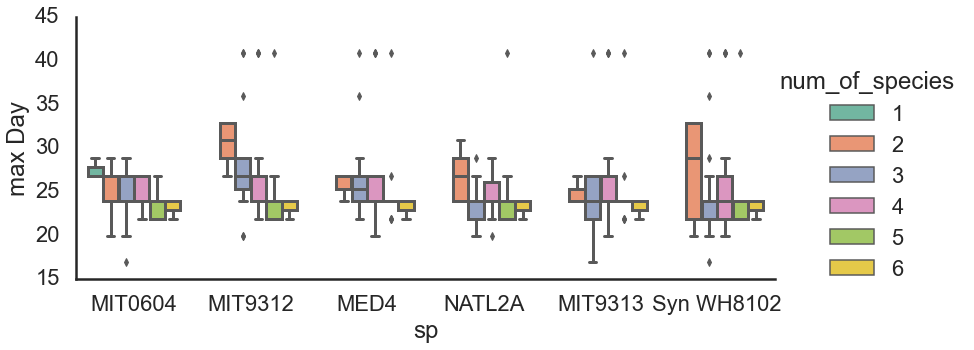

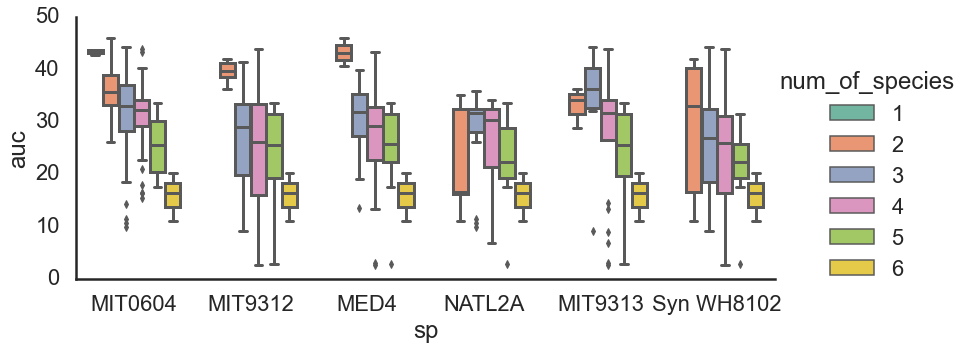

In [124]:
for i in ['max FL','max Day', 'auc',]:
    sns.catplot(data=ppmm2.loc[ppmm2.experiment=='e2'], 
                x='sp', y=i, kind='box', palette='Set2', 
                order=species, hue='num_of_species',
                aspect=2.2)

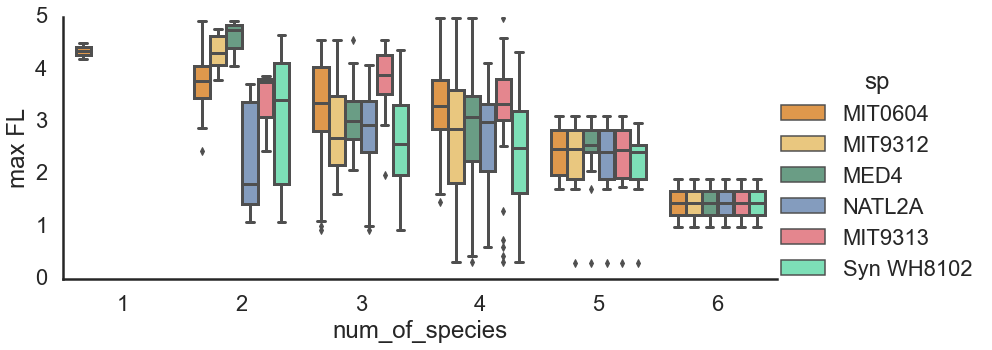

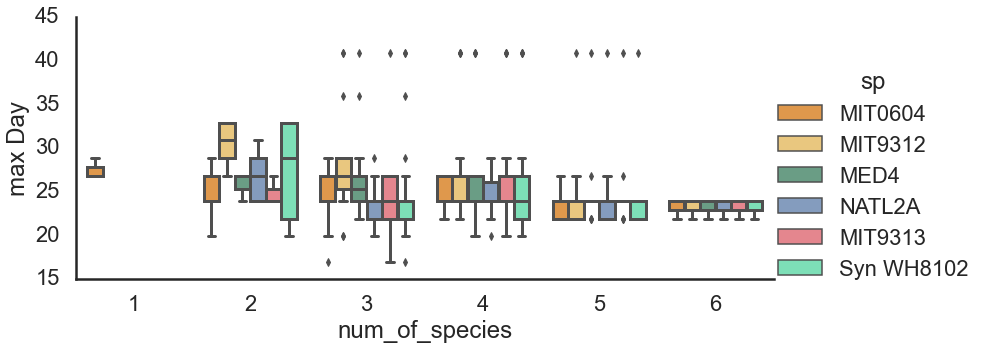

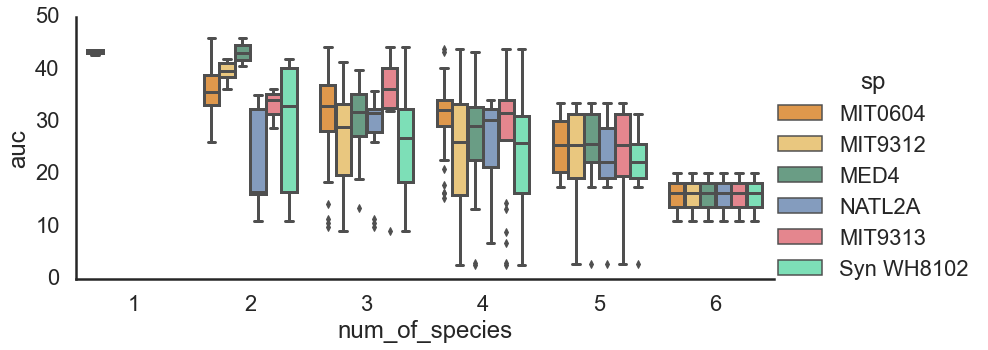

In [125]:
for i in ['max FL','max Day',  'auc', ]:
    sns.catplot(data=ppmm2.loc[ppmm2.experiment=='e2'], 
                hue='sp', y=i, kind='box', palette=ppallete, 
                hue_order=species, x='num_of_species',
                aspect=2.2)

In [126]:
pp.columns

Index(['Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312', 'NATL2A',
       'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL @40 days e1',
       'FL @60 days e1', 'auc e1', 'auc e2', 'decline rate e1',
       'growth rate e1', 'max Day e1', 'max Day e2', 'max FL e1', 'max FL e2',
       'diff max FL', 'diff max Day', '604/syn', 'growing'],
      dtype='object')

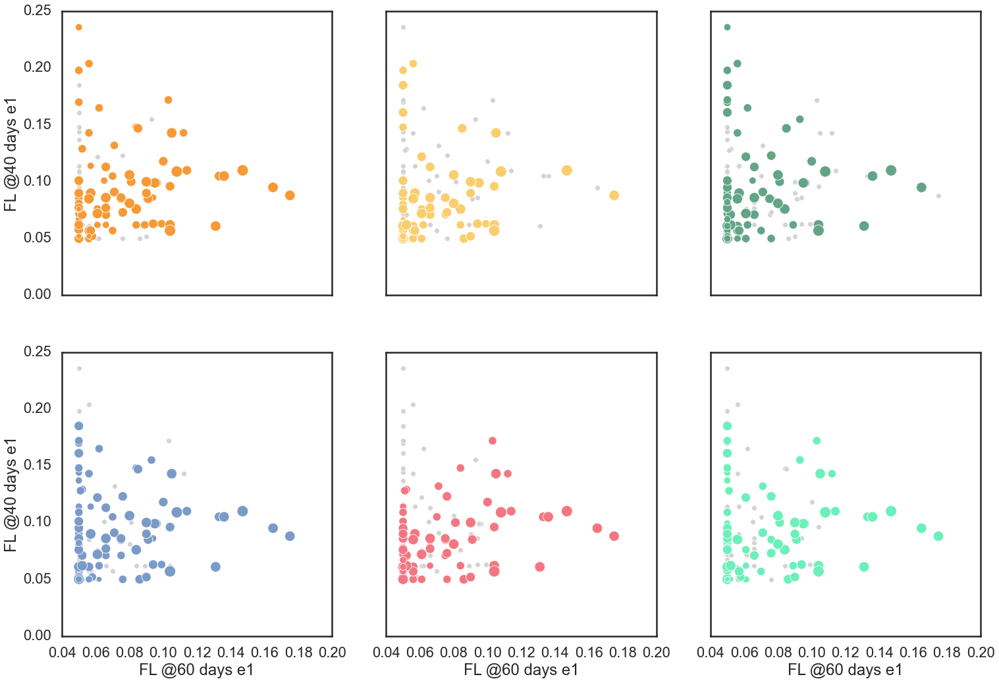

In [127]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(25,17))
    
for idx,i in enumerate(species):
    sns.scatterplot(data=pp, # .loc[pp['max FL e2']> 0.5], 
                    x='FL @60 days e1', y='FL @40 days e1', 
                    s=60, #size='num_of_species', 
                     color=other_color, 
                    ax=axs[idx//3, idx%3])
    sns.scatterplot(data=pp.loc[pp[i]], # & (pp['max FL e2']> 0.5)],
                    x='FL @60 days e1', y='FL @40 days e1', 
                    s=80, size='num_of_species',  
                    #label=i,
                    color=color_dict[i]
                   , ax=axs[idx//3, idx%3],
                   legend=False
                   )

#plt.legend(loc='best')
#leg = g.get_legend()

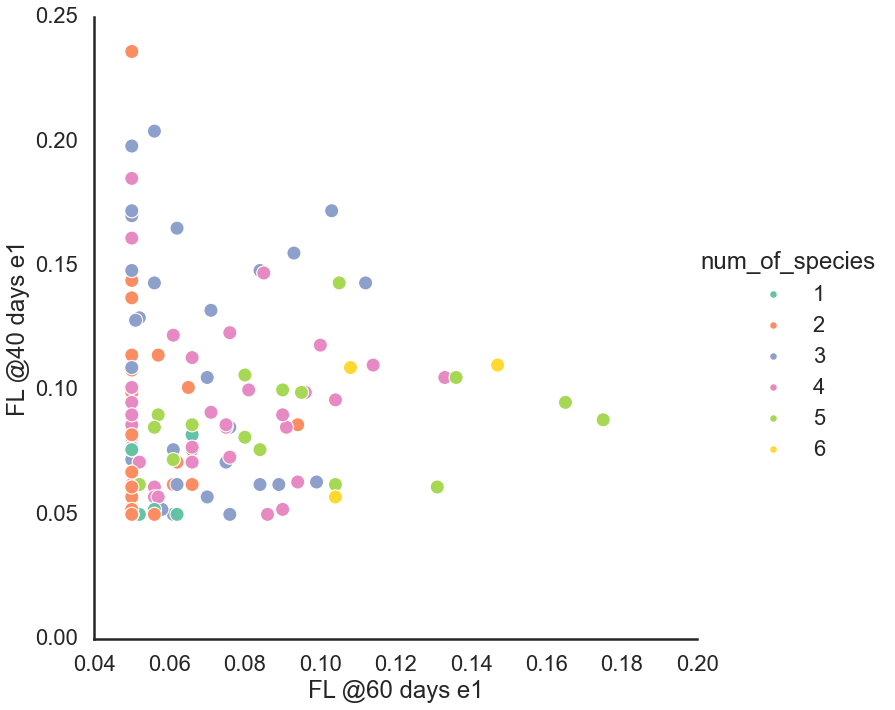

In [128]:
    sns.relplot(data=pp, # .loc[pp['max FL e2']> 0.5], 
                    x='FL @60 days e1', y='FL @40 days e1', 
                    s=200, hue='num_of_species', 
                    palette='Set2', legend='full', #legend_out=True,
                    #aspect=1.6, 
                height=10, 
                   )

C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Osnat\Anaconda3\lib\site-packages\seaborn\distributions.py:1185: UserWarning: No contour levels were found within the data range.
  **contour_kws,


<AxesSubplot:xlabel='FL @60 days e1', ylabel='FL @40 days e1'>

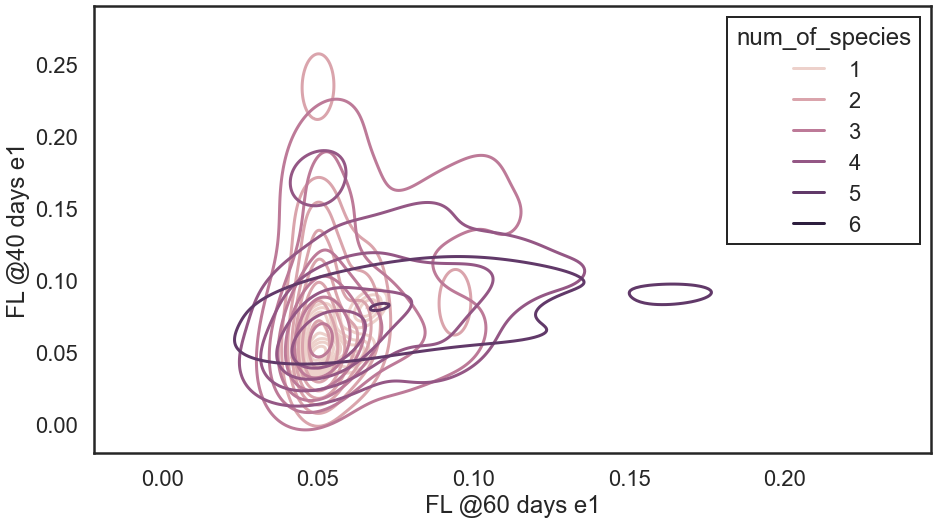

In [129]:
    sns.kdeplot(pp['FL @60 days e1'], pp['FL @40 days e1'],
                    #s=200, 
                hue=pp['num_of_species'], 
                    #palette='Set2', legend='full', #legend_out=True,
                    #aspect=1.6, 
                #height=10, 
                   )

In [130]:
ppmm.columns

Index(['Sample', 'sample_prefix', 'experiment', 'num_of_species', 'ssp',
       'max FL', 'max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate',
       'decline rate', 'sp', 'value'],
      dtype='object')

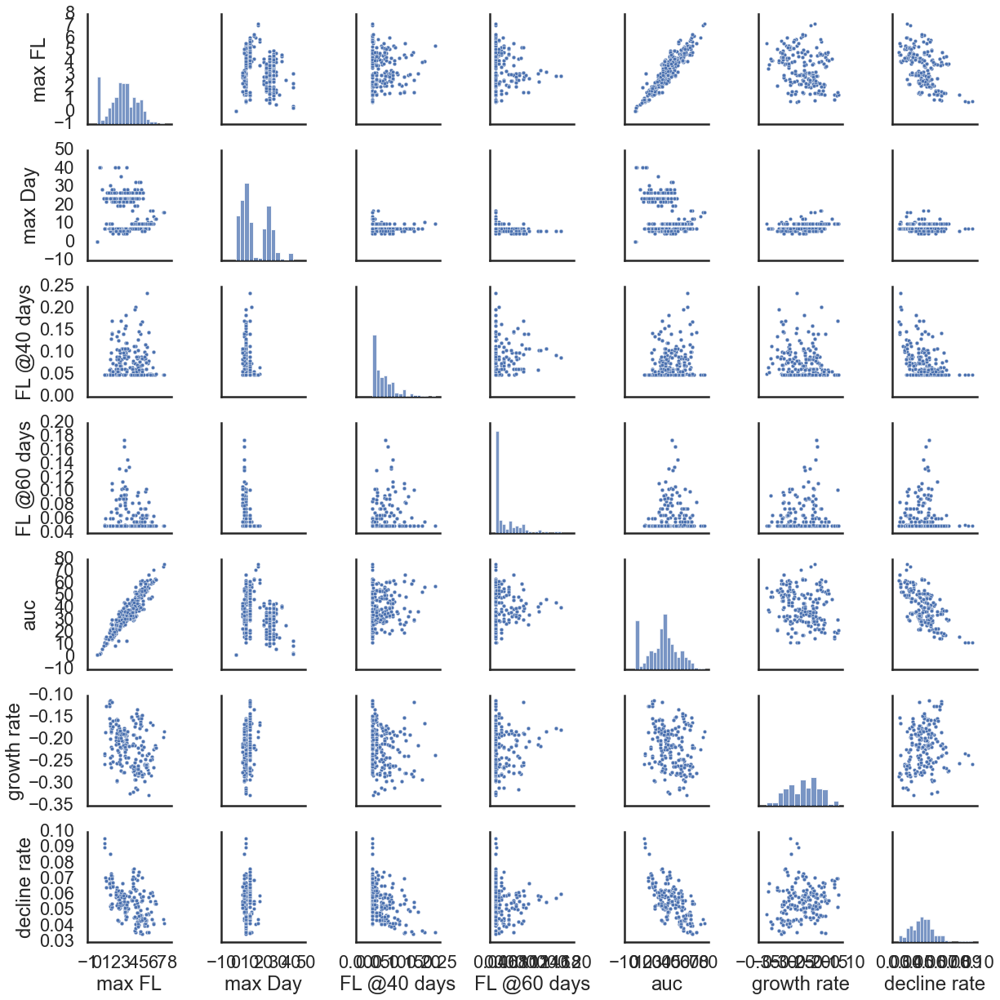

In [131]:
sns.pairplot(data=ppmm[['Sample', 'experiment',  'ssp',
       'max FL', 'max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate',
       'decline rate', 'sp']])

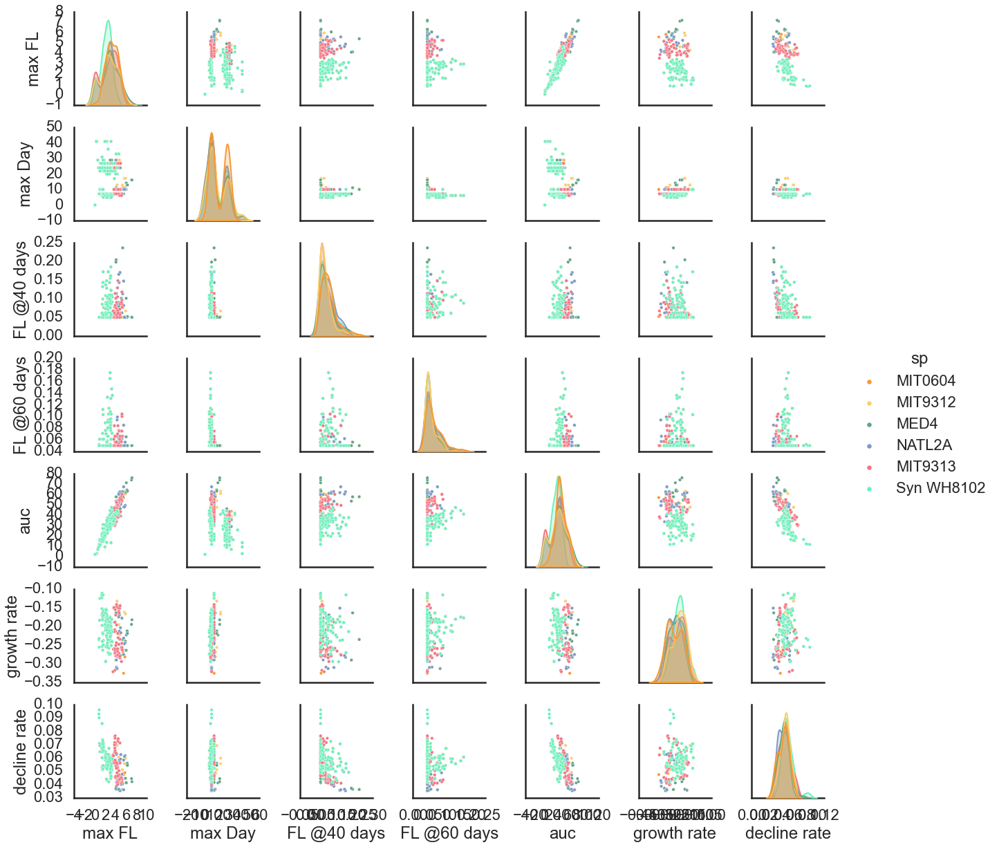

In [132]:
sns.pairplot(data=ppmm[['Sample', 'experiment',  'ssp',
       'max FL', 'max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate',
       'decline rate', 'sp']],
            hue='sp', hue_order=species, palette=ppallete)

In [133]:
ppmm.columns

Index(['Sample', 'sample_prefix', 'experiment', 'num_of_species', 'ssp',
       'max FL', 'max Day', 'FL @40 days', 'FL @60 days', 'auc', 'growth rate',
       'decline rate', 'sp', 'value'],
      dtype='object')

In [134]:
species

['MIT0604', 'MIT9312', 'MED4', 'NATL2A', 'MIT9313', 'Syn WH8102']

In [135]:
from itertools import combinations
len(list(combinations(species, 5)))

6

In [136]:
from itertools import combinations_with_replacement
len(list(combinations_with_replacement(['NATL2A', 'MIT0604', 'Syn WH8102'], 3)))

10

# PCA

In [137]:
sample_col = 'Sample'
X = cp.experiments2X(exp1_df, value_col='FL', sample_col='Sample', x_col='Day', cumsummode=False)
metadf = cp.get_meta(exp1_df, meta_col=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col, n_components=3)

Variance percent explained
 [0.38164458 0.18550091 0.1211929 ]


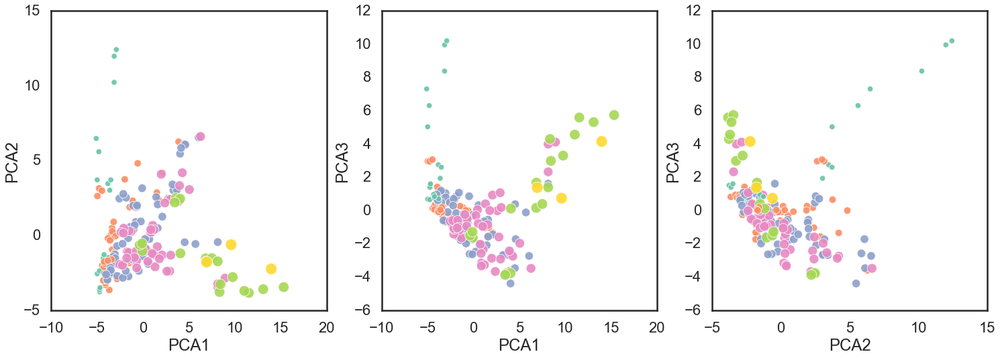

In [138]:
fig, axs = plt.subplots(1, 3, #sharex=True, sharey=True, 
                        figsize=(25, 8))
for j,x,y  in [(0,'PCA1', 'PCA2'),
               (1,'PCA1', 'PCA3'),
               (2,'PCA2', 'PCA3'),
              ]:
    sns.scatterplot(data=dfpca, x=x, y=y, hue='num_of_species', 
            size='num_of_species', palette='Set2',
            s=100, alpha=0.9, #height=7, aspect=1.2,
            legend=False, 
                ax=axs[j]
           )

#plt.legend(bbox_to_anchor=(2,1))

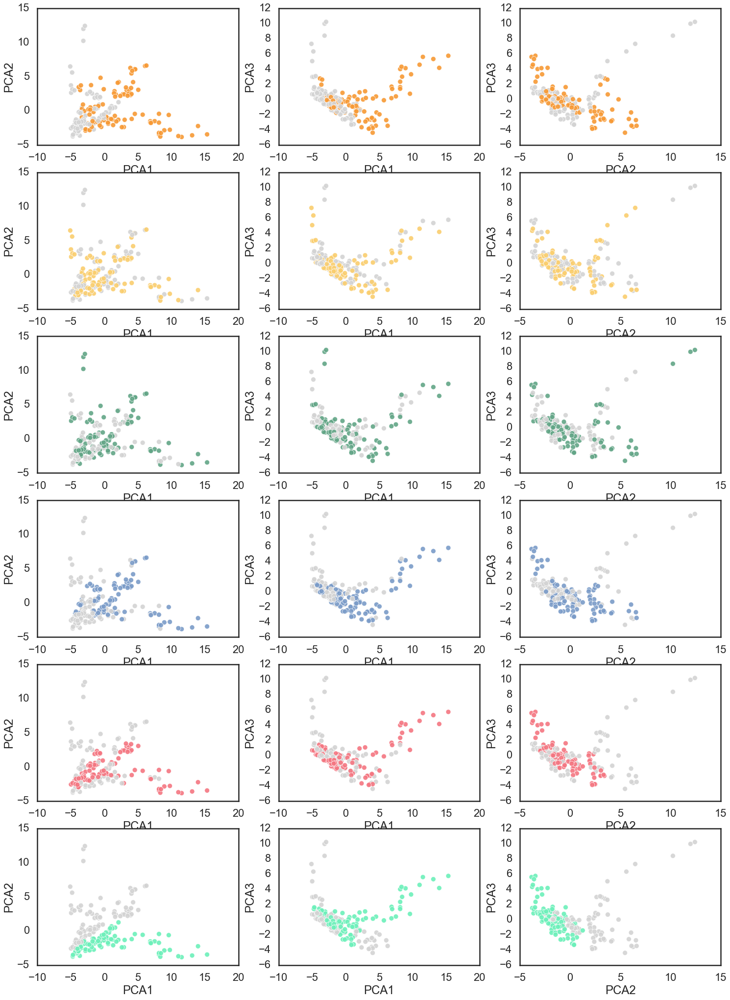

In [139]:
fig, axs = plt.subplots(6, 3, figsize=(25,35)) #, sharex=True, sharey=True)
for idx,i in enumerate(species):
#fig, axs = plt.subplots(1, 3, #sharex=True, sharey=True, 
#                        figsize=(25, 8))

    for j,x,y  in [(0,'PCA1', 'PCA2'),
                   (1,'PCA1', 'PCA3'),
                   (2,'PCA2', 'PCA3'),
                  ]:
        sns.scatterplot(data=dfpca, x=x, y=y, hue=i, 
                #size=i, #palette='Set2',
                s=100, alpha=0.9, #height=7, aspect=1.2,
                legend=False, 
                    ax=axs[idx,j],
                    palette=[other_color, color_dict[i]],                
           )

No handles with labels found to put in legend.


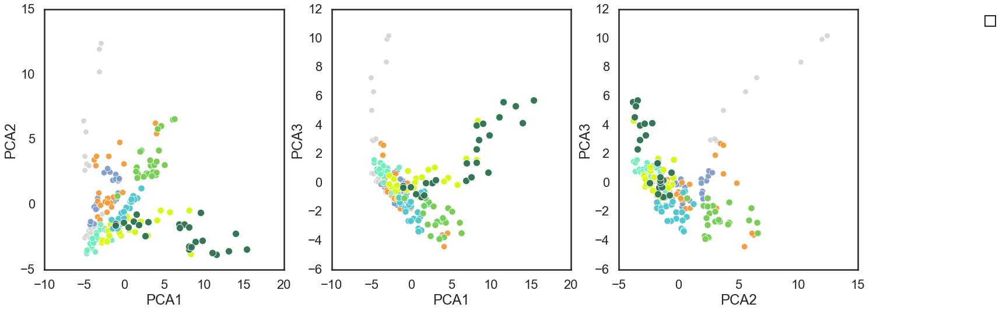

In [140]:
fig, axs = plt.subplots(1, 3, #sharex=True, sharey=True, 
                        figsize=(25, 8))
for j,x,y  in [(0,'PCA1', 'PCA2'),
               (1,'PCA1', 'PCA3'),
               (2,'PCA2', 'PCA3'),
              ]:
    sns.scatterplot(data=dfpca, x=x, y=y, 
                s=90, alpha=0.9, #height=5, aspect=1.2,
                color=other_color, #label='other', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['NATL2A']], 
                    x=x, y=y, 
                s=110, alpha=0.9, #height=5, aspect=1.2,
                color=Natl2A_color, #label='NATL2A', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['MIT0604']], 
                    x=x, y=y, 
                s=110, alpha=0.9, #height=5, aspect=1.2,
                color=MIT0604_color, #label='MIT0604', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102']], 
                    x=x, y=y, 
                s=110, alpha=0.9, #height=5, aspect=1.2,
                color=SYN_color, #label='Syn WH8102', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['MIT0604']], 
                    x=x, y=y, 
                s=130, alpha=0.9, #height=5, aspect=1.2,
                color=syn_0606_color, #label='Syn WH8102 & MIT0604', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A']], 
                    x=x, y=y, 
                s=130, alpha=0.9, #height=5, aspect=1.2,
                color=syn_natl_color, #label='Syn WH8102 & NATL2A', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['MIT0604'] & dfpca['NATL2A']], 
                    x=x, y=y, 
                s=130, alpha=0.9, #height=5, aspect=1.2,
                color=natl_0604_color, #label='MIT0604 & NATL2A', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A'] & dfpca['MIT0604']], 
                    x=x, y=y, 
                s=150, alpha=0.9, #height=5, aspect=1.2,
                color=syn_natl_0604_color, #label='Syn WH8102 & NATL2A & MIT0604', 
                    ax=axs[j])
#plt.legend(False)
plt.legend(bbox_to_anchor=(1.6, 1))

# experiment 2 pca - growing samples

In [141]:
sample_col = 'Sample'
X = cp.experiments2X(exp2_df, value_col='FL', sample_col='Sample', x_col='Day', cumsummode=False)
metadf = cp.get_meta(exp2_df, meta_col=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col, n_components=3)

Variance percent explained
 [0.30057493 0.27248231 0.11014789]


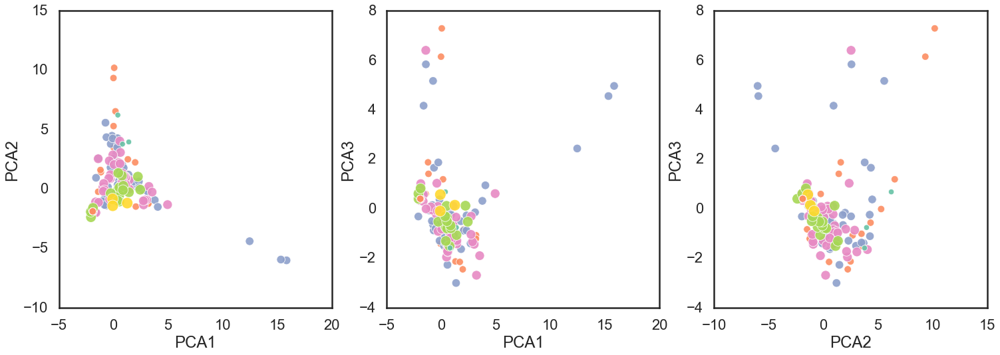

In [142]:
fig, axs = plt.subplots(1, 3, #sharex=True, sharey=True, 
                        figsize=(25, 8))
for j,x,y  in [(0,'PCA1', 'PCA2'),
               (1,'PCA1', 'PCA3'),
               (2,'PCA2', 'PCA3'),
              ]:
    sns.scatterplot(data=dfpca, x=x, y=y, hue='num_of_species', 
            size='num_of_species', palette='Set2',
            s=100, alpha=0.9, #height=7, aspect=1.2,
            legend=False, 
                ax=axs[j]
           )

#plt.legend(bbox_to_anchor=(2,1))

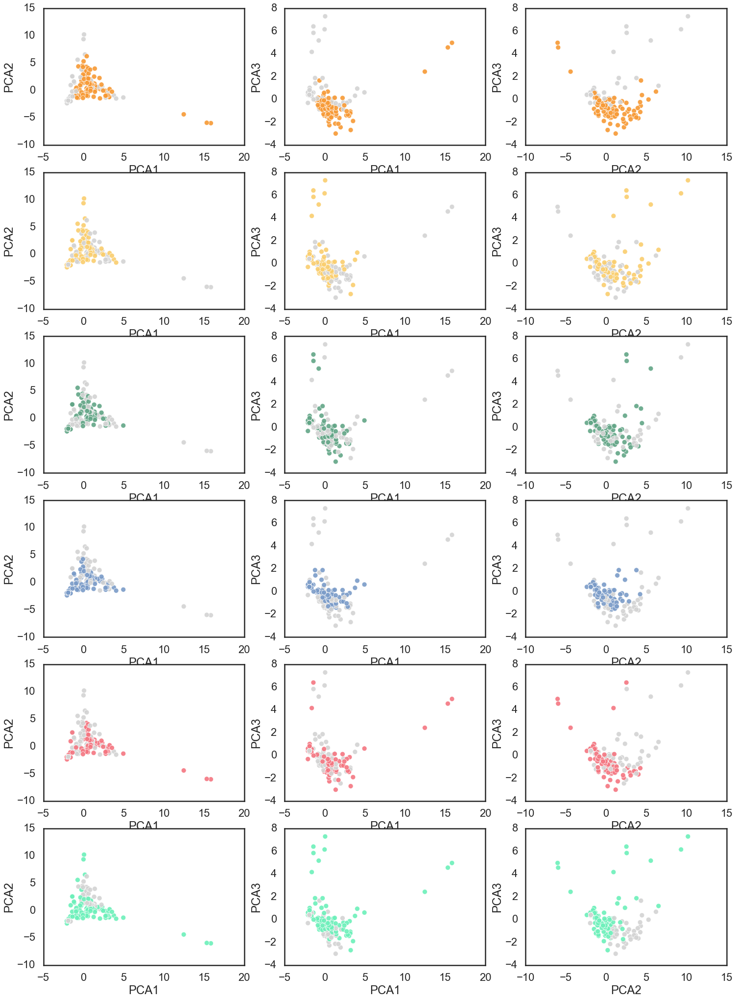

In [143]:
fig, axs = plt.subplots(6, 3, figsize=(25,35)) #, sharex=True, sharey=True)
for idx,i in enumerate(species):
#fig, axs = plt.subplots(1, 3, #sharex=True, sharey=True, 
#                        figsize=(25, 8))

    for j,x,y  in [(0,'PCA1', 'PCA2'),
                   (1,'PCA1', 'PCA3'),
                   (2,'PCA2', 'PCA3'),
                  ]:
        sns.scatterplot(data=dfpca, x=x, y=y, hue=i, 
                #size=i, #palette='Set2',
                s=100, alpha=0.9, #height=7, aspect=1.2,
                legend=False, 
                    ax=axs[idx,j],
                    palette=[other_color, color_dict[i]],                
           )

No handles with labels found to put in legend.


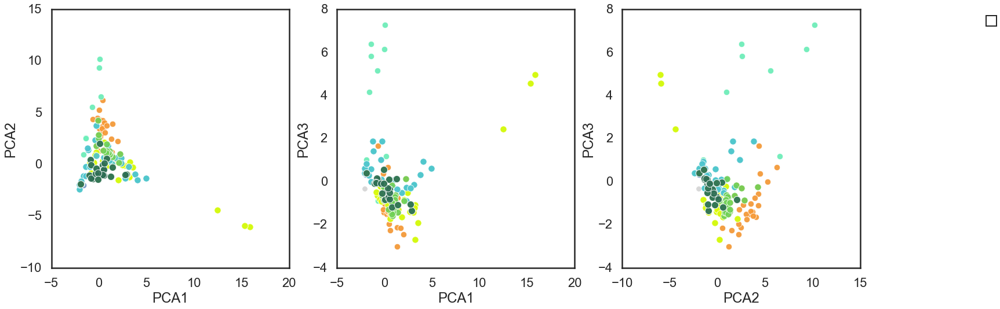

In [144]:
fig, axs = plt.subplots(1, 3, #sharex=True, sharey=True, 
                        figsize=(25, 8))
for j,x,y  in [(0,'PCA1', 'PCA2'),
               (1,'PCA1', 'PCA3'),
               (2,'PCA2', 'PCA3'),
              ]:
    sns.scatterplot(data=dfpca, x=x, y=y, 
                s=90, alpha=0.9, #height=5, aspect=1.2,
                color=other_color, #label='other', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['NATL2A']], 
                    x=x, y=y, 
                s=110, alpha=0.9, #height=5, aspect=1.2,
                color=Natl2A_color, #label='NATL2A', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['MIT0604']], 
                    x=x, y=y, 
                s=110, alpha=0.9, #height=5, aspect=1.2,
                color=MIT0604_color, #label='MIT0604', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102']], 
                    x=x, y=y, 
                s=110, alpha=0.9, #height=5, aspect=1.2,
                color=SYN_color, #label='Syn WH8102', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['MIT0604']], 
                    x=x, y=y, 
                s=130, alpha=0.9, #height=5, aspect=1.2,
                color=syn_0606_color, #label='Syn WH8102 & MIT0604', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A']], 
                    x=x, y=y, 
                s=130, alpha=0.9, #height=5, aspect=1.2,
                color=syn_natl_color, #label='Syn WH8102 & NATL2A', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['MIT0604'] & dfpca['NATL2A']], 
                    x=x, y=y, 
                s=130, alpha=0.9, #height=5, aspect=1.2,
                color=natl_0604_color, #label='MIT0604 & NATL2A', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A'] & dfpca['MIT0604']], 
                    x=x, y=y, 
                s=150, alpha=0.9, #height=5, aspect=1.2,
                color=syn_natl_0604_color, #label='Syn WH8102 & NATL2A & MIT0604', 
                    ax=axs[j])
#plt.legend(False)
plt.legend(bbox_to_anchor=(1.6, 1))

# experiment 2 pca

In [145]:
sample_col = 'Sample'
X = cp.experiments2X(exp2_df.loc[exp2_df.Sample.isin(growing_samples)], 
                     value_col='FL', sample_col='Sample', x_col='Day', cumsummode=False)
metadf = cp.get_meta(exp2_df.loc[exp2_df.Sample.isin(growing_samples)], 
                     meta_col=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col, n_components=3)

Variance percent explained
 [0.34990279 0.16837425 0.14805584]


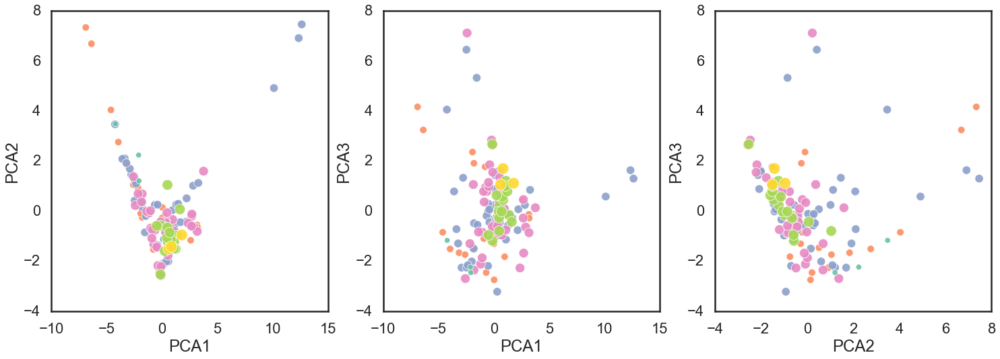

In [146]:
fig, axs = plt.subplots(1, 3, #sharex=True, sharey=True, 
                        figsize=(25, 8))
for j,x,y  in [(0,'PCA1', 'PCA2'),
               (1,'PCA1', 'PCA3'),
               (2,'PCA2', 'PCA3'),
              ]:
    sns.scatterplot(data=dfpca, x=x, y=y, hue='num_of_species', 
            size='num_of_species', palette='Set2',
            s=100, alpha=0.9, #height=7, aspect=1.2,
            legend=False, 
                ax=axs[j]
           )

#plt.legend(bbox_to_anchor=(2,1))

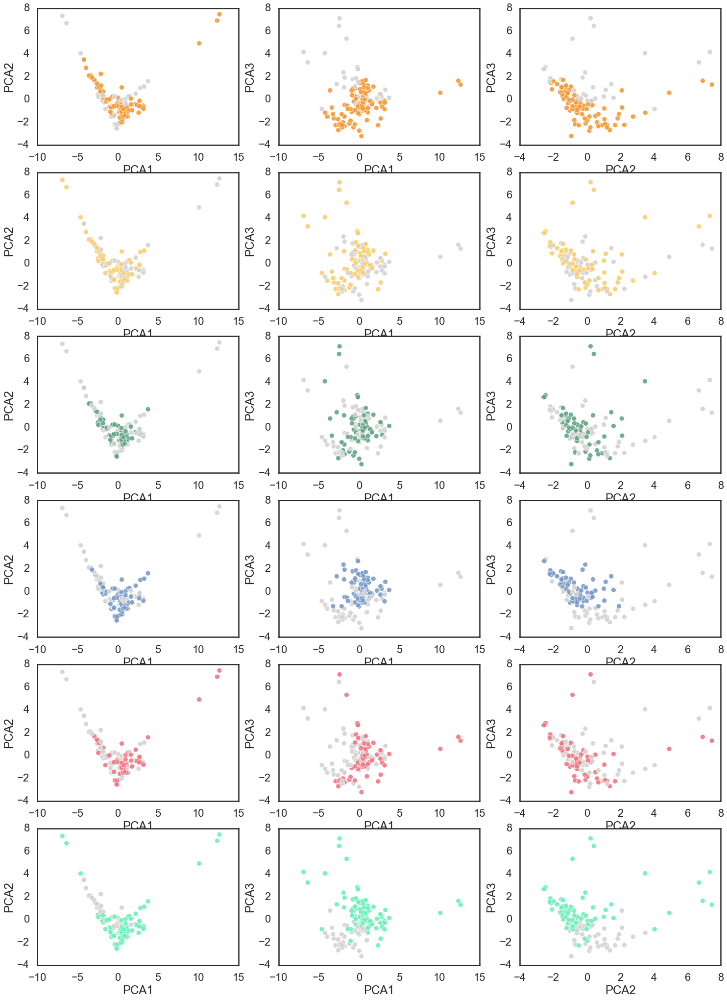

In [147]:
fig, axs = plt.subplots(6, 3, figsize=(25,35)) #, sharex=True, sharey=True)
for idx,i in enumerate(species):
#fig, axs = plt.subplots(1, 3, #sharex=True, sharey=True, 
#                        figsize=(25, 8))

    for j,x,y  in [(0,'PCA1', 'PCA2'),
                   (1,'PCA1', 'PCA3'),
                   (2,'PCA2', 'PCA3'),
                  ]:
        sns.scatterplot(data=dfpca, x=x, y=y, hue=i, 
                #size=i, #palette='Set2',
                s=100, alpha=0.9, #height=7, aspect=1.2,
                legend=False, 
                    ax=axs[idx,j],
                    palette=[other_color, color_dict[i]],                
           )

No handles with labels found to put in legend.


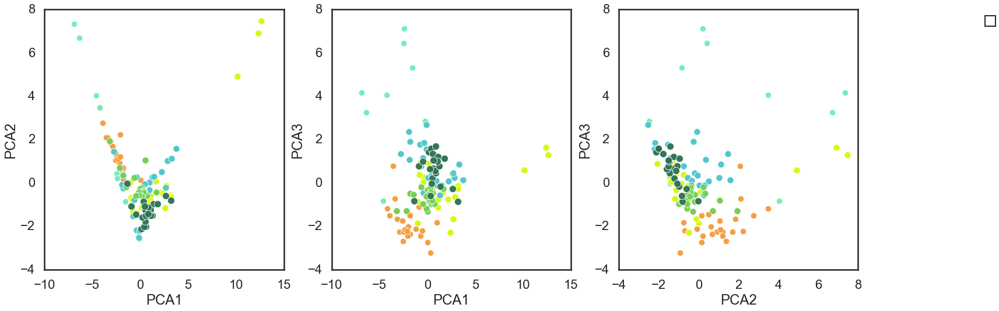

In [148]:
fig, axs = plt.subplots(1, 3, #sharex=True, sharey=True, 
                        figsize=(25, 8))
for j,x,y  in [(0,'PCA1', 'PCA2'),
               (1,'PCA1', 'PCA3'),
               (2,'PCA2', 'PCA3'),
              ]:
    sns.scatterplot(data=dfpca, x=x, y=y, 
                s=90, alpha=0.9, #height=5, aspect=1.2,
                color=other_color, #label='other', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['NATL2A']], 
                    x=x, y=y, 
                s=110, alpha=0.9, #height=5, aspect=1.2,
                color=Natl2A_color, #label='NATL2A', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['MIT0604']], 
                    x=x, y=y, 
                s=110, alpha=0.9, #height=5, aspect=1.2,
                color=MIT0604_color, #label='MIT0604', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102']], 
                    x=x, y=y, 
                s=110, alpha=0.9, #height=5, aspect=1.2,
                color=SYN_color, #label='Syn WH8102', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['MIT0604']], 
                    x=x, y=y, 
                s=130, alpha=0.9, #height=5, aspect=1.2,
                color=syn_0606_color, #label='Syn WH8102 & MIT0604', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A']], 
                    x=x, y=y, 
                s=130, alpha=0.9, #height=5, aspect=1.2,
                color=syn_natl_color, #label='Syn WH8102 & NATL2A', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['MIT0604'] & dfpca['NATL2A']], 
                    x=x, y=y, 
                s=130, alpha=0.9, #height=5, aspect=1.2,
                color=natl_0604_color, #label='MIT0604 & NATL2A', 
                    ax=axs[j])
    sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A'] & dfpca['MIT0604']], 
                    x=x, y=y, 
                s=150, alpha=0.9, #height=5, aspect=1.2,
                color=syn_natl_0604_color, #label='Syn WH8102 & NATL2A & MIT0604', 
                    ax=axs[j])
#plt.legend(False)
plt.legend(bbox_to_anchor=(1.6, 1))

# cluster exp2

In [149]:
sample_col = 'Sample'
X = cp.experiments2X(exp2_df, value_col='FL', sample_col='Sample', x_col='Day', cumsummode=False)
metadf = cp.get_meta(exp2_df, meta_col=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
dfpca = cp.run_tsne(X=X, metadf=metadf, sample_col=sample_col)

0.3155622759390955


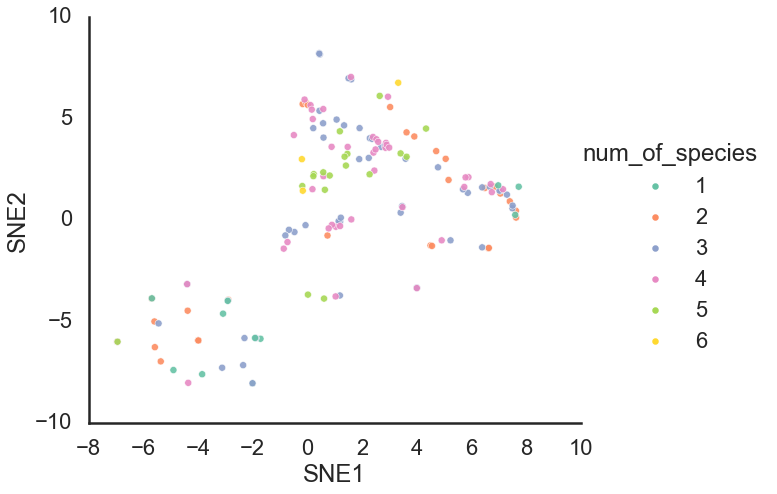

In [150]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='num_of_species', 
            #size='num_of_species', 
            palette='Set2',
            s=50, alpha=0.9, height=7, aspect=1.2,
            legend='full'
           )

In [151]:
dfpca.columns

Index(['SNE1', 'SNE2', 'Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL'],
      dtype='object')

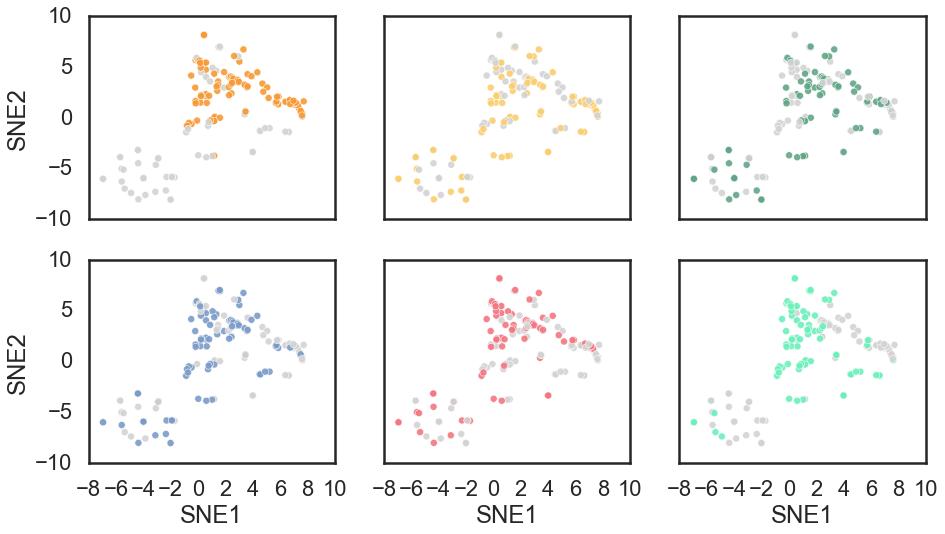

In [152]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True)
for idx,i in enumerate(species):
    sns.scatterplot(data=dfpca, x='SNE1', y='SNE2', hue=i, 
            #size='num_of_species',
            s=50, alpha=0.9, #height=5, aspect=1.2,
            legend=None, 
                    palette=[other_color, color_dict[i]],
                ax=axs[idx//3, idx%3],
                
           )

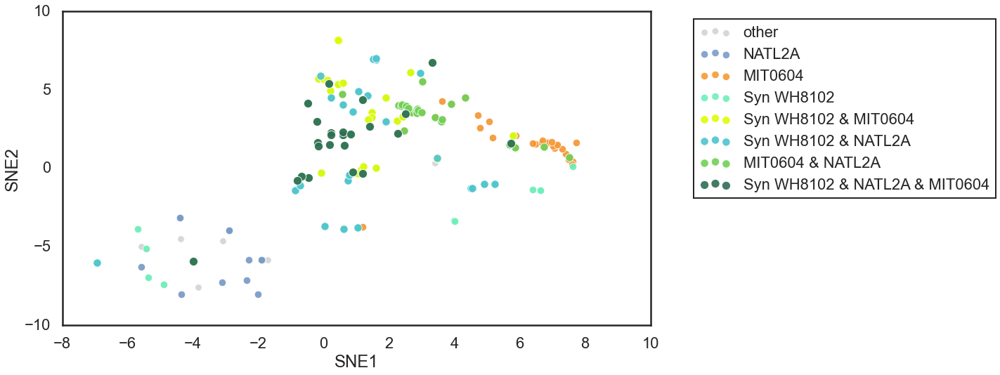

In [153]:
sns.scatterplot(data=dfpca, x='SNE1', y='SNE2', 
            s=90, alpha=0.9, #height=5, aspect=1.2,
            color=other_color, label='other')
sns.scatterplot(data=dfpca[dfpca['NATL2A']], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=Natl2A_color, label='NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604']], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=MIT0604_color, label='MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102']], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=SYN_color, label='Syn WH8102')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['MIT0604']], 
                x='SNE1', y='SNE2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_0606_color, label='Syn WH8102 & MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A']], 
                x='SNE1', y='SNE2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_color, label='Syn WH8102 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604'] & dfpca['NATL2A']], 
                x='SNE1', y='SNE2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=natl_0604_color, label='MIT0604 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A'] & dfpca['MIT0604']], 
                x='SNE1', y='SNE2', 
            s=150, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_0604_color, label='Syn WH8102 & NATL2A & MIT0604')

plt.legend(bbox_to_anchor=(1.6, 1))

<AxesSubplot:xlabel='SNE1', ylabel='SNE2'>

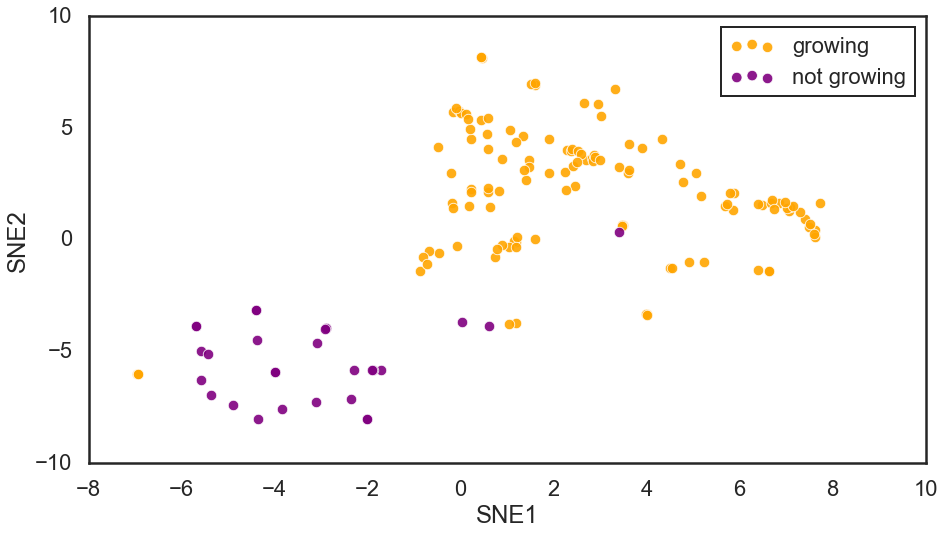

In [154]:

sns.scatterplot(data=dfpca[dfpca.Sample.isin(growing_samples)], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='orange', label='growing')
sns.scatterplot(data=dfpca[~dfpca.Sample.isin(growing_samples)], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='purple', label='not growing')


In [155]:
sample_col = 'Sample'
X = cp.experiments2X(exp2_df.loc[exp2_df.Sample.isin(growing_samples)], 
                     value_col='FL', sample_col='Sample', x_col='Day', cumsummode=False)
metadf = cp.get_meta(exp2_df.loc[exp2_df.Sample.isin(growing_samples)], 
                     meta_col=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
dfpca = cp.run_tsne(X=X, metadf=metadf, sample_col=sample_col)#, perplexity=50)

0.18578750097293034


In [156]:
X.shape

(126, 20)

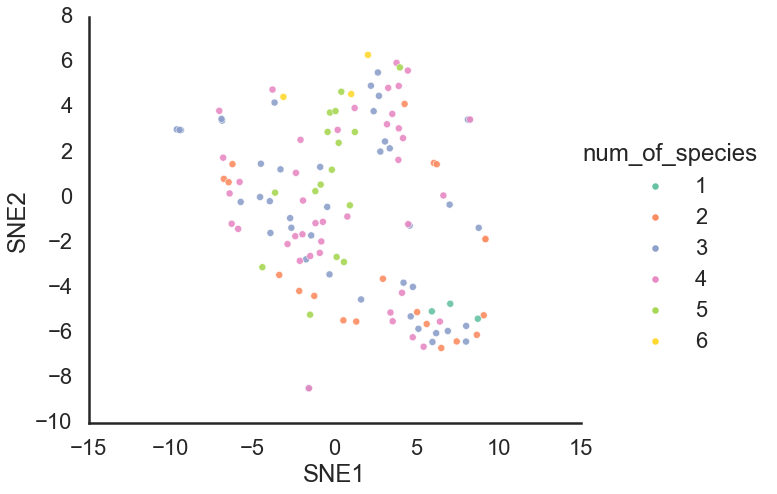

In [157]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='num_of_species', 
            #size='num_of_species', 
            palette='Set2',
            s=50, alpha=0.9, height=7, aspect=1.2,
            legend='full'
           )

In [158]:
dfpca.columns

Index(['SNE1', 'SNE2', 'Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL'],
      dtype='object')

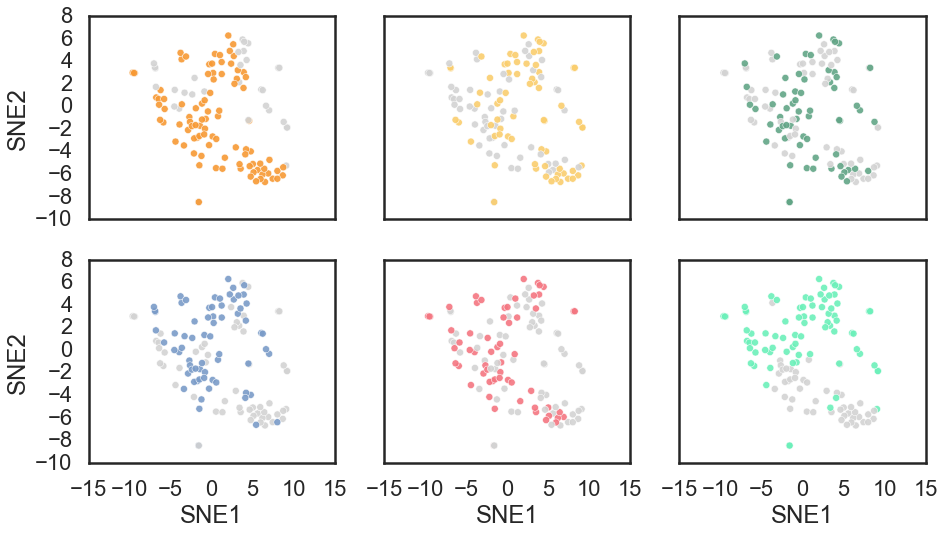

In [159]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True)
for idx,i in enumerate(species):
    sns.scatterplot(data=dfpca, x='SNE1', y='SNE2', hue=i, 
            #size='num_of_species',
            s=50, alpha=0.9, #height=5, aspect=1.2,
            legend=None, 
                    palette=[other_color, color_dict[i]],
                ax=axs[idx//3, idx%3],
                
           )

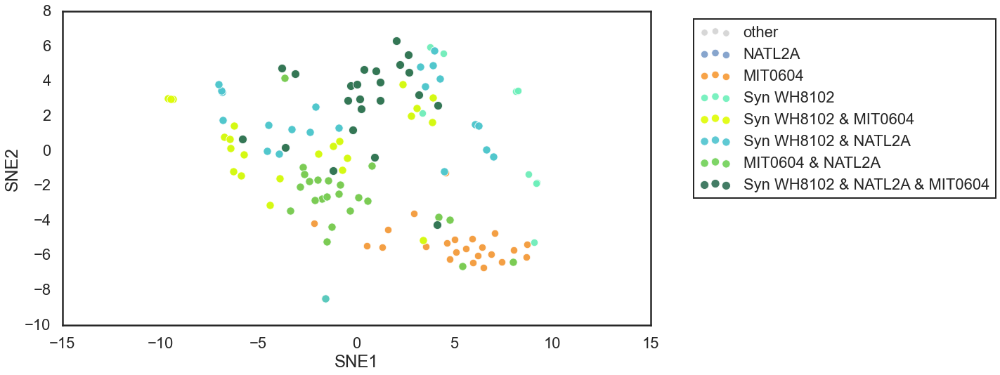

In [160]:
sns.scatterplot(data=dfpca, x='SNE1', y='SNE2', 
            s=90, alpha=0.9, #height=5, aspect=1.2,
            color=other_color, label='other')
sns.scatterplot(data=dfpca[dfpca['NATL2A']], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=Natl2A_color, label='NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604']], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=MIT0604_color, label='MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102']], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=SYN_color, label='Syn WH8102')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['MIT0604']], 
                x='SNE1', y='SNE2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_0606_color, label='Syn WH8102 & MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A']], 
                x='SNE1', y='SNE2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_color, label='Syn WH8102 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604'] & dfpca['NATL2A']], 
                x='SNE1', y='SNE2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=natl_0604_color, label='MIT0604 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A'] & dfpca['MIT0604']], 
                x='SNE1', y='SNE2', 
            s=150, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_0604_color, label='Syn WH8102 & NATL2A & MIT0604')

plt.legend(bbox_to_anchor=(1.6, 1))

<AxesSubplot:xlabel='SNE1', ylabel='SNE2'>

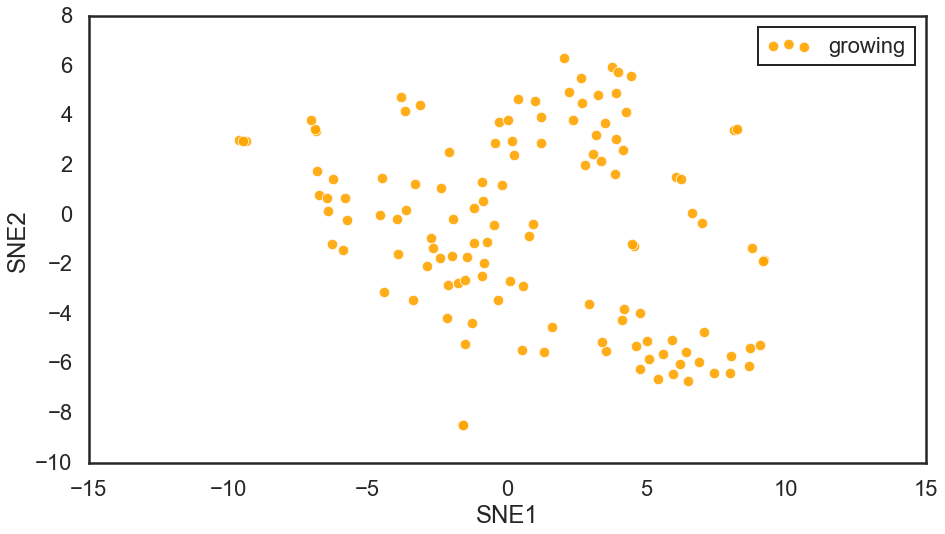

In [161]:

sns.scatterplot(data=dfpca[dfpca.Sample.isin(growing_samples)], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='orange', label='growing')
sns.scatterplot(data=dfpca[~dfpca.Sample.isin(growing_samples)], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='purple', label='not growing')


# cluster exp1

In [162]:
sample_col = 'Sample'
X = cp.experiments2X(exp1_df, value_col='FL', sample_col='Sample', x_col='Day', cumsummode=False)
metadf = cp.get_meta(exp1_df, meta_col=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
dfpca = cp.run_tsne(X=X, metadf=metadf, sample_col=sample_col)

0.3132652299657757


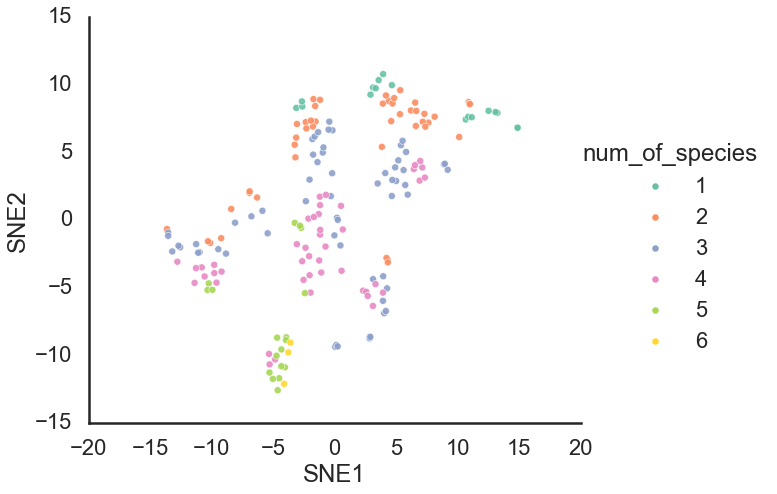

In [163]:
sns.relplot(data=dfpca, x='SNE1', y='SNE2', hue='num_of_species', 
            #size='num_of_species', 
            palette='Set2',
            s=50, alpha=0.9, height=7, aspect=1.2,
            legend='full'
           )

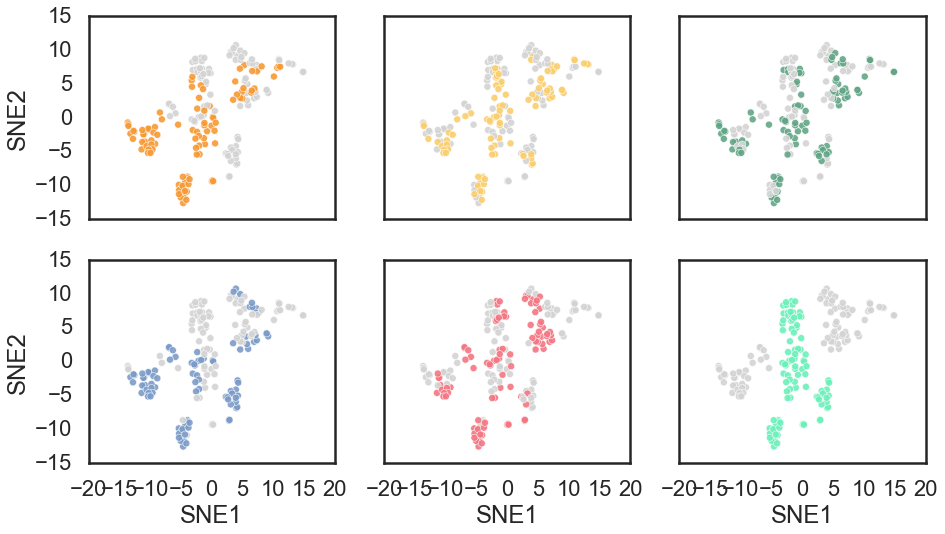

In [164]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True)
for idx,i in enumerate(species):
    sns.scatterplot(data=dfpca, x='SNE1', y='SNE2', hue=i, 
            #size='num_of_species',
            s=50, alpha=0.9, #height=5, aspect=1.2,
            legend=None, 
                    palette=[other_color, color_dict[i]],
                ax=axs[idx//3, idx%3],
                
           )

In [165]:
dfpca.columns


Index(['SNE1', 'SNE2', 'Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL'],
      dtype='object')

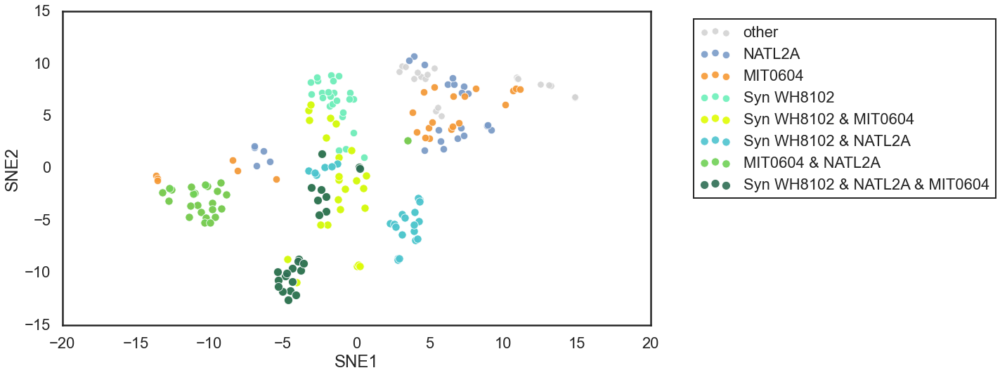

In [166]:
sns.scatterplot(data=dfpca, x='SNE1', y='SNE2', 
            s=90, alpha=0.9, #height=5, aspect=1.2,
            color=other_color, label='other')
sns.scatterplot(data=dfpca[dfpca['NATL2A']], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=Natl2A_color, label='NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604']], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=MIT0604_color, label='MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102']], 
                x='SNE1', y='SNE2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=SYN_color, label='Syn WH8102')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['MIT0604']], 
                x='SNE1', y='SNE2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_0606_color, label='Syn WH8102 & MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A']], 
                x='SNE1', y='SNE2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_color, label='Syn WH8102 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604'] & dfpca['NATL2A']], 
                x='SNE1', y='SNE2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=natl_0604_color, label='MIT0604 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A'] & dfpca['MIT0604']], 
                x='SNE1', y='SNE2', 
            s=150, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_0604_color, label='Syn WH8102 & NATL2A & MIT0604')

plt.legend(bbox_to_anchor=(1.6, 1))

In [167]:
dfpca.columns

Index(['SNE1', 'SNE2', 'Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL'],
      dtype='object')

# cluster exp2

In [168]:
sample_col = 'Sample'
X = cp.experiments2X(exp2_df, value_col='FL', sample_col='Sample', x_col='Day', cumsummode=False)
metadf = cp.get_meta(exp2_df, meta_col=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.30057493 0.27248231]


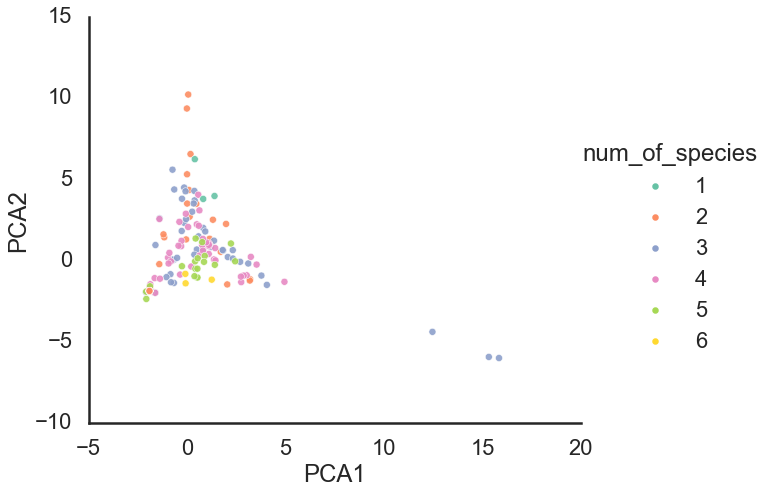

In [169]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='num_of_species', 
            #size='num_of_species', 
            palette='Set2',
            s=50, alpha=0.9, height=7, aspect=1.2,
            legend='full'
           )

In [170]:
dfpca.columns

Index(['PCA1', 'PCA2', 'Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL'],
      dtype='object')

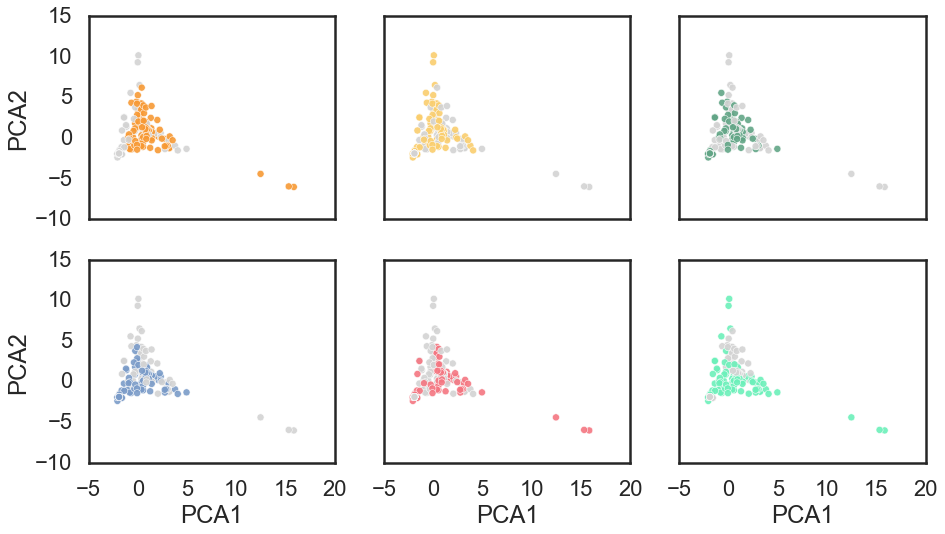

In [171]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True)
for idx,i in enumerate(species):
    sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', hue=i, 
            #size='num_of_species',
            s=50, alpha=0.9, #height=5, aspect=1.2,
            legend=None, 
                    palette=[other_color, color_dict[i]],
                ax=axs[idx//3, idx%3],
                
           )

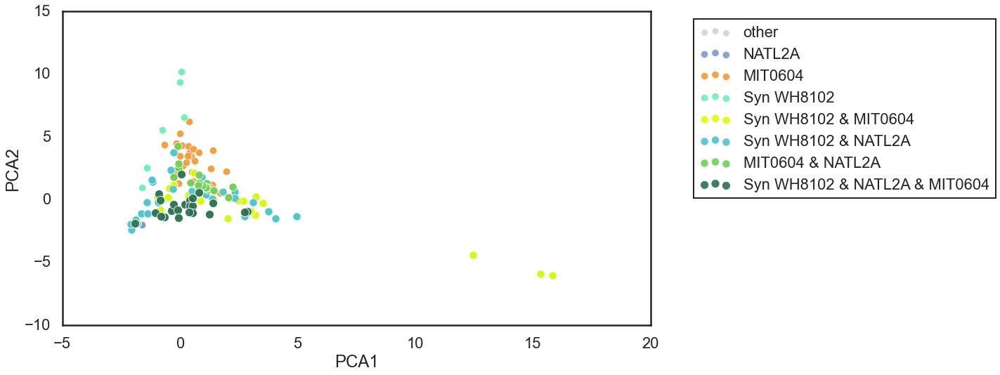

In [172]:
sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', 
            s=90, alpha=0.9, #height=5, aspect=1.2,
            color=other_color, label='other')
sns.scatterplot(data=dfpca[dfpca['NATL2A']], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=Natl2A_color, label='NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604']], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=MIT0604_color, label='MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102']], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=SYN_color, label='Syn WH8102')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['MIT0604']], 
                x='PCA1', y='PCA2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_0606_color, label='Syn WH8102 & MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A']], 
                x='PCA1', y='PCA2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_color, label='Syn WH8102 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604'] & dfpca['NATL2A']], 
                x='PCA1', y='PCA2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=natl_0604_color, label='MIT0604 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A'] & dfpca['MIT0604']], 
                x='PCA1', y='PCA2', 
            s=150, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_0604_color, label='Syn WH8102 & NATL2A & MIT0604')

plt.legend(bbox_to_anchor=(1.6, 1))

<AxesSubplot:xlabel='PCA1', ylabel='PCA2'>

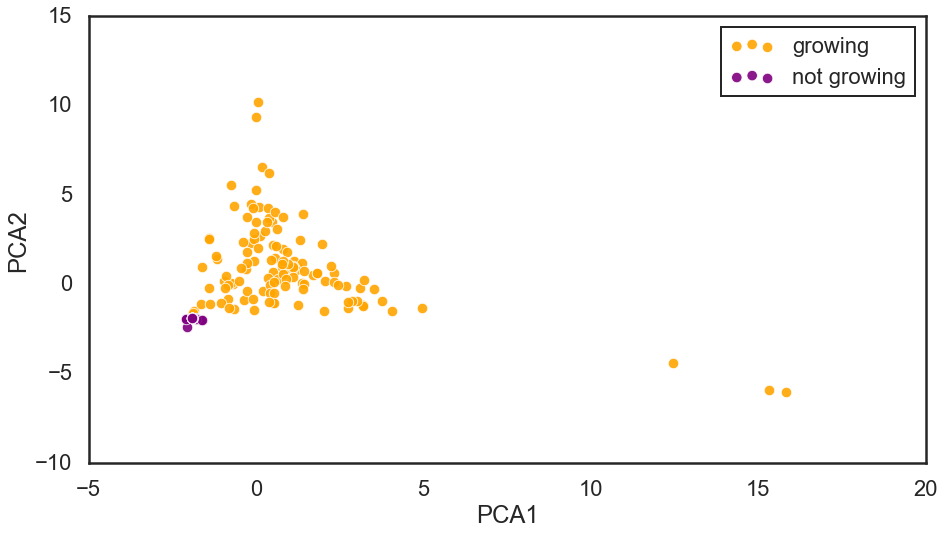

In [173]:

sns.scatterplot(data=dfpca[dfpca.Sample.isin(growing_samples)], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='orange', label='growing')
sns.scatterplot(data=dfpca[~dfpca.Sample.isin(growing_samples)], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='purple', label='not growing')


In [174]:
sample_col = 'Sample'
X = cp.experiments2X(exp2_df.loc[exp2_df.Sample.isin(growing_samples)], 
                     value_col='FL', sample_col='Sample', x_col='Day', cumsummode=False)
metadf = cp.get_meta(exp2_df.loc[exp2_df.Sample.isin(growing_samples)], 
                     meta_col=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)#, perplexity=50)

Variance percent explained
 [0.34990279 0.16837425]


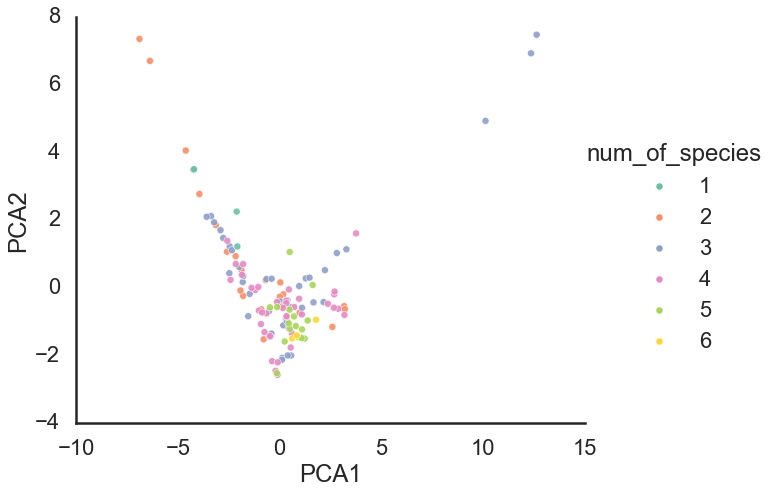

In [175]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='num_of_species', 
            #size='num_of_species', 
            palette='Set2',
            s=50, alpha=0.9, height=7, aspect=1.2,
            legend='full'
           )

In [176]:
dfpca.columns

Index(['PCA1', 'PCA2', 'Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL'],
      dtype='object')

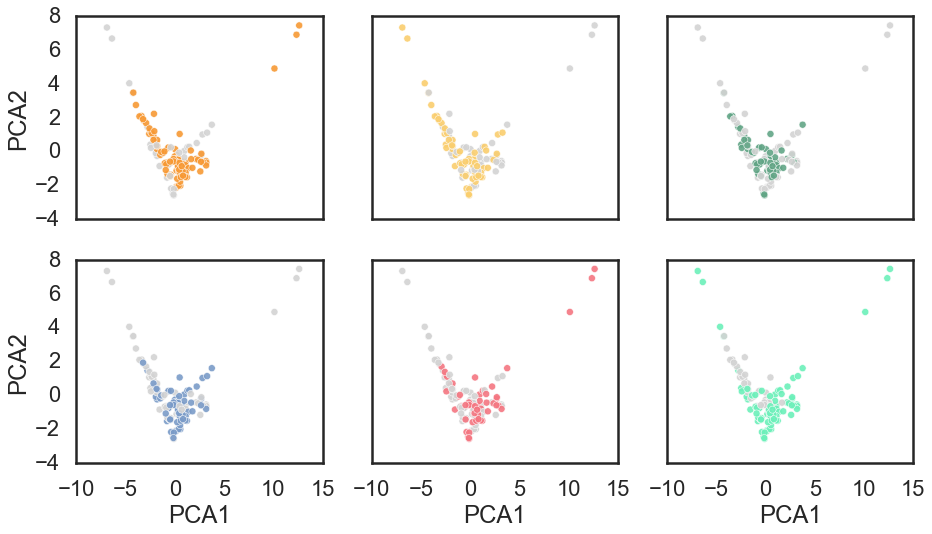

In [177]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True)
for idx,i in enumerate(species):
    sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', hue=i, 
            #size='num_of_species',
            s=50, alpha=0.9, #height=5, aspect=1.2,
            legend=None, 
                    palette=[other_color, color_dict[i]],
                ax=axs[idx//3, idx%3],
                
           )

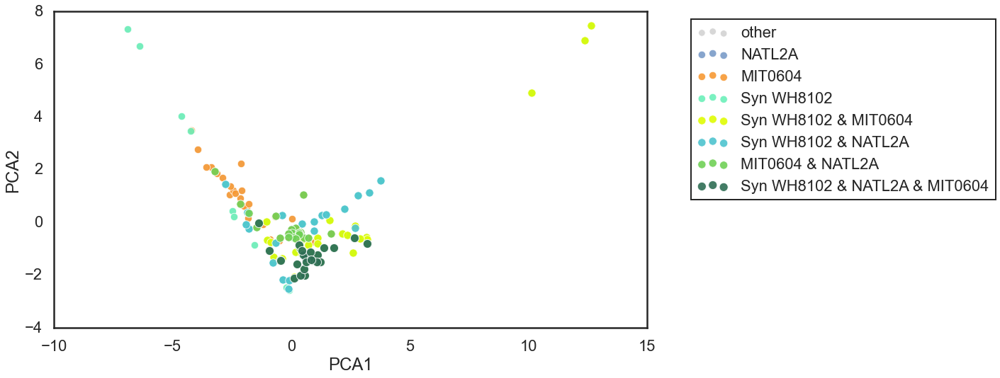

In [178]:
sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', 
            s=90, alpha=0.9, #height=5, aspect=1.2,
            color=other_color, label='other')
sns.scatterplot(data=dfpca[dfpca['NATL2A']], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=Natl2A_color, label='NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604']], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=MIT0604_color, label='MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102']], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=SYN_color, label='Syn WH8102')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['MIT0604']], 
                x='PCA1', y='PCA2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_0606_color, label='Syn WH8102 & MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A']], 
                x='PCA1', y='PCA2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_color, label='Syn WH8102 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604'] & dfpca['NATL2A']], 
                x='PCA1', y='PCA2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=natl_0604_color, label='MIT0604 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A'] & dfpca['MIT0604']], 
                x='PCA1', y='PCA2', 
            s=150, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_0604_color, label='Syn WH8102 & NATL2A & MIT0604')

plt.legend(bbox_to_anchor=(1.6, 1))

<AxesSubplot:xlabel='PCA1', ylabel='PCA2'>

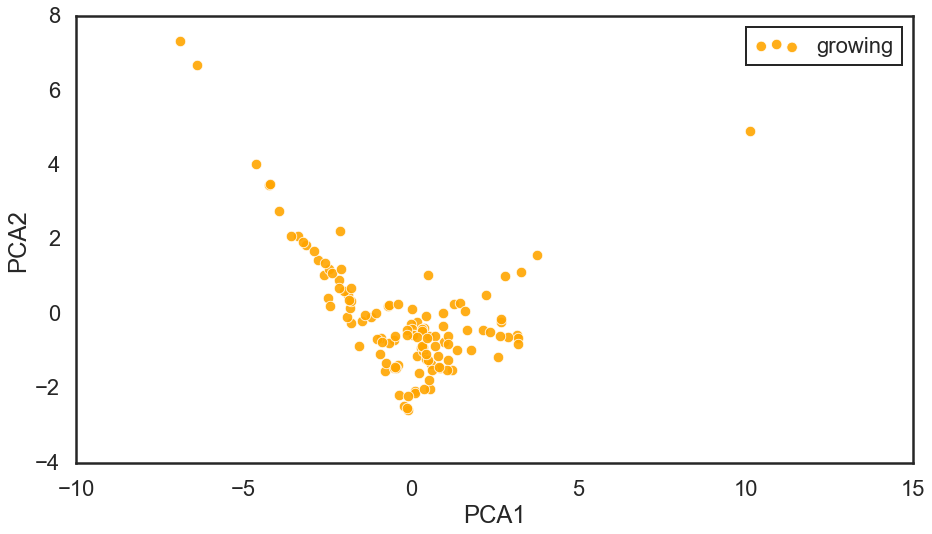

In [179]:

sns.scatterplot(data=dfpca[dfpca.Sample.isin(growing_samples)], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='orange', label='growing')
sns.scatterplot(data=dfpca[~dfpca.Sample.isin(growing_samples)], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='purple', label='not growing')


# cluster exp1

In [180]:
sample_col = 'Sample'
X = cp.experiments2X(exp1_df, value_col='FL', sample_col='Sample', x_col='Day', cumsummode=False)
metadf = cp.get_meta(exp1_df, meta_col=['Sample', 'sample_prefix', 'MED4',
       'MIT9313', 'MIT9312', 'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species',
       'ssp'])
dfpca = cp.run_pca(X=X, metadf=metadf, sample_col=sample_col)

Variance percent explained
 [0.38164458 0.18550091]


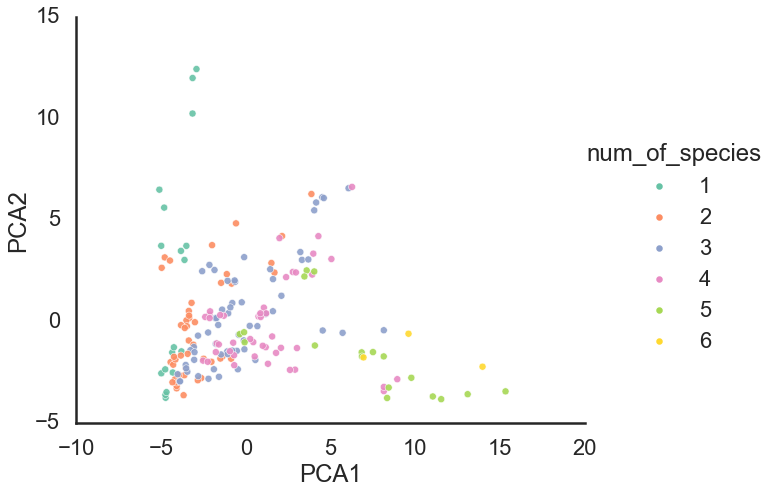

In [181]:
sns.relplot(data=dfpca, x='PCA1', y='PCA2', hue='num_of_species', 
            #size='num_of_species', 
            palette='Set2',
            s=50, alpha=0.9, height=7, aspect=1.2,
            legend='full'
           )

In [182]:
dfpca.columns

Index(['PCA1', 'PCA2', 'Sample', 'sample_prefix', 'MED4', 'MIT9313', 'MIT9312',
       'NATL2A', 'MIT0604', 'Syn WH8102', 'num_of_species', 'ssp', 'FL'],
      dtype='object')

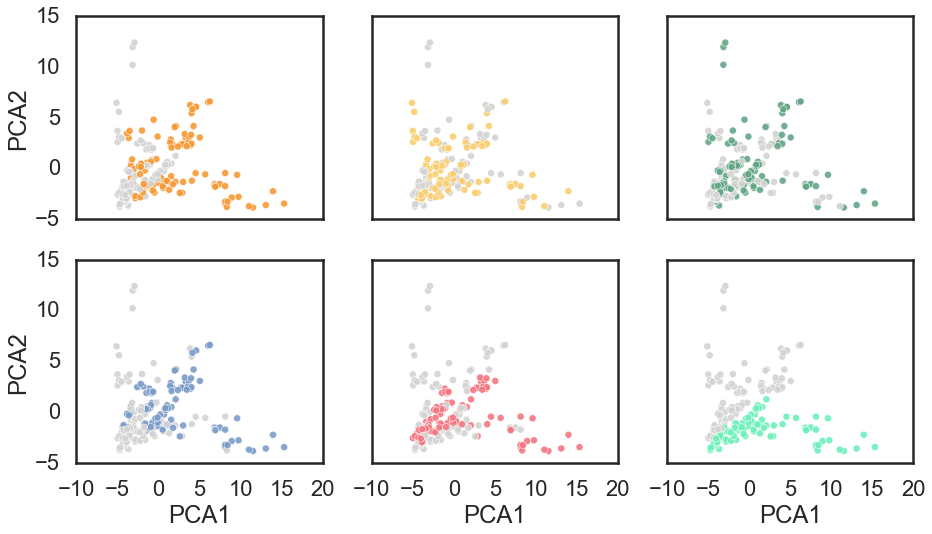

In [183]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True)
for idx,i in enumerate(species):
    sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', hue=i, 
            #size='num_of_species',
            s=50, alpha=0.9, #height=5, aspect=1.2,
            legend=None, 
                    palette=[other_color, color_dict[i]],
                ax=axs[idx//3, idx%3],
                
           )

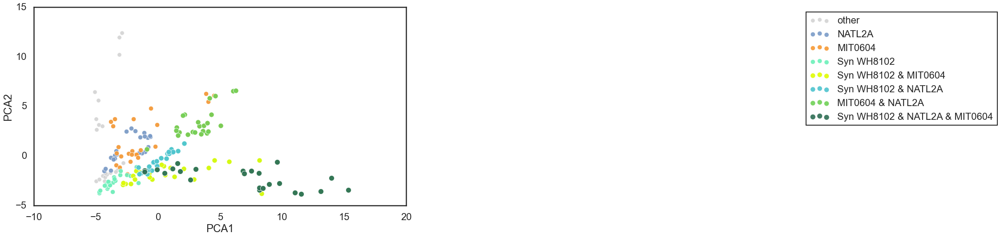

In [184]:
sns.scatterplot(data=dfpca, x='PCA1', y='PCA2', 
            s=90, alpha=0.9, #height=5, aspect=1.2,
            color=other_color, label='other')
sns.scatterplot(data=dfpca[dfpca['NATL2A']], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=Natl2A_color, label='NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604']], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=MIT0604_color, label='MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102']], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color=SYN_color, label='Syn WH8102')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['MIT0604']], 
                x='PCA1', y='PCA2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_0606_color, label='Syn WH8102 & MIT0604')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A']], 
                x='PCA1', y='PCA2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_color, label='Syn WH8102 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['MIT0604'] & dfpca['NATL2A']], 
                x='PCA1', y='PCA2', 
            s=130, alpha=0.9, #height=5, aspect=1.2,
            color=natl_0604_color, label='MIT0604 & NATL2A')
sns.scatterplot(data=dfpca[dfpca['Syn WH8102'] & dfpca['NATL2A'] & dfpca['MIT0604']], 
                x='PCA1', y='PCA2', 
            s=150, alpha=0.9, #height=5, aspect=1.2,
            color=syn_natl_0604_color, label='Syn WH8102 & NATL2A & MIT0604')

plt.legend(bbox_to_anchor=(2.6, 1))

<AxesSubplot:xlabel='PCA1', ylabel='PCA2'>

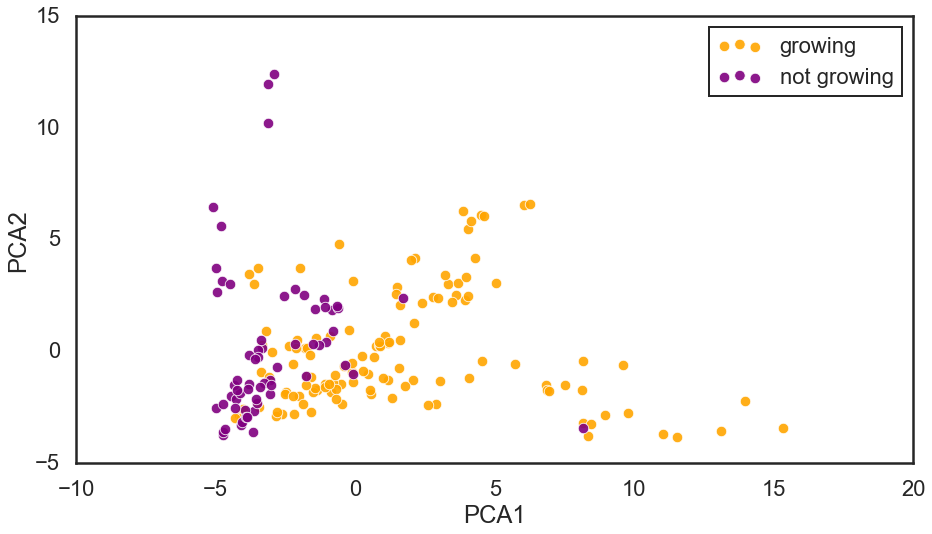

In [185]:

sns.scatterplot(data=dfpca[dfpca.Sample.isin(growing_samples)], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='orange', label='growing')
sns.scatterplot(data=dfpca[~dfpca.Sample.isin(growing_samples)], 
                x='PCA1', y='PCA2', 
            s=110, alpha=0.9, #height=5, aspect=1.2,
            color='purple', label='not growing')
